In [1]:
import glob
import os
from multiprocessing import Pool
import shutil
from pathlib import Path

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

In [2]:
output_path = Path("outputs")
output_path.mkdir(exist_ok=True)

In [3]:
import neuron_morphology

In [4]:
neuron_morphology.__version__

'1.1.3'

In [5]:
# Morphology visualization imports
from neuron_morphology.swc_io import morphology_from_swc
from neuron_morphology.constants import AXON, BASAL_DENDRITE, SOMA

In [6]:
# Morphology feature extraction imports
from neuron_morphology.feature_extractor.data import Data
from neuron_morphology.feature_extractor.feature_extractor import FeatureExtractor
from neuron_morphology.feature_extractor.utilities import unnest
from neuron_morphology.features.default_features import default_features

In [7]:
swc_files = glob.glob('/external/rprshnas01/external_data/aibs/AIBS_patchseq_2020/mouse/morphology/download.brainlib.org+8811/biccn/zeng/pseq/morph/200526/*_transformed.swc')

In [8]:
len(swc_files)

538

### fMOST method for generating 2D images

/tmp/ipykernel_21787/3864930889.py:12: FutureWarning: Using short name for 'orient' is deprecated. Only the options: ('dict', list, 'series', 'split', 'records', 'index') will be used in a future version. Use one of the above to silence this warning.
  nodes = swc_data.to_dict('record')


Text(0.5, 1.0, 'z-y view')

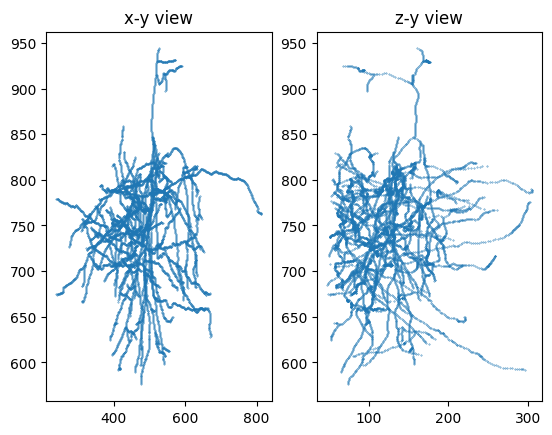

In [9]:
import neuron_morphology.swc_io as swcio
from neuron_morphology.morphology import Morphology
from neuron_morphology.swc_io import morphology_from_swc
from neuron_morphology.feature_extractor.data import Data
from neuron_morphology.feature_extractor.feature_extractor import FeatureExtractor
from neuron_morphology.features.default_features import default_features
from neuron_morphology.constants import (
    SOMA, AXON, BASAL_DENDRITE, APICAL_DENDRITE
)

def prepare_neuron_tree(swc_data):
    nodes = swc_data.to_dict('record')

    replace_type = 2 # default node type
    for node in nodes:
        node['parent'] = int(node['parent'])
        node['id'] = int(node['id'])
        node['type'] = int(node['type'])

        if node['parent'] == -1 and node['type'] != 1:
            replace_type = node['type']

        if node['type'] == 1 and node['parent'] != -1:
            node['type'] = replace_type

    soma_list = []
    for node in nodes:
        if node['type'] == 1:
            soma_list.append(node)

    # create a new soma point
    if len(soma_list) > 1:
        x = 0
        y = 0
        z = 0
        n = len(soma_list)
        for node in soma_list:
            x += node['x']
            y += node['y']
            z += node['z']

        soma = copy.deepcopy(soma_list[0])
        soma['id'] = nodes[-1]['id']
        soma['x'] = x/n
        soma['y'] = y/n
        soma['z'] = z/n
        nodes.append(soma)

        for node in soma_list:
            node['parent'] = soma['id']
            node['type'] = replace_type
    
    return nodes

# load single file
swc_data = swcio.read_swc(swc_files[0])

nodes = prepare_neuron_tree(swc_data)
test_data = Data(Morphology(nodes, node_id_cb=lambda node: node['id'], parent_id_cb=lambda node: node['parent']))

# visualize
x = [node['x'] for node in nodes]
y = [node['y'] for node in nodes]
z = [node['z'] for node in nodes]

fig, ax = plt.subplots(1, 2)
ax[0].scatter(x, y, s=0.1)
ax[0].set_title('x-y view')
ax[1].scatter(z, y, s=0.1)
ax[1].set_title('z-y view')

### Plotting method

In [10]:
def plot_morphology(file):#, output_path):
    morph = morphology_from_swc(file)
    
    axon_nodes = morph.get_node_by_types([AXON])
    dend_nodes = morph.get_node_by_types([BASAL_DENDRITE])
    soma_nodes = morph.get_node_by_types([SOMA])

    axon_x = [node['x'] for node in axon_nodes]
    axon_y = [node['y'] for node in axon_nodes]

    dend_x = [node['x'] for node in dend_nodes]
    dend_y = [node['y'] for node in dend_nodes]

    soma_x = [node['x'] for node in soma_nodes]
    soma_y = [node['y'] for node in soma_nodes]


    plt.figure(figsize=(10, 10))

    plt.scatter(axon_x, axon_y, s=1, edgecolor="none")
    plt.scatter(dend_x, dend_y, s=1, edgecolor="none")
    plt.scatter(soma_x, soma_y, s=20, c="black", edgecolor="none")


    plt.gca().set(xticks=[], yticks=[])
    plt.gca().set_aspect("equal")
    sns.despine(left=True, bottom=True)

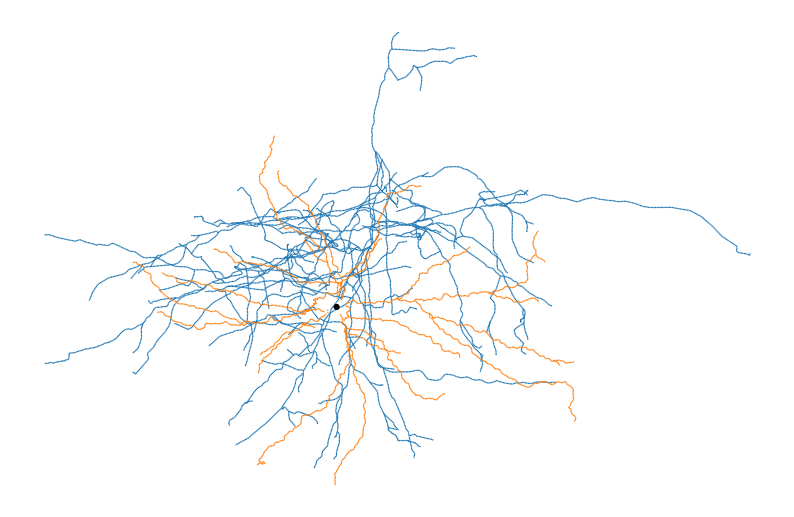

In [11]:
plot_morphology(swc_files[0])

In [12]:
# Feature Extractor (result from working cell)
fe = FeatureExtractor()
fe.register_features(default_features)
feature_extraction_run = fe.extract(test_data)
feature_extraction_run.results

2023-11-09 17:00:01,266 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:01,267 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:01,268 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:01,270 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58e99670>>
2023-11-09 17:00:01,271 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:01,271 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:01,272 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:01,272 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:00:01,294 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:01,294 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

{'axon.compartment.dimension': {'width': 573.3226751503015,
  'height': 367.2821725534693,
  'depth': 257.3679442283186,
  'min_xyz': array([-236.78600031, -144.02032291,  -55.1542817 ]),
  'max_xyz': array([336.53667484, 223.26184964, 202.21366253]),
  'bias_xyz': array([ 99.75067453,  79.24152673, 147.05938084])},
 'all_neurites.compartment.dimension': {'width': 573.3226751503015,
  'height': 367.2821725534693,
  'depth': 257.3679442283186,
  'min_xyz': array([-236.78600031, -144.02032291,  -55.1542817 ]),
  'max_xyz': array([336.53667484, 223.26184964, 202.21366253]),
  'bias_xyz': array([ 99.75067453,  79.24152673, 147.05938084])},
 'dendrite.compartment.dimension': {'width': 573.3226751503015,
  'height': 367.2821725534693,
  'depth': 257.3679442283186,
  'min_xyz': array([-236.78600031, -144.02032291,  -55.1542817 ]),
  'max_xyz': array([336.53667484, 223.26184964, 202.21366253]),
  'bias_xyz': array([ 99.75067453,  79.24152673, 147.05938084])},
 'basal_dendrite.compartment.dimen

In [13]:
def flatten_features(fd):
    fd_flat = {}
    for k, v in fd.items():
        if type(v) == dict:
            for vk, vv in v.items():
                subkey = k + "_" + vk
                if type(vv) == np.ndarray:
                    fd_flat[subkey + "_x"] = vv[0]
                    fd_flat[subkey + "_y"] = vv[1]
                    fd_flat[subkey + "_z"] = vv[2]
                else:
                    fd_flat[subkey] = vv
        else:
            fd_flat[k] = v
    return fd_flat

def extract_features(file):
    morph = morphology_from_swc(file)
    
    fe = FeatureExtractor()
    fe.register_features(default_features)

    feature_extraction_run = fe.extract(Data(morph))
    return flatten_features(dict(feature_extraction_run.results))

def process_features(file):
    name = os.path.basename(file)[:9]
    print(f"Collecting features from Cell {name}.\n")
    try:
        features = extract_features(file)
        return name, features
    except:
        return name, None
    
def collect_morph_features(files, chunksize):
    feature_dict = {}
    fail_count = 0
    fail_cells = []
    with Pool() as p:
        for name, features in p.imap_unordered(process_features, files, chunksize=chunksize):
            if features:
                feature_dict[name] = features
            else:
                fail_count += 1
                fail_cells.append(name)
    df = pd.DataFrame.from_dict(feature_dict, orient="index")
   
    print(f"Collected morphology features from {len(files) - fail_count} cells.")
    print(f"Failed cells: {fail_cells}")
    
    return df



In [14]:
features = extract_features("/external/rprshnas01/external_data/aibs/AIBS_patchseq_2020/mouse/morphology/download.brainlib.org+8811/biccn/zeng/pseq/morph/200526/713132614_transformed.swc")

2023-11-09 17:00:16,834 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:16,835 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:16,835 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:16,837 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef65b9f340>>
2023-11-09 17:00:16,838 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:16,838 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:16,839 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:16,840 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:00:16,862 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:16,862 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

ZeroDivisionError: division by zero

In [15]:
morph_feats = collect_morph_features(swc_files, chunksize=6)

2023-11-09 17:00:30,545 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:30,550 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:30,546 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:30,551 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:30,551 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:30,556 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,552 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:30,552 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef588b93d0>>
2023-11-09 17:00:30,553 root         INFO     skipping feature: axon.norm

2023-11-09 17:00:30,571 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef588b93d0>>
2023-11-09 17:00:30,571 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,571 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef588b93d0>>
2023-11-09 17:00:30,571 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,572 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,572 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra mark

2023-11-09 17:00:30,585 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,585 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,585 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,586 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,586 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,586 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,586 root         INFO     skipping feature: basa

2023-11-09 17:00:30,593 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,594 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,593 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:30,594 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,594 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,595 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,595 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,595 root         INFO     skipping feature: apical_dendrite.total_surfa

2023-11-09 17:00:30,606 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:30,586 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,607 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,598 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,607 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,607 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,608 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Foun

2023-11-09 17:00:30,615 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,615 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,615 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,615 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,615 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,615 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,616 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found ext

2023-11-09 17:00:30,623 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef588b93d0>>
2023-11-09 17:00:30,623 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,623 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,623 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,624 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,623 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['Re

2023-11-09 17:00:30,630 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,630 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,630 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,630 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,630 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,630 root         INFO     skippin

2023-11-09 17:00:30,634 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,634 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,626 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,629 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,634 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,634 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,634 root  

2023-11-09 17:00:30,641 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,641 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,641 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,642 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,642 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,

2023-11-09 17:00:30,645 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,646 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,646 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,646 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,646 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,647 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:0

2023-11-09 17:00:30,648 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,648 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,649 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,649 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'al

2023-11-09 17:00:30,657 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,657 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,658 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,659 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node

2023-11-09 17:00:30,682 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,683 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,683 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,684 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,685 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,685 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,684 root         INFO    

2023-11-09 17:00:30,709 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,710 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,708 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,711 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,711 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointD

2023-11-09 17:00:30,731 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

2023-11-09 17:00:30,784 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,784 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,784 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,784 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,785 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,785 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,785 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,786 root  

2023-11-09 17:00:30,801 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,801 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,801 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,801 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,801 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,802 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['R

2023-11-09 17:00:30,808 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,808 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,809 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,809 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,809 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,810 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,810 roo

2023-11-09 17:00:30,818 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,819 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,819 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,819 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,820 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,820 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-1

2023-11-09 17:00:30,830 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,829 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,830 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,830 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58ca1d60>>
2023-11-09 17:00:30,830 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,830 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,8

2023-11-09 17:00:30,837 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,836 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,837 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,837 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,837 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,837 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,838 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['Requires

2023-11-09 17:00:30,847 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,847 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,846 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,847 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,847 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,848 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,848 root      

2023-11-09 17:00:30,854 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,854 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,854 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,854 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,855 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,855 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDep

2023-11-09 17:00:30,865 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:30,865 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,865 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num

2023-11-09 17:00:30,870 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,870 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,870 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,870 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef653394c0>>
2023-11-09 17:00:30,871 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,871 root         INFO     s

2023-11-09 17:00:30,889 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,889 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,890 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,890 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,890 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:30,891 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical'

2023-11-09 17:00:30,899 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,904 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,905 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,907 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,907 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:30,908 root         INFO     skipping

2023-11-09 17:00:31,212 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:31,213 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:00:31,214 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:00:31,214 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:00:31,215 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:00:31,216 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:00:31,217 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:00:31,218 root         INFO     skipping featur

2023-11-09 17:00:31,230 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:31,231 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:31,233 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:00:31,233 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:00:31,234 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:00:31,235 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:00:31,236 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2

2023-11-09 17:00:31,481 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:31,483 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:31,488 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef653394c0>>
2023-11-09 17:00:31,490 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:31,491 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:31,493 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:31,494 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:31,495 root         INFO     skipping fea

2023-11-09 17:00:31,641 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:31,642 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:00:31,644 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:00:31,645 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:00:31,647 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:31,648 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:00:31,649 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:31,647 root         

2023-11-09 17:00:31,728 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:31,729 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:31,730 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:31,731 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:31,731 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:31,734 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['Requ

2023-11-09 17:00:31,791 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:31,793 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:31,795 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:31,797 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites

2023-11-09 17:00:32,497 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:00:32,652 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:32,658 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:32,660 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:32,664 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef65ce1220>>
2023-11-09 17:00:32,667 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:32,670 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:32,671 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:32,672 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:00:32,920 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:32,929 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:32,931 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:32,933 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:32,935 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointD

2023-11-09 17:00:32,987 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:00:33,039 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:00:33,133 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:33,131 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:00:33,146 root         INFO     skipping mark (validation failed): type


2023-11-09 17:00:33,139 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:33,153 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:33,155 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef653394c0>>
2023-11-09 17:00:33,157 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:33,159 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:33,148 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:33,161 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:33,163 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:00:33,241 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:33,242 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:33,243 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:33,244 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:33,245 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:00:33,245 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:00:33,246 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:00:33,254 root         INFO     skipping feature

2023-11-09 17:00:33,315 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:00:33,316 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:00:33,318 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:33,319 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:00:33,300 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:00:33,331 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:00:33,319 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:33,337 root        

2023-11-09 17:00:33,386 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:00:33,388 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:33,389 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:33,390 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:33,390 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:33,391 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:33,392 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:33,393 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra

2023-11-09 17:00:33,464 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:00:33,472 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:00:33,473 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:00:33,465 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:33,478 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:00:33,482 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:33,491 root         INFO     skipping feature: apical_dend

2023-11-09 17:00:33,639 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:33,647 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:33,654 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:33,656 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:33,658 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:33,660 root         INFO     sk

2023-11-09 17:00:33,989 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:00:34,015 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:00:34,041 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:34,063 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:34,071 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:34,080 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:34,084 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:34,086 root

2023-11-09 17:00:34,368 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:34,376 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:34,393 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:34,415 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:34,422 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite

2023-11-09 17:00:34,799 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:34,808 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'apical_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'apical_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'apical_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'apical_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_den

2023-11-09 17:00:35,705 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:00:35,734 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:35,740 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:35,739 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:00:35,743 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:35,768 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58d1a1c0>>
2023-11-09 17:00:35,775 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:35,767 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:35,785 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:35,788 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:35,792 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:35,794 root         INFO     skipping mar

2023-11-09 17:00:35,873 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:35,874 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:35,875 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:35,880 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:00:35,866 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:35,876 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found 

2023-11-09 17:00:35,927 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:35,944 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:35,954 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:35,961 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:35,961 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:35,969 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDep

2023-11-09 17:00:36,059 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:36,085 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:36,104 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:36,125 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:36,146 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:36,17

2023-11-09 17:00:37,081 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:37,082 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:37,084 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:37,098 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef6379ac70>>
2023-11-09 17:00:37,119 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:37,147 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:37,154 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:37,181 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:00:37,264 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:00:37,269 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:00:37,270 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:00:37,273 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:00:37,275 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:00:37,276 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:00:37,299 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:00:

2023-11-09 17:00:37,420 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:37,423 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:37,424 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:37,426 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:37,428 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:37,430 root         INFO     

2023-11-09 17:00:37,550 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:37,552 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:37,554 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:37,555 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:37,557 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:37,559 root         INFO     sk

/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/neuron_morphology/features/statistics/moments.py:46: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  (_, _, mean, variance, skew, kurt) = stats.describe(coordinates, axis=0)
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: invalid value encountered in multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1522: RuntimeWarning: Precision loss occurred in moment calculation due to catastro

2023-11-09 17:00:38,413 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:38,430 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:38,432 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:38,433 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:38,435 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:38,437 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresAp

2023-11-09 17:00:38,458 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff098791220>>
2023-11-09 17:00:38,474 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:38,476 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:38,486 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:38,487 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']


2023-11-09 17:00:38,488 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:00:38,499 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:00:38,506 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:00:38,511 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:00:38,524 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:00:38,537 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:00:38,550 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:00:38,564 root         INFO     s

2023-11-09 17:00:38,621 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:00:38,650 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:00:38,660 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:38,668 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:38,682 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:38,693 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 17:00:38,699 root         INFO     skipping mark (validation failed): type


2023-11-09 17:00:38,697 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:38,701 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:38,702 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:38,703 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:38,704 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:38,705 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:38,707 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:00:38,710 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-

2023-11-09 17:00:38,857 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:00:38,859 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:38,860 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:38,858 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:00:38,862 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:38,855 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter

2023-11-09 17:00:38,916 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:38,926 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:00:38,940 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:38,942 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:38,946 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:38,947 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
202

2023-11-09 17:00:38,998 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:39,023 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:39,038 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:39,050 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:39,062 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:

2023-11-09 17:00:39,096 root         INFO     skipping mark (validation failed): type


2023-11-09 17:00:39,097 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:39,100 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:39,108 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c01d60>>
2023-11-09 17:00:39,110 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:39,112 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:39,114 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:39,101 root         INFO     skipping feature: ap

2023-11-09 17:00:39,166 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:39,168 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:39,169 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:39,171 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:39,174 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:39,184 root    

2023-11-09 17:00:39,510 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:39,518 root         INFO     skipping mark (validation failed): type


2023-11-09 17:00:39,538 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58aac280>>
2023-11-09 17:00:39,543 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:39,556 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:39,569 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:39,583 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:39,595 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:00:39,607 root         INFO     skipping feature: apical_dendrite.num_branches. Found e

2023-11-09 17:00:39,893 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

2023-11-09 17:00:40,065 root         INFO     skipping mark (validation failed): type


2023-11-09 17:00:40,068 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:40,075 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:40,083 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58b6bb20>>
2023-11-09 17:00:40,085 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:40,087 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:40,089 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:40,090 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:40,092 root         INFO     skipping fea

2023-11-09 17:00:40,175 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:40,177 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:00:40,602 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:00:40,617 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:00:40,626 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:00:40,629 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:00:40,641 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:00:40,655 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:00:40,669 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:00:40,684 roo

2023-11-09 17:00:40,821 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:40,811 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:40,822 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:40,826 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:00:40,827 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:40,828 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:40,832 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:40,829 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:40,836 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:40,837 root         INFO     skipping featu

2023-11-09 17:00:40,927 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:40,933 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:40,954 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:40,973 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c01d60>>
2023-11-09 17:00:40,982 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:40,986 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:40,990 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:40,994 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:00:41,199 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:41,203 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:00:41,810 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:41,817 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:41,832 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:41,849 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58aac280>>
2023-11-09 17:00:41,851 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:41,861 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:41,876 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:41,890 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:00:41,977 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:00:42,000 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:00:42,008 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:00:42,034 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:00:42,060 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:00:42,083 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:00:42,109 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:42,135 root       

2023-11-09 17:00:42,463 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:00:42,476 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:00:42,491 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:00:42,502 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:00:42,514 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:00:42,530 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:00:42,542 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:00:42,554 root         INFO     s

2023-11-09 17:00:42,564 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']


2023-11-09 17:00:42,581 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:00:42,591 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:00:42,604 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:00:42,619 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:00:42,636 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:00:42,650 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:42,664 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:42,670 root       

2023-11-09 17:00:42,835 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:00:42,854 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:00:42,862 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:00:42,869 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:00:42,894 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:00:42,908 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:00:42,925 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:00:42,933

2023-11-09 17:00:43,545 root         INFO     skipping mark (validation failed): type


2023-11-09 17:00:43,552 root         INFO     skipping mark (validation failed): type


2023-11-09 17:00:43,563 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:43,577 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef65ce1220>>
2023-11-09 17:00:43,607 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:43,608 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:43,630 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:43,631 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:43,636 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:0

2023-11-09 17:00:43,929 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:43,935 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:43,941 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:43,943 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:43,945 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:00:43,964 root         INFO     skipping feature: apical_dendrite.mean_diameter. Foun

2023-11-09 17:00:44,200 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:44,208 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:44,212 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:44,214 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:44,219 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:44,229 root    

2023-11-09 17:00:44,899 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:44,907 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:44,933 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:44,943 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff09edba310>>
2023-11-09 17:00:44,965 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:44,986 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:44,989 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:45,000 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:00:45,172 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:00:45,178 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:00:45,185 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']


2023-11-09 17:00:45,187 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:00:45,205 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:45,207 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:45,209 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:45,211 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:45,213 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:45,215 root      

2023-11-09 17:00:45,352 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:45,352 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:45,356 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:45,353 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:45,361 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:00:45,361 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:45,369 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:00:45,374 root         INFO     ski

2023-11-09 17:00:45,596 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:45,598 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:45,606 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:45,604 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:45,616 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:45,615 root         INFO     skip

2023-11-09 17:00:45,779 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:45,793 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:00:46,486 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:46,493 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:46,505 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:46,520 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c01d60>>
2023-11-09 17:00:46,530 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:46,542 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:46,555 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:46,568 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:00:47,097 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:47,119 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:47,135 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:47,161 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:47,183 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 1

2023-11-09 17:00:47,413 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:47,430 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:47,434 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:00:47,436 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:00:47,441 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:00:47,443 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:00:47,446 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2

2023-11-09 17:00:48,646 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:48,665 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:48,686 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:48,709 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c3feb0>>
2023-11-09 17:00:48,734 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:48,756 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:48,763 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:48,777 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:00:48,968 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:48,971 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:00:49,795 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:00:50,025 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:50,027 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:50,044 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:50,056 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58911bb0>>
2023-11-09 17:00:50,070 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:50,065 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:50,073 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:50,080 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:50,081 root         INFO     skipping mark (validation fai

2023-11-09 17:00:50,199 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:50,200 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:50,195 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:50,201 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:50,209 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:50,192 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:00:50,210 root   

2023-11-09 17:00:50,254 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:00:50,254 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:00:50,260 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:00:50,262 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:00:50,264 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:00:50,265 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:00:50,275 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09

2023-11-09 17:00:50,395 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:50,413 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:50,428 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:50,442 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:50,455 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:

2023-11-09 17:00:51,130 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:51,132 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:51,139 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:51,148 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58911bb0>>
2023-11-09 17:00:51,150 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:51,153 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:51,159 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:51,164 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:00:51,296 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:51,312 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:51,318 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:51,322 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:51,327 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:51,332 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:51,337 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:00:51,341 root         INF

2023-11-09 17:00:51,436 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:51,439 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:00:51,441 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:00:51,447 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:00:51,451 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:00:51,453 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:00:51,458 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:00:51,466 root         INFO     skipping featur

2023-11-09 17:00:51,481 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:00:51,483 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']


2023-11-09 17:00:51,496 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:00:51,499 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:51,514 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:51,529 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:51,551 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:51,569 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:51,594 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:51,619 root         I

2023-11-09 17:00:51,908 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:00:51,923 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:51,925 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:00:51,924 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:51,930 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:00:51,934 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:51,936 root         INFO  

2023-11-09 17:00:51,992 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:52,014 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:52,036 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:52,057 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:52,065 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresAp

2023-11-09 17:00:53,231 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:53,235 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:53,239 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:53,243 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58ca1d60>>
2023-11-09 17:00:53,247 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:53,253 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:53,271 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:53,297 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:00:53,594 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:53,608 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:00:54,012 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:54,033 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:54,054 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:54,058 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58adda00>>
2023-11-09 17:00:54,072 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:54,076 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:54,086 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:54,087 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:00:54,197 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:00:54,203 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:00:54,201 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:00:54,202 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']


2023-11-09 17:00:54,225 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:00:54,231 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:54,241 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:54,242 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:54,246 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:54,256 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:54,257 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:54,259 root         I

2023-11-09 17:00:54,486 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:54,493 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:54,507 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:54,524 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58d27c40>>
2023-11-09 17:00:54,533 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:54,543 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:54,561 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:54,584 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:00:55,080 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:00:55,083 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:55,088 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:00:55,092 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:55,102 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:55,096 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:00:55,110 root       

2023-11-09 17:00:55,334 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:55,335 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:00:55,337 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:00:55,338 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:00:55,338 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:00:55,339 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:55,340 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresRef

2023-11-09 17:00:55,341 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:55,371 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:55,397 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:55,399 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:55,399 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:55,396 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:55,402 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDe

2023-11-09 17:00:55,634 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:00:55,640 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:00:55,649 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:55,659 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:55,662 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:55,664 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPoint

2023-11-09 17:00:56,909 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:56,912 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:56,924 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:56,953 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58ac2370>>
2023-11-09 17:00:56,961 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:56,987 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:57,000 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:57,022 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:00:57,082 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:00:57,104 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:00:57,122 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:00:57,134 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:00:57,157 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:00:57,178 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:00:57,186 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:00:57,208 roo

2023-11-09 17:00:57,385 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:00:57,396 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:00:57,414 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:00:57,425 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:00:57,445 root         INFO     skipping mark (validation failed): type
2023-11-09 17:00:57,450 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:57,451 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11

2023-11-09 17:00:57,560 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:57,561 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:57,562 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:57,566 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:00:57,568 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:00:57,567 root         INFO     skipping feature: apical_dendrite.mean_p

2023-11-09 17:00:57,642 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:00:57,651 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:00:57,653 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:00:57,649 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:57,668 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:00:57,666 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:00:57,669 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:00:57,678 roo

2023-11-09 17:00:57,783 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:57,782 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:57,775 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:00:57,785 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:57,787 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:57,789 root         INFO 

2023-11-09 17:00:57,875 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:00:57,893 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:00:57,905 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:00:57,923 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:00:57,939 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:00:57,961 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:00:57,988 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:00:58,01

2023-11-09 17:00:58,350 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:58,369 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:58,387 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:58,403 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:58,426 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:00:58,436 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:58,443 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:58,445 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:58,447 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:58,449 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:58,451 root         I

2023-11-09 17:00:58,457 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:58,460 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:58,463 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:58,469 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:58,489 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDe

2023-11-09 17:00:58,545 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:58,547 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:58,549 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:58,551 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:00:58,543 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62f1d

2023-11-09 17:00:58,863 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:58,885 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:58,907 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:00:58,920 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:00:58,932 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:00:58,947 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:00:58,965 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:00:58,987 root         INFO     sk

2023-11-09 17:00:59,884 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:00:59,964 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:01:00,115 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:00,117 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:00,140 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:00,174 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62f2ceb0>>
2023-11-09 17:01:00,200 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:00,215 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:00,225 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:00,240 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:01:00,704 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:01:00,714 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:00,720 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:00,722 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:00,716 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:01:00,725 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'R

/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1523: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = kurtosis(a, axis, bias=bias)
2023-11-09 17:01:00,803 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:00,829 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:01:00,842 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:01:00,854 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:01:00,879 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023

2023-11-09 17:01:00,903 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:00,927 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:00,929 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:00,932 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:00,955 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:00,958 root    

2023-11-09 17:01:01,217 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']


2023-11-09 17:01:01,220 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:01,228 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:01:01,241 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:01:01,254 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:01:01,267 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:01:01,282 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:01:01,292 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:01:01,305 root         INFO     skipping featur

2023-11-09 17:01:01,621 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:01,642 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:01:01,661 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:01:01,647 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:01,670 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:01:01,676 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'Require

2023-11-09 17:01:02,062 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:02,065 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:02,068 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:02,070 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:02,073 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:02,075 root    

2023-11-09 17:01:02,973 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:01:02,981 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:02,983 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:02,988 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:03,014 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58d2d550>>


2023-11-09 17:01:03,016 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:03,020 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:03,024 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:03,036 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:03,050 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:01:03,051 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:01:03,052 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:01:03,053 root         INFO     skipping feature

2023-11-09 17:01:03,330 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:03,323 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:01:03,332 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:03,344 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:03,345 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:01:03,347 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth

2023-11-09 17:01:03,953 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:03,967 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:03,981 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:03,995 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:04,009 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDe

2023-11-09 17:01:04,727 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:04,733 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:04,743 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:04,762 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef65ce1220>>
2023-11-09 17:01:04,791 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:04,803 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:04,808 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:04,813 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:01:05,221 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:05,237 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:01:05,916 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:05,918 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:05,920 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:05,936 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58cd1be0>>
2023-11-09 17:01:05,949 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:05,978 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:05,992 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:05,997 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:01:06,054 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:01:06,072 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:01:06,099 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:01:06,127 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:01:06,156 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:01:06,172 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:01:06,173 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:01:

2023-11-09 17:01:06,251 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

2023-11-09 17:01:06,334 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:01:06,360 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:01:06,381 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:01:06,403 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:01:06,410 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:01:06,409 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:06,418 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:06,423 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morpholo

2023-11-09 17:01:06,571 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:06,601 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:06,606 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:06,618 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:06,644 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 1

2023-11-09 17:01:07,586 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:07,608 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:07,626 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c953d0>>
2023-11-09 17:01:07,632 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:07,636 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:07,641 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:07,649 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:07,647 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_r

2023-11-09 17:01:07,678 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:01:07,683 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:07,681 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:07,684 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:07,685 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:07,695 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:07,693 root         INFO     skip

2023-11-09 17:01:07,753 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:07,779 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:07,766 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:07,781 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:07,784 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:07,788 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Fou

2023-11-09 17:01:07,913 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:07,914 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:07,916 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:07,937 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:07,938 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:07,940 root         I

2023-11-09 17:01:09,903 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:09,908 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:09,930 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:09,954 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58aac280>>
2023-11-09 17:01:09,963 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:09,989 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:10,014 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:10,027 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:01:10,228 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:01:10,253 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:01:10,259 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:01:10,269 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:10,287 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:10,313 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:10,334 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:10,340 roo

2023-11-09 17:01:10,438 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:01:10,450 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:10,451 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:10,449 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:10,455 root         INFO     skipping mark (validation failed): type


2023-11-09 17:01:10,452 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:10,462 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef653d2e50>>
2023-11-09 17:01:10,464 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:10,465 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:10,466 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:10,467 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:10,469 root         INFO     s

2023-11-09 17:01:10,512 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:01:10,513 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:01:10,522 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:10,544 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:10,570 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:10,597 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:10,624 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:10,652 root

2023-11-09 17:01:11,004 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62e60280>>
2023-11-09 17:01:11,019 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:11,044 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:11,058 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:11,062 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:11,080 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:01:11,087 root         INFO     skipping feature: apical_dendrite.num_branches. Found e

2023-11-09 17:01:11,249 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:01:11,254 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:11,257 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:11,259 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:11,261 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:11,263 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:01:11,265 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:11,268 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:11,270 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:11,273 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:11,275 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:11,277 root    

2023-11-09 17:01:11,296 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:11,304 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:11,306 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:11,310 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:11,327 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDe

2023-11-09 17:01:11,499 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:01:11,496 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:01:11,509 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:01:11,505 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:01:11,514 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:01:11,520 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:01:11,515 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:01:11,528 r

2023-11-09 17:01:11,667 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:11,669 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:11,666 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c1d280>>
2023-11-09 17:01:11,672 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:11,666 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09

2023-11-09 17:01:11,756 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:01:11,767 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:01:11,777 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:01:11,767 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:11,780 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:11,780 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:01:11,781 root    

2023-11-09 17:01:11,866 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:11,880 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:11,890 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:11,909 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:11,916 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDe

2023-11-09 17:01:12,300 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:12,307 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:12,319 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:12,337 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef637dce80>>
2023-11-09 17:01:12,351 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:12,367 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:12,383 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:12,411 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:01:12,967 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:12,982 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:12,990 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:12,994 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:12,998 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointD

2023-11-09 17:01:13,637 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:13,639 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:13,642 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:01:13,645 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:01:13,648 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:01:13,651 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:01:13,654 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2

2023-11-09 17:01:13,946 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:13,948 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:13,966 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:13,982 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62f2ceb0>>
2023-11-09 17:01:13,988 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:14,001 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:14,016 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:14,031 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:01:14,531 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:14,552 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:01:16,784 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:16,791 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:16,808 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58b6bb20>>
2023-11-09 17:01:16,815 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:16,828 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:16,843 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:16,861 root         INFO     skipping fea

2023-11-09 17:01:17,269 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:17,274 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:17,303 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:17,331 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58d07fa0>>
2023-11-09 17:01:17,359 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:17,388 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:17,412 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:17,435 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:01:17,614 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:17,617 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:01:17,778 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:01:17,786 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:01:17,870 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:17,869 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:17,876 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:17,876 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:17,878 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:17,878 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:17,883 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58b6bb20>>
2023-11-09 17:01:17,885 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:17,887 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:17,884 root        

2023-11-09 17:01:17,956 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:17,957 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:17,943 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:01:17,960 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:17,965 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:17,963 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:17,970 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:17,965 root    

2023-11-09 17:01:18,030 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'apical_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'apical_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'apical_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'apical_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'apical_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'apical_dendrite.num_branches', 'axon.num_tips',

2023-11-09 17:01:18,057 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:18,079 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:18,099 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:18,113 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:18,122 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:18,136 root    

2023-11-09 17:01:18,819 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:01:18,843 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:01:18,853 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:01:18,937 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:18,943 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:18,947 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:18,960 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58ae9670>>
2023-11-09 17:01:18,962 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:18,963 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:18,964 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:18,950 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:18,

2023-11-09 17:01:19,065 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:01:19,066 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:01:19,068 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:01:19,054 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:01:19,069 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:19,053 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:01:19,071 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceL

2023-11-09 17:01:19,117 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:19,131 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:19,133 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:19,136 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:19,138 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:19,14

2023-11-09 17:01:19,226 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:01:19,229 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:01:19,230 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:01:19,231 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:01:19,232 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:19,237 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:19,246 root         INFO     skipping feature: dendrite.normalized_depth_his

2023-11-09 17:01:19,424 root         INFO     skipping mark (validation failed): type


2023-11-09 17:01:19,452 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58ca1d60>>
2023-11-09 17:01:19,458 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:19,484 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:19,500 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:19,513 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:19,525 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:01:19,537 root         INFO     skipping feature: apical_dendrite.num_branches. Found e

2023-11-09 17:01:19,738 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

2023-11-09 17:01:20,414 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:20,421 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:20,436 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:20,451 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:20,473 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDe

2023-11-09 17:01:21,089 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:21,096 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:21,103 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:21,122 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c8a610>>
2023-11-09 17:01:21,136 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:21,153 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:21,168 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:21,184 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:01:21,429 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:21,442 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:01:21,451 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/neuron_morphology/features/statistics/moments.py:46: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  (_, _, mean, variance, skew, kurt) = stats.describe(coordinates, axis=0)
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: invalid value encountered in multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1522: RuntimeWarning: Precision loss occurred in moment calculation due to catastro

2023-11-09 17:01:24,718 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:01:24,941 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:24,948 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:24,963 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:24,973 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef653d2e50>>
2023-11-09 17:01:24,979 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:24,986 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:24,990 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:24,998 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:01:25,144 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']


2023-11-09 17:01:25,154 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:01:25,159 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:01:25,162 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:25,164 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:25,167 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:25,169 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPoint

2023-11-09 17:01:25,341 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:25,340 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:25,355 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:25,356 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef637cf040>>
2023-11-09 17:01:25,361 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:25,361 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:25,370 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
202

2023-11-09 17:01:25,564 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:25,567 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:25,567 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:25,572 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:25,579 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:25,573 root         INFO     skipping feature: all_neurites.normal

2023-11-09 17:01:25,667 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:25,669 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:25,668 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:25,674 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:25,684 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:25,686 root         INFO 

2023-11-09 17:01:25,753 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:25,768 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c058e0>>
2023-11-09 17:01:25,786 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:25,800 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:25,808 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:25,820 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:25,832 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:0

2023-11-09 17:01:26,498 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:26,517 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:01:26,865 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 17:01:26,879 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:26,882 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:01:26,888 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:01:26,893 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:01:26,897 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:01:26,906 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:26,911 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresRef

2023-11-09 17:01:27,023 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:27,041 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:27,061 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:27,081 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:27,092 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:27,112 root         INFO     skipping feature: 

2023-11-09 17:01:29,144 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:01:29,170 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:29,175 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:29,184 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:29,195 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58ca1d60>>
2023-11-09 17:01:29,199 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:29,206 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:29,213 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:29,217 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:01:29,428 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:29,437 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:01:29,444 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:01:29,448 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:01:29,434 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:29,450 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:29,458 root         INFO     skipping feature: dendrite.normalize

2023-11-09 17:01:29,621 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:29,645 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:29,667 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:29,691 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:29,718 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite

2023-11-09 17:01:30,814 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:30,839 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:30,853 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:30,868 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef6379cc40>>
2023-11-09 17:01:30,875 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:30,884 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:30,906 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:30,919 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:01:30,936 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']


2023-11-09 17:01:30,965 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:01:30,967 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:01:30,968 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:01:30,969 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:01:30,970 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:01:30,972 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:01:30,974 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:01:30,995 roo

2023-11-09 17:01:31,037 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:31,047 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:31,050 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:31,051 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:01:31,045 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:31,059 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:31,062 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:31,053 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:31,079 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:31,066 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:31,085 root         INFO     skipping feature: d

2023-11-09 17:01:31,134 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']


2023-11-09 17:01:31,160 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:31,171 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:31,173 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:31,188 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:31,204 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:31,219 root         INFO     skipping

2023-11-09 17:01:31,269 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:31,272 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:01:31,285 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:31,311 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:31,315 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:31,327 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:31,337 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:31,338 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths'

2023-11-09 17:01:31,419 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:01:31,422 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:01:31,425 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:01:31,427 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:01:31,430 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:31,432 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:31,434 root         INFO     skipping feature: dendrite.normalized_depth_his

2023-11-09 17:01:31,488 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58b6bb20>>
2023-11-09 17:01:31,490 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:31,492 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:31,494 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:31,497 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:31,499 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:01:31,501 root         INFO     skipping feature: apical_dendrite.num_branches. Found e

2023-11-09 17:01:31,572 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:31,586 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:31,593 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:01:31,594 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:01:31,595 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:01:31,596 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:01:31,597 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['Re

2023-11-09 17:01:31,638 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:31,640 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:31,642 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:31,644 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:31,646 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:31,648 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:31,651 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:31,653 root         

2023-11-09 17:01:31,712 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:31,739 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:31,763 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:31,784 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:31,810 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:31,832 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:31,851 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:01:31,870 root         INF

2023-11-09 17:01:33,153 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:33,161 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:33,176 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:33,195 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58add850>>
2023-11-09 17:01:33,209 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:33,220 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:33,238 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:33,247 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:01:33,464 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:33,472 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:33,477 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:01:33,486 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:01:33,490 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:01:33,502 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:01:33,534 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:33,527 root         INFO     skipping feature: axon.normalized_depth_histogra

2023-11-09 17:01:33,661 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:33,683 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:33,692 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:33,705 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:33,720 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:33,735 root         INFO     

2023-11-09 17:01:34,213 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:01:34,337 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:34,346 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:34,362 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:34,379 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62f1d970>>
2023-11-09 17:01:34,394 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:34,404 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:34,414 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:34,425 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:01:34,638 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:01:34,639 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:34,642 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:34,644 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:34,647 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:34,649 root         INFO     skipping feature: apical_dendrite.axon.earth_mo

2023-11-09 17:01:34,719 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:34,721 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:34,724 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:34,726 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:34,729 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:34,731 root    

2023-11-09 17:01:36,499 root         WARNING  feature extraction failed for axon.mean_fragmentation


/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/neuron_morphology/features/statistics/moments.py:46: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  (_, _, mean, variance, skew, kurt) = stats.describe(coordinates, axis=0)
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: invalid value encountered in multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1522: RuntimeWarning: Precision loss occurred in moment calculation due to catastro

2023-11-09 17:01:36,821 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:36,824 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:36,826 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:36,827 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:01:36,829 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:36,835 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:01:36,830 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:36,844 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:01:36,856 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:36,857 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra ma

2023-11-09 17:01:36,873 root         INFO     skipping mark (validation failed): type


2023-11-09 17:01:36,882 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:01:36,900 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:36,897 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c1d8e0>>
2023-11-09 17:01:36,906 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:36,906 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:36,909 root         INFO     skipping feature: apical_den

2023-11-09 17:01:36,956 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:36,957 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:36,970 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:36,975 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:36,976 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:36,982 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerD

2023-11-09 17:01:37,057 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:37,059 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:37,079 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:37,090 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:37,094 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11

2023-11-09 17:01:37,389 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:37,404 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:37,416 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:37,428 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:01:37,440 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:01:37,452 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:01:37,464 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:01:37,476 root         INFO     sk

2023-11-09 17:01:38,300 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:01:38,500 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:38,526 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:38,551 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:38,561 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58d2d6a0>>
2023-11-09 17:01:38,573 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:38,588 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:38,590 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:38,613 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:01:38,878 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:38,880 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:38,883 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:38,885 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:38,888 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11

2023-11-09 17:01:39,068 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:39,075 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:39,101 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:39,109 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c953d0>>
2023-11-09 17:01:39,120 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:39,130 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:39,138 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:39,150 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:01:39,263 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:01:39,272 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:01:39,283 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:01:39,307 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:01:39,329 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:01:39,357 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:01:39,344 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']


2023-11-09 17:01:39,368 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:01:39,372 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:01:39,384 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:39,396 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:39,418 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:39,420 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:39,417 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:39,428 root         INFO     skipping mark (validation fa

2023-11-09 17:01:39,541 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 17:01:39,546 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']


2023-11-09 17:01:39,542 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:39,547 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:39,550 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:01:39,557 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:39,557 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:01:39,561 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:01:39,563 root         INFO     sk

2023-11-09 17:01:39,630 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:39,642 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:39,640 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:39,649 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:39,650 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:39,651 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:39,644 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferen

2023-11-09 17:01:39,672 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

2023-11-09 17:01:39,726 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:01:39,738 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:01:39,751 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:01:39,762 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:01:39,784 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:01:39,795 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:01:39,820 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:01:39,835 roo

2023-11-09 17:01:40,448 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:40,470 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:40,492 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimensi

2023-11-09 17:01:40,713 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:01:40,753 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:40,759 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:40,763 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:40,781 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff098796b80>>
2023-11-09 17:01:40,806 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:40,812 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:40,802 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:40,816 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:40,818 root         INFO     skipping feature: apical_dend

2023-11-09 17:01:40,933 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:40,955 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:40,981 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:40,996 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:41,009 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:41,019 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:41,041 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:01:41,056 root         INF

2023-11-09 17:01:42,424 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:01:42,670 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:01:42,929 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:42,938 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:42,934 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:42,940 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:42,941 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:42,947 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c058e0>>
2023-11-09 17:01:42,945 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:42,949 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:42,955 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_m

2023-11-09 17:01:43,242 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:43,232 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:43,250 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:43,258 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:43,255 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:01:43,268 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:01:43,272 root         INFO     skipping feature: apical_dendrite.b

2023-11-09 17:01:43,437 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:43,461 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:43,468 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:43,493 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:43,515 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite

2023-11-09 17:01:44,791 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:44,793 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:44,798 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:44,805 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef653394c0>>
2023-11-09 17:01:44,809 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:44,814 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:44,820 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:44,825 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:01:45,014 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:45,020 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:01:45,308 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:45,315 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:45,328 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58b70130>>
2023-11-09 17:01:45,342 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:45,356 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:45,361 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:45,375 root         INFO     skipping fea

2023-11-09 17:01:46,182 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:01:46,398 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:46,405 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:46,417 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:46,436 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58ac2580>>
2023-11-09 17:01:46,453 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:46,469 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:46,477 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:46,493 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:01:46,942 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:01:46,952 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:46,954 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:46,957 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:46,987 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:47,001 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:47,017 root         INFO     

2023-11-09 17:01:47,160 root         INFO     skipping mark (validation failed): type


2023-11-09 17:01:47,163 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:47,175 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:47,199 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef651ffc70>>
2023-11-09 17:01:47,224 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:47,226 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:47,241 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:47,238 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:47,249 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:01:47,596 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:01:47,598 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:47,612 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:47,624 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:47,634 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:47,635 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurit

2023-11-09 17:01:47,911 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1522: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  sk = skew(a, axis, bias=bias)
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1523: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = kurtosis(a, axis, bias=bias)
2023-11-09 17:01:47,923 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 1

2023-11-09 17:01:48,214 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:48,224 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:48,235 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:48,252 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff098796910>>
2023-11-09 17:01:48,264 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:48,268 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:48,278 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:48,281 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:01:48,581 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:01:48,585 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:48,599 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:48,600 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:48,605 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:48,607 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDe

2023-11-09 17:01:48,756 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:48,764 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:48,769 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:01:48,773 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:01:48,778 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:01:48,782 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:01:48,789 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2

2023-11-09 17:01:48,921 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:01:48,924 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:48,927 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:48,929 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:48,932 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:48,934 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['R

2023-11-09 17:01:48,988 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

2023-11-09 17:01:50,613 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:50,619 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:50,631 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:50,650 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62e548b0>>
2023-11-09 17:01:50,666 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:50,679 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:50,693 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:50,705 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:01:50,809 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:01:50,821 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:01:50,824 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:01:50,850 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:01:50,862 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:01:50,860 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:50,870 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:50,880 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-

2023-11-09 17:01:51,000 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:51,004 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:51,004 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 

2023-11-09 17:01:52,922 root         WARNING  feature extraction failed for axon.mean_fragmentation


/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/neuron_morphology/features/statistics/moments.py:46: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  (_, _, mean, variance, skew, kurt) = stats.describe(coordinates, axis=0)
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
2023-11-09 17:01:53,051 root         INFO     skipping mark (validation failed): type
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: invalid value encountered in multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.

2023-11-09 17:01:53,131 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:53,140 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:53,144 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:53,168 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:01:53,192 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:01:53,213 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:01:53,240 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:01:53,258 root         INFO     skipping feature: a

2023-11-09 17:01:53,306 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:01:53,329 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:01:53,343 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:01:53,360 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:01:53,375 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:01:53,391 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:01:53,405 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:53,409 root       

2023-11-09 17:01:54,045 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:01:54,344 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:54,358 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:54,387 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:54,419 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62f1dd30>>
2023-11-09 17:01:54,444 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:54,458 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:54,462 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:54,477 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:01:55,128 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:01:55,133 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

2023-11-09 17:01:55,327 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 17:01:55,331 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:55,336 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:55,338 root         INFO     skipping mark (validation failed): type


2023-11-09 17:01:55,346 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62f2ceb0>>
2023-11-09 17:01:55,349 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:55,352 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:55,354 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:55,357 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']


2023-11-09 17:01:55,359 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:01:55,367 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:01:55,370 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:01:55,372 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:01:55,375 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:01:55,377 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:01:55,380 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:01:55,382 root         INFO     s

2023-11-09 17:01:55,419 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:01:55,421 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']


2023-11-09 17:01:55,431 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:01:55,453 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:01:55,468 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:55,478 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:55,486 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:55,503 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPoint

2023-11-09 17:01:55,619 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:55,640 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:55,666 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:55,675 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:01:55,691 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:01:55,704 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:01:55,716 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:01:55,728 root         INFO     skipping feature: a

2023-11-09 17:01:56,027 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:56,028 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:56,031 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:01:56,041 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:01:56,043 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:56,042 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:01:56,052 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: 

2023-11-09 17:01:56,183 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:56,211 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:56,239 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:56,265 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:56,288 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:56,314

2023-11-09 17:01:56,601 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:01:56,674 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:56,679 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:56,697 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c44190>>
2023-11-09 17:01:56,702 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:56,728 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:56,742 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:56,757 root         INFO     skipping fea

2023-11-09 17:01:56,893 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:56,885 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:56,896 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:56,898 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:56,901 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:56,903 root         INFO     skippi

2023-11-09 17:01:59,129 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:59,131 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:59,133 root         INFO     skipping mark (validation failed): type
2023-11-09 17:01:59,155 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58b40b20>>
2023-11-09 17:01:59,168 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:59,171 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:59,173 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:01:59,178 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:01:59,559 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:01:59,569 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:02:03,503 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:03,505 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:03,507 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:03,515 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58911bb0>>
2023-11-09 17:02:03,517 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:03,519 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:03,521 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:03,523 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:02:03,616 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:03,618 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:02:04,060 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:04,067 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:04,080 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:04,104 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58d20070>>
2023-11-09 17:02:04,106 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:04,107 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:04,124 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:04,149 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:02:04,945 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:04,970 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:02:05,793 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:05,800 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:05,815 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:05,832 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58ca1d60>>
2023-11-09 17:02:05,834 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:05,845 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:05,846 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:05,859 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:02:05,959 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:02:05,984 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:02:05,988 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:02:05,993 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:02:05,997 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']


2023-11-09 17:02:06,002 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:02:06,015 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:06,022 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:06,026 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:06,031 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:06,036 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:06,040 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:06,044 root         I

2023-11-09 17:02:06,157 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:02:06,162 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:02:06,165 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:02:06,177 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:02:06,191 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:02:06,207 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:02:06,218 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:06,227 root         INFO     skipping mark (validation failed): t

2023-11-09 17:02:06,396 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:06,404 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:02:06,426 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:06,413 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:06,429 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:06,435 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:06,428 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:06,441 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-1

2023-11-09 17:02:06,479 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:06,479 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:06,491 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c44190>>
2023-11-09 17:02:06,490 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:06,496 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:06,498 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:06,497 root         INFO     skipping feature: axon.nor

2023-11-09 17:02:06,530 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:06,531 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:06,533 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:06,534 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:06,535 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:06,536 root         INFO   

2023-11-09 17:02:06,657 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:06,668 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62f1dd30>>
2023-11-09 17:02:06,669 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.nod

2023-11-09 17:02:06,924 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:06,938 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:06,953 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:06,967 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:06,982 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDe

2023-11-09 17:02:07,033 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:07,047 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:07,059 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:07,069 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:07,085 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointD

2023-11-09 17:02:07,229 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:07,233 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:07,237 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:07,241 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:07,245 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:07,249 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:07,253 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2

2023-11-09 17:02:07,606 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:07,608 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:07,629 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:07,638 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62e4ce20>>
2023-11-09 17:02:07,665 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:07,691 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:07,717 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:07,724 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:02:07,953 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:07,967 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:07,980 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:08,007 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:08,036 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDe

2023-11-09 17:02:08,225 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:08,236 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']


2023-11-09 17:02:08,258 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:02:08,266 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:02:08,282 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:02:08,297 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:02:08,320 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:08,322 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:08,312 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:02:08,328 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:02:08,334

2023-11-09 17:02:08,471 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:08,473 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:08,475 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:08,478 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:08,480 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:08,481 root         I

2023-11-09 17:02:08,564 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:08,566 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:08,568 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:08,570 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:08,572 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:08,574 root         I

2023-11-09 17:02:08,959 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:08,984 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:08,991 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:09,005 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58d016a0>>
2023-11-09 17:02:09,008 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 17:02:09,015 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']


2023-11-09 17:02:09,021 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:09,033 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:09,039 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:09,051 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:02:09,059 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:02:09,063 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:02:09,064 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:02:09,065 root         INFO     skipping feature: a

2023-11-09 17:02:09,467 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:09,488 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:09,500 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:09,507 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff09edba310>>
2023-11-09 17:02:09,510 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:09,511 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:09,514 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:09,515 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:02:09,565 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:09,568 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:02:09,569 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:09,571 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:09,572 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:09,574 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:09,585 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:09,587 root    

/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/neuron_morphology/features/statistics/moments.py:46: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  (_, _, mean, variance, skew, kurt) = stats.describe(coordinates, axis=0)
2023-11-09 17:02:09,692 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:02:09,694 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:02:09,696 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
202

2023-11-09 17:02:09,800 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:09,802 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:09,804 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimensi

2023-11-09 17:02:09,900 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:09,903 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:09,905 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:09,908 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58acc880>>
2023-11-09 17:02:09,911 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:09,913 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:09,915 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:09,917 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:02:10,008 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:10,010 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:02:11,525 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:11,547 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:11,551 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:11,564 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58add850>>
2023-11-09 17:02:11,568 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:11,589 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:11,591 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:11,618 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:02:11,761 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:11,763 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:02:13,368 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:13,370 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:13,373 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58aac280>>
2023-11-09 17:02:13,375 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:13,377 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:13,379 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:13,381 root         INFO     skipping fea

2023-11-09 17:02:13,434 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:02:13,838 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:13,848 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:13,870 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:13,890 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:13,896 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:13,901 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:13,897 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58911bb0>>
2023-11-09 17:02:13,910 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62f1d970>>
2023-11-09 17:02:13,916 root         INFO 

2023-11-09 17:02:14,048 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:14,050 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:14,052 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:14,054 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:14,047 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:02:14,056 root         INFO     skipping feature: axon.dendrite.earth_move

2023-11-09 17:02:14,329 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:14,345 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:14,353 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:14,361 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:14,371 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:14,381 root    

2023-11-09 17:02:15,936 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:15,944 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:15,956 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:15,974 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58d016a0>>
2023-11-09 17:02:15,980 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:16,001 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:16,015 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:16,031 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:02:16,183 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']


2023-11-09 17:02:16,193 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:16,195 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:16,200 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:16,218 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:16,239 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:16,270 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:16,275 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:16,263 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']


2023-11-09 17:02:16,414 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:16,426 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:16,429 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:16,431 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:16,433 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:16,436 root         INFO 

2023-11-09 17:02:16,567 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:16,593 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:16,613 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimensi

2023-11-09 17:02:17,210 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:17,212 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:17,223 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:17,256 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58cabbb0>>
2023-11-09 17:02:17,258 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:17,266 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:17,271 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:17,277 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:02:17,348 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']


2023-11-09 17:02:17,352 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:02:17,358 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:02:17,361 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:02:17,370 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:02:17,375 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:17,381 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:17,390 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:17,396 root         

2023-11-09 17:02:17,548 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:02:17,551 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:02:17,553 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:17,555 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:17,558 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:17,560 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:17,562 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:17,564 root

2023-11-09 17:02:17,651 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:17,656 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:17,662 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:17,667 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:17,673 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointD

2023-11-09 17:02:18,089 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:18,097 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:18,112 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:18,129 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58aac280>>
2023-11-09 17:02:18,131 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:18,158 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:18,172 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:18,188 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:02:18,849 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:18,853 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:02:19,070 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 17:02:19,075 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:02:19,164 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:19,161 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:19,165 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:19,166 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:19,173 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:19,173 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:19,182 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58a79370>>
2023-11-09 17:02:19,192 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef65ce1220>>
2023-11-09 17:02:19,194 root         INFO 

2023-11-09 17:02:19,318 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:19,324 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:19,325 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:19,322 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:02:19,310 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:02:19,330 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:19,335 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:19,339 root 

2023-11-09 17:02:19,448 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:19,447 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:19,450 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:19,454 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:19,463 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:19,464 root         INFO     skipping feat

2023-11-09 17:02:19,511 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:19,521 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:19,523 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:19,532 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:19,530 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'R

2023-11-09 17:02:19,881 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:02:20,093 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:20,097 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:20,108 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:20,105 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:20,111 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef65c0e550>>
2023-11-09 17:02:20,119 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:20,119 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:20,122 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:20,127 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_m

2023-11-09 17:02:20,295 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:20,296 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:20,290 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:20,309 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:20,312 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:20,318 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:20,332 root         INFO     ski

2023-11-09 17:02:20,428 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:20,442 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:20,453 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:20,465 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:20,476 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite

2023-11-09 17:02:22,449 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:22,453 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:22,475 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:22,503 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef588690a0>>
2023-11-09 17:02:22,511 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:22,524 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:22,537 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:22,553 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:02:22,806 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:22,812 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 17:02:22,822 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:22,831 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:22,843 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:22,855 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:22,867 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:22,879 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:22,891 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresRef

2023-11-09 17:02:23,141 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:02:23,154 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:02:23,156 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:02:23,160 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']


2023-11-09 17:02:23,165 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']


2023-11-09 17:02:23,180 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:02:23,187 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:02:23,201 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:02:23,210 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:02:23,215 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:02:23,226 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:02:23,228 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:02:23,248 root

2023-11-09 17:02:23,349 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:23,333 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:02:23,337 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:23,363 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:23,355 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:02:23,365 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['R

2023-11-09 17:02:23,403 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:02:23,416 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:02:23,406 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:23,424 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:23,432 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'b

2023-11-09 17:02:23,424 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:02:23,440 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:02:23,442 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:02:23,444 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']


2023-11-09 17:02:23,465 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:02:23,485 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:23,493 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:23,504 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:23,510 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:23,514 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:23,515 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:23,513 root         INFO     skipping mark (validation failed): type
20

2023-11-09 17:02:23,675 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:02:23,680 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:02:23,676 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'de

2023-11-09 17:02:24,065 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:24,069 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:24,083 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:24,099 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:24,111 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite

2023-11-09 17:02:24,364 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:24,366 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:24,371 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:24,381 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff09871fe80>>
2023-11-09 17:02:24,386 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:24,392 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:24,394 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:24,399 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:02:24,633 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:24,637 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:02:25,285 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:25,289 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:25,307 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:25,335 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58aac280>>
2023-11-09 17:02:25,356 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:25,360 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']


2023-11-09 17:02:25,373 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']


2023-11-09 17:02:25,385 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:25,406 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:02:25,418 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:02:25,425 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:02:25,435 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:02:25,450 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:02:25,459 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:02:25,473 root         INFO     skipping featur

2023-11-09 17:02:25,835 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:25,842 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:25,844 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:25,845 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:25,841 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:25,847 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['Require

2023-11-09 17:02:25,974 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58a4fcd0>>
2023-11-09 17:02:25,983 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:02:25,984 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:25,994 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:25,993 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:02:25,994 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:02:25,999 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:02:26,003 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:26,005 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:02:26,007 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:02:26,010 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:02:26,015 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:02:26,018 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:02:26,020 root        

2023-11-09 17:02:26,153 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:26,153 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:02:26,159 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:26,160 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:26,162 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:26,164 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:02:26,166 

2023-11-09 17:02:26,277 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:26,280 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:26,282 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:26,284 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:26,287 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:26,29

2023-11-09 17:02:26,407 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:26,415 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:26,437 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:26,450 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:26,463 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:26,478 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['R

2023-11-09 17:02:27,353 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:27,361 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:27,387 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:27,401 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c3feb0>>
2023-11-09 17:02:27,412 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:27,425 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:27,438 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:27,453 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:02:27,656 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:02:27,659 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:27,661 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:27,664 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:27,666 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:27,668 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:27,671 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:27,673 root         I

2023-11-09 17:02:27,676 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:27,678 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:27,681 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:27,683 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:27,686 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:27,688 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:27,690 root         INFO     skipping feature: dendrite.normalized_depth_his

2023-11-09 17:02:27,997 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:28,000 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:28,027 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:28,041 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:28,054 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:02:28,066 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:02:28,079 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:02:28,092 root         INFO     skipping feature

2023-11-09 17:02:28,308 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:28,320 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:28,327 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:28,339 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:28,352 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:28,365 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:28,375 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresRef

2023-11-09 17:02:28,572 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:02:28,594 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:02:28,620 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:02:28,627 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:02:28,642 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:02:28,657 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:02:28,672 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:02:28,687 roo

2023-11-09 17:02:28,815 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:28,845 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:28,862 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:28,880 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:28,899 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:28,926 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:28,941 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:28,957 root         I

2023-11-09 17:02:29,277 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:29,303 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:29,326 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58b70a90>>
2023-11-09 17:02:29,342 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:29,358 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:29,366 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:29,388 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:29,402 root         INFO     skipping fea

2023-11-09 17:02:29,986 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:30,004 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:02:31,001 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:31,003 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:31,021 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:31,038 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58b66d30>>
2023-11-09 17:02:31,049 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:31,061 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:31,069 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:31,077 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:02:31,706 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:31,733 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:02:32,681 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:32,684 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:32,697 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58b66d30>>
2023-11-09 17:02:32,704 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:32,725 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:32,729 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:32,741 root         INFO     skipping fea

2023-11-09 17:02:33,028 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:02:33,178 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:33,180 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:33,183 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:33,188 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef65b9f6a0>>
2023-11-09 17:02:33,198 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:33,203 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:33,207 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:33,212 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:02:33,421 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:33,425 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:02:35,550 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:35,557 root         INFO     skipping mark (validation failed): type


2023-11-09 17:02:35,572 root         INFO     skipping mark (validation failed): type


2023-11-09 17:02:35,584 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef5898d8e0>>
2023-11-09 17:02:35,588 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:35,590 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:35,595 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:35,609 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:35,637 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:02:35,659 root         INFO     skipping feature: apical_dendrite.num_branches. Found e

2023-11-09 17:02:35,901 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:35,904 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:35,907 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:35,893 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:02:35,909 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:35,912 root         INFO     skipping feature: dendrite.axon.e

2023-11-09 17:02:36,121 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:36,147 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:36,168 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:36,173 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:36,204 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDe

2023-11-09 17:02:37,268 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:37,271 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:37,273 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:37,283 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58a79370>>
2023-11-09 17:02:37,286 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:37,288 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:37,290 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:37,293 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:02:37,439 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:37,441 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:02:37,805 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:37,808 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:37,811 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c11280>>
2023-11-09 17:02:37,814 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:37,816 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:37,818 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:37,821 root         INFO     skipping fea

2023-11-09 17:02:38,075 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:38,084 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:38,099 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:38,116 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c0cf70>>
2023-11-09 17:02:38,131 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:38,136 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:38,161 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:38,176 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:02:38,249 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']


2023-11-09 17:02:38,261 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:02:38,273 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:02:38,294 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:02:38,304 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:02:38,330 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']


2023-11-09 17:02:38,343 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:02:38,354 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']


2023-11-09 17:02:38,361 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:02:38,369 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:02:38,378 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:38,382 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:38,392 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:38,405 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:38,421 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:38,436 root

2023-11-09 17:02:38,616 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

2023-11-09 17:02:38,758 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:38,761 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:02:38,760 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:38,766 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:38,768 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:38,773 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:38,779 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef65b9f6a0>>
2023-11-09 17:02:38,783 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found ex

2023-11-09 17:02:38,887 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:38,891 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:38,902 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:38,904 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 17:02:38,906 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:38,909 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef651ffc70>>
2023-11-09 17:02:38,919 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:38,928 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:38,913 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:38,932 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:38,935 root         INFO     skipping feature: apical_dendrite.compartment.mo

2023-11-09 17:02:39,039 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:02:39,035 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:02:39,042 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:39,041 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:02:39,052 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:02:39,043 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:02:39,053 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:02:39,057 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found 

2023-11-09 17:02:39,213 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:39,215 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:39,216 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:39,217 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:39,220 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:39,225 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:39,224 root         INFO     selected marks

2023-11-09 17:02:39,276 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:39,281 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:02:39,291 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:02:39,284 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:39,299 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:02:39,301 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:39,315 root         INFO     skipping feature: dendrite.normalized_depth_histogram.

2023-11-09 17:02:39,568 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

2023-11-09 17:02:40,760 root         WARNING  feature extraction failed for axon.mean_fragmentation


/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/neuron_morphology/features/statistics/moments.py:46: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  (_, _, mean, variance, skew, kurt) = stats.describe(coordinates, axis=0)
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: invalid value encountered in multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1522: RuntimeWarning: Precision loss occurred in moment calculation due to catastro

2023-11-09 17:02:41,086 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:41,087 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:41,113 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:41,128 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c01c40>>
2023-11-09 17:02:41,129 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:41,131 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:41,132 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:41,136 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:02:41,258 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:41,260 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:41,262 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:02:41,262 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:41,265 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:41,267 root         INFO     skipping feature: dendrite.axon.earth_move

2023-11-09 17:02:41,394 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:41,410 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:41,412 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:41,428 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:41,436 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:41,448 root    

2023-11-09 17:02:41,599 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:41,622 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:41,627 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimensi

2023-11-09 17:02:42,706 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:42,711 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:42,713 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:42,716 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:42,718 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:42,721 root      

2023-11-09 17:02:43,483 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:43,491 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:43,517 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:43,535 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58bfb970>>
2023-11-09 17:02:43,561 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:43,575 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:43,587 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:43,600 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:02:43,967 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:43,970 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:43,976 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:43,986 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:43,987 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 17:02:43,989 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:02:44,002 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:44,006 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:44,008 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:44,011 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:44,013 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:44,016 root    

2023-11-09 17:02:44,096 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:02:44,086 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff098791850>>
2023-11-09 17:02:44,097 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:44,105 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:44,112 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:44,114 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:44,110 root         INFO  

2023-11-09 17:02:44,240 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:44,267 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:44,270 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:44,272 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:44,267 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'apical_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'apical_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'apical

2023-11-09 17:02:44,332 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:44,334 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:44,336 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:44,338 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:44,340 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:44,342 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:44,344 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresRef

2023-11-09 17:02:45,363 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:45,365 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:45,368 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:45,372 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58b6bb20>>
2023-11-09 17:02:45,378 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:45,380 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:45,383 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:45,385 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:02:45,907 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:45,929 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:02:46,062 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:46,064 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:46,075 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:46,080 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff098791400>>
2023-11-09 17:02:46,084 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:46,086 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:46,092 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:46,094 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1522: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  sk = skew(a, axis, bias=bias)
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1523: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = kurtosis(a, axis, bias=bias)
2023-11-09 17:02:46,537 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:46,562 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresRefer

2023-11-09 17:02:46,608 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:46,634 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:46,654 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimensi

2023-11-09 17:02:47,114 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:47,122 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:47,125 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:47,145 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:47,163 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:47,185 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:47,208 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresRef

2023-11-09 17:02:47,321 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:47,323 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:47,325 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:47,328 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:47,330 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:47,332 root    

2023-11-09 17:02:47,484 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/neuron_morphology/features/statistics/moments.py:46: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  (_, _, mean, variance, skew, kurt) = stats.describe(coordinates, axis=0)
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: invalid value encountered in multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1522: RuntimeWarning: Precision loss occurred in moment calculation due to catastro

2023-11-09 17:02:48,144 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:48,147 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:48,149 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:48,142 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 17:02:48,155 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58cd1be0>>
2023-11-09 17:02:48,157 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:48,159 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']


2023-11-09 17:02:48,162 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:48,164 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:48,168 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:02:48,173 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:02:48,175 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:02:48,177 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:02:48,179 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:02:48,181 root         INFO     skipping feature

2023-11-09 17:02:48,346 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:48,372 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:48,393 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:48,430 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:48,420 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff09bfd2100>>
2023-11-09 17:02:48,446 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:48,447 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:48,450 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:48,454 root         INFO     skipping mark (validation fai

2023-11-09 17:02:48,613 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:48,615 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:48,616 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:48,618 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:48,620 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:48,622 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra

2023-11-09 17:02:48,627 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:48,629 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:48,632 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:48,634 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:48,636 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:02:48,638 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:48,631 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:48,640 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:48,642 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:48,646 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:48,648 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:48,643 root         INFO     skipping feature: basa

2023-11-09 17:02:48,700 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:48,718 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:48,723 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:48,735 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:48,746 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresAp

2023-11-09 17:02:49,163 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:49,165 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:49,168 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']


2023-11-09 17:02:49,171 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:49,174 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:49,176 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:49,179 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:49,181 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:49,184 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['R

2023-11-09 17:02:49,191 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:49,194 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:49,197 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:49,200 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:49,202 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:49,205 root         I

2023-11-09 17:02:49,499 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:02:49,501 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:02:49,504 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:02:49,506 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:02:49,508 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:02:49,510 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:49,512 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:49,515 root       

2023-11-09 17:02:50,028 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:02:50,133 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:50,135 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:50,137 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:50,141 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58ad27f0>>
2023-11-09 17:02:50,144 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:50,146 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:50,148 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:50,150 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:02:50,249 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:50,251 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:02:50,976 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:50,982 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:50,988 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58d1a640>>
2023-11-09 17:02:50,993 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:50,998 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:51,024 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:51,029 root         INFO     skipping fea

2023-11-09 17:02:51,686 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:02:51,962 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:51,966 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:51,970 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:51,979 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c01d60>>
2023-11-09 17:02:51,983 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:51,987 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:51,991 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:51,995 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:02:52,169 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:52,174 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:02:53,130 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:53,134 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:53,138 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58aac280>>
2023-11-09 17:02:53,142 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:53,146 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:53,150 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:53,154 root         INFO     skipping fea

2023-11-09 17:02:53,347 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:02:53,518 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:53,520 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:53,530 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:53,550 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58d07fa0>>
2023-11-09 17:02:53,567 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:53,585 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:53,598 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:53,614 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:02:53,834 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:53,838 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:53,842 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 17:02:53,848 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:53,858 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:53,860 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:53,875 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:53,889 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:53,912 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:53,934 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:53,948 root         I

/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: invalid value encountered in multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1522: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  sk = skew(a, axis, bias=bias)
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1523: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = kurtosis(a, axis, bias=bias)


2023-11-09 17:02:54,555 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:54,558 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:54,568 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:54,577 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:54,581 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:54,576 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62f2ceb0>>
2023-11-09 17:02:54,583 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:54,589 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c953d0>>
2023-11-09 17:02:54,593 root         INFO 

2023-11-09 17:02:54,599 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']


2023-11-09 17:02:54,607 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:54,610 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:54,611 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:02:54,613 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:02:54,614 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:02:54,615 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:02:54,616 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:02:54,608 root         INFO     skipping feature

2023-11-09 17:02:54,779 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:54,780 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:54,779 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:54,793 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62e4cd60>>
2023-11-09 17:02:54,788 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:54,794 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical'

2023-11-09 17:02:54,829 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:54,846 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:54,833 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:54,847 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:54,848 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neu

2023-11-09 17:02:54,926 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:54,937 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:54,947 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:54,949 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:54,975 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:54,985 root         INFO     skipping

/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1523: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = kurtosis(a, axis, bias=bias)


2023-11-09 17:02:55,546 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:55,551 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:55,555 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:55,560 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58a47d00>>
2023-11-09 17:02:55,565 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:55,569 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:55,573 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:55,577 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:02:55,841 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:55,844 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 17:02:55,845 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_bra

2023-11-09 17:02:56,052 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:56,055 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:56,065 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:56,079 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef64e15820>>
2023-11-09 17:02:56,089 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:56,091 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:56,101 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:56,111 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:02:56,354 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:56,357 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:56,362 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:56,369 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:56,373 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:56,377 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:56,383 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2

2023-11-09 17:02:56,480 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff098796910>>
2023-11-09 17:02:56,492 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:56,495 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:56,502 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:56,507 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:56,511 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:02:56,516 root         INFO     skipping feature: apical_dendrite.num_branches. Found e

2023-11-09 17:02:56,668 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:02:56,673 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:56,674 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:56,676 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:56,697 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:56,711 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDe

2023-11-09 17:02:56,942 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:02:56,944 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:02:56,946 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:02:56,948 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:02:56,950 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']


2023-11-09 17:02:56,952 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:02:56,954 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:02:56,956 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:02:56,958 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:02:56,961 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:56,963 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:56,964 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:56,966 root         

2023-11-09 17:02:56,970 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:56,973 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:02:56,976 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:56,981 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:57,000 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:57,023 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:57,025 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:57,028 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_

2023-11-09 17:02:57,079 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:57,093 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:57,104 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:57,115 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:57,125 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:57,130 root    

2023-11-09 17:02:57,613 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:57,615 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:57,631 root         INFO     skipping mark (validation failed): type
2023-11-09 17:02:57,662 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff0987969d0>>
2023-11-09 17:02:57,690 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 17:02:57,688 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:57,693 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']


2023-11-09 17:02:57,706 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:57,711 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:02:57,712 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']


2023-11-09 17:02:57,713 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:02:57,715 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:02:57,716 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:02:57,717 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:02:57,743 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:02:57,753 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:02:57,764 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:02:57,775 roo

2023-11-09 17:02:57,995 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:57,991 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:58,007 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:58,013 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:58,019 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:02:58,027 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:58,037 root   

2023-11-09 17:02:58,173 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:58,180 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:58,200 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:58,225 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:02:58,252 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDe

2023-11-09 17:03:00,102 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:00,103 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:00,108 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58ab6be0>>
2023-11-09 17:03:00,110 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:00,114 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:00,120 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:00,122 root         INFO     skipping fea

2023-11-09 17:03:00,347 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:03:00,470 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:00,477 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:00,487 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:00,500 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58addbb0>>
2023-11-09 17:03:00,504 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:00,514 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:00,516 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:00,526 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:03:00,658 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:03:00,674 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:03:00,675 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:03:00,676 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:00,678 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:00,679 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:00,681 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:00,682 roo

2023-11-09 17:03:00,896 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58d016a0>>
2023-11-09 17:03:00,922 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:00,938 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:00,957 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:00,982 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:01,008 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:03:01,034 root         INFO     skipping feature: apical_dendrite.num_branches. Found e

2023-11-09 17:03:01,060 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:03:01,085 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:03:01,110 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:03:01,126 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:03:01,130 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:03:01,134 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:03:01,139 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:03:01,146 roo

2023-11-09 17:03:01,331 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:03:01,333 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:01,336 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:01,335 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:01,339 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:01,338 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:01,342 root         INFO     s

2023-11-09 17:03:01,430 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:01,434 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:01,438 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:01,443 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:01,447 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:01,451 root         INFO     sk

2023-11-09 17:03:01,944 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:01,948 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:01,953 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:01,960 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58ca1d60>>
2023-11-09 17:03:01,965 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:01,969 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:01,975 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:01,979 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:03:02,196 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:02,201 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:03:03,537 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:03,541 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:03,547 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:03,557 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58b40eb0>>
2023-11-09 17:03:03,562 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:03,568 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:03,574 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:03,579 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:03:03,795 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:03,796 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:03,798 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:03,800 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:03,801 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointD

2023-11-09 17:03:04,243 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:04,258 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:04,262 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:03:04,282 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:03:04,307 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:03:04,321 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:03:04,336 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2

2023-11-09 17:03:04,390 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:03:04,392 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:04,403 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:04,407 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:04,408 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:04,410 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:04,413 root    

2023-11-09 17:03:04,736 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:03:04,761 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:03:04,785 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:03:04,797 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:03:04,811 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:03:04,829 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:03:04,848 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:04,882 root       

2023-11-09 17:03:04,874 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:04,892 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 17:03:04,900 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:04,904 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:04,915 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:04,932 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:04,939 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:03:04,951 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:03:04,969 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:03:04,991 root         I

2023-11-09 17:03:05,144 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 17:03:05,139 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:05,146 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:03:05,149 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:05,151 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:05,156 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:03:05,167 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:05,182 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:05,185 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:05,206 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:05,227 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:05,229 root         INFO     skipping mark (validation failed): type
202

2023-11-09 17:03:05,317 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:05,320 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:03:05,322 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:03:05,325 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:03:05,327 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:03:05,330 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:05,332 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresRef

2023-11-09 17:03:05,417 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c237c0>>
2023-11-09 17:03:05,419 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:05,442 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:05,447 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:05,450 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:05,452 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:03:05,454 root         INFO     skipping feature: apical_dendrite.num_branches. Found e

2023-11-09 17:03:05,558 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

2023-11-09 17:03:06,078 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:06,080 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:06,082 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']


2023-11-09 17:03:06,097 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:03:06,106 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:03:06,111 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:03:06,115 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:06,120 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:06,126 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:06,131 root         INFO     ski

2023-11-09 17:03:06,497 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:06,509 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:06,522 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:06,533 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:06,546 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:03:06,558 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:03:06,569 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:03:06,582 root         INFO     skipping feature

2023-11-09 17:03:08,626 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:03:08,875 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:08,878 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:08,898 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:08,905 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c8a610>>
2023-11-09 17:03:08,907 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:08,909 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:08,911 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:08,914 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:03:09,368 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:09,389 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:09,401 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:09,413 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:09,423 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:09,425 root         INFO     selected fe

2023-11-09 17:03:09,817 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:03:09,823 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:03:09,845 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:09,847 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:09,868 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:09,879 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPoint

2023-11-09 17:03:11,305 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:11,313 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:11,321 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:11,339 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58d016a0>>
2023-11-09 17:03:11,349 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:11,361 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:11,371 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:11,390 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:03:12,103 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:12,125 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:03:13,052 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:13,059 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:13,070 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:13,102 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff09edba310>>
2023-11-09 17:03:13,113 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:13,126 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:13,145 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:13,148 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:13,

2023-11-09 17:03:13,191 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']


2023-11-09 17:03:13,192 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:03:13,199 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:03:13,202 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:03:13,192 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:03:13,211 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:13,223 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:03:13,235 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
202

2023-11-09 17:03:13,367 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:13,371 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:13,372 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:13,366 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:03:13,374 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:03:13,382 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023

2023-11-09 17:03:13,447 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:13,460 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:13,467 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:13,469 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:13,459 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:13,479 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:13,480 root         INFO     skipping feature: a

2023-11-09 17:03:13,557 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:13,564 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:13,560 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:13,568 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension',

2023-11-09 17:03:13,768 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:03:13,851 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:13,855 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:13,871 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:13,876 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef5898d8e0>>
2023-11-09 17:03:13,871 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:13,881 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:13,882 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:13,886 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58b66f70>>
2023-11-09 17:03:13,878 root         INFO 

2023-11-09 17:03:14,010 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:14,010 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:03:14,018 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:14,020 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:03:14,026 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:03:14,024 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:14,033 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:14,034 r

2023-11-09 17:03:14,140 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:14,143 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:03:14,144 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:14,143 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:14,146 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:14,148 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extr

2023-11-09 17:03:14,189 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:14,191 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:14,193 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:14,195 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:14,197 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointD

2023-11-09 17:03:14,395 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:03:14,404 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:14,413 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:14,420 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:14,422 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:14,425 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:14,427 root         INFO     sk

2023-11-09 17:03:14,620 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:14,627 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:14,628 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:14,629 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:14,632 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58b40b20>>
2023-11-09 17:03:14,634 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:14,634 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:14,635 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:14,

2023-11-09 17:03:14,810 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:14,814 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:14,819 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:14,812 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:14,829 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:14,834 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApi

2023-11-09 17:03:14,942 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:14,951 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:14,963 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:14,979 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:14,987 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:14,999 root    

2023-11-09 17:03:16,243 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:16,245 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:16,253 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:16,256 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62e548b0>>
2023-11-09 17:03:16,262 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:16,264 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:16,267 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:16,290 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:03:16,506 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:16,511 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:03:16,807 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:16,811 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:16,828 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c8ac70>>
2023-11-09 17:03:16,841 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:16,854 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:16,866 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:16,869 root         INFO     skipping fea

2023-11-09 17:03:17,535 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:03:17,679 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:17,683 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:17,688 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:17,695 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58d016a0>>
2023-11-09 17:03:17,700 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:17,705 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:17,708 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:17,710 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:03:17,813 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:17,815 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:03:17,966 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:17,969 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:17,991 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:18,014 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62f2ceb0>>
2023-11-09 17:03:18,017 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:18,039 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:18,042 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:18,050 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:03:18,559 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:18,560 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:03:20,142 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:20,143 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:20,145 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:20,151 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58aac280>>
2023-11-09 17:03:20,153 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:20,154 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:20,155 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:20,157 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:03:20,291 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:20,295 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:03:21,139 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:03:21,275 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:21,280 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:21,280 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:21,291 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:21,294 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:21,307 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62e60280>>
2023-11-09 17:03:21,308 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:21,298 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:21,314 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['Requir

2023-11-09 17:03:21,349 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']


2023-11-09 17:03:21,351 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:03:21,344 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:21,356 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:03:21,356 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:21,361 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:03:21,364 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:03:21,367 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:03:21,369 root         INFO     skip

2023-11-09 17:03:21,519 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:21,522 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:21,521 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:03:21,523 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:21,512 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:21,526 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReference

2023-11-09 17:03:21,591 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:03:21,600 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:03:21,610 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:03:21,604 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:21,612 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:03:21,615 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:21,626 root         INFO     skipping feature: basal_dendrite.

2023-11-09 17:03:21,715 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:03:21,717 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 17:03:21,718 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:03:21,720 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:03:21,722 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:03:21,727 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:21,739 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:21,741 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:21,743 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:21,745 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:21,747 root      

2023-11-09 17:03:21,879 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:03:21,882 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:03:21,888 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:03:21,892 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:03:21,915 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:03:21,936 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:03:21,961 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:03:21,975 roo

2023-11-09 17:03:23,257 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:23,261 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:23,277 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:23,295 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58b45b20>>
2023-11-09 17:03:23,312 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:23,327 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:23,339 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:23,365 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:03:23,592 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:03:23,616 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:23,634 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:23,658 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:23,670 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:23,672 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['R

2023-11-09 17:03:23,747 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:03:23,761 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:03:23,786 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:03:23,813 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:23,820 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:23,826 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:23,832 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:23,837 roo

2023-11-09 17:03:24,259 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:03:24,463 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:24,467 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:24,479 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:24,500 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58ac21c0>>
2023-11-09 17:03:24,504 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:24,519 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:24,536 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:24,557 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:03:25,293 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:25,295 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:03:26,808 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:03:26,835 root         INFO     skipping mark (validation failed): type


2023-11-09 17:03:26,843 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:26,845 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:26,849 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff09bfd2100>>
2023-11-09 17:03:26,852 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:26,854 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:26,857 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:26,859 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:26,862 root         INFO     skipping fea

2023-11-09 17:03:27,031 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:27,018 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:27,040 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:27,041 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:27,033 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023

2023-11-09 17:03:28,085 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:03:28,221 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:28,224 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:28,235 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:28,254 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c44190>>
2023-11-09 17:03:28,263 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:28,288 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:03:28,275 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:28,296 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']


2023-11-09 17:03:28,305 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:28,307 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:03:28,309 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:03:28,312 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:03:28,324 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:03:28,336 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:03:28,338 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:03:28,348 root         INFO     skipping featur

2023-11-09 17:03:28,449 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:28,451 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:28,452 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:28,452 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 17:03:28,454 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:28,468 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:28,452 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:28,470 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:28,471 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:28,474 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11

2023-11-09 17:03:28,557 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:28,568 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:28,580 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:28,591 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'apical_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'apical_dendrite.tip.dimension', 'axon.bifurcation.dimen

2023-11-09 17:03:29,035 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:29,048 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:29,059 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:29,072 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:29,083 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:03:29,094 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:03:29,099 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:03:29,112 root         I

2023-11-09 17:03:29,287 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:03:29,293 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:29,309 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:29,312 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:29,314 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:29,317 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDe

2023-11-09 17:03:29,600 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:29,603 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:03:29,605 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:03:29,607 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:03:29,609 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:03:29,611 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:29,613 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresRef

2023-11-09 17:03:30,340 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:30,343 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:30,353 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:30,358 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c444f0>>
2023-11-09 17:03:30,368 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:30,380 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:30,392 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:30,394 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:03:30,461 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']


2023-11-09 17:03:30,478 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:03:30,492 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:03:30,508 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:03:30,524 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:03:30,534 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:03:30,544 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:03:30,574 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:03:30,59

2023-11-09 17:03:30,751 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:30,751 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:30,754 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:30,756 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:30,758 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:30,761 root    

2023-11-09 17:03:30,958 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:30,984 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:31,010 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:31,036 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:31,062 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:31,088 root         INFO     

2023-11-09 17:03:33,707 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:33,709 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:33,724 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:33,748 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef6379ac70>>
2023-11-09 17:03:33,755 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:33,768 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:33,781 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:33,796 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:03:34,445 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:34,461 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:03:34,697 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:34,700 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:34,712 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:34,724 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff09bfd2100>>
2023-11-09 17:03:34,727 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:34,744 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:34,756 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:34,763 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:03:34,796 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']


2023-11-09 17:03:34,822 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:03:34,827 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:03:34,840 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:03:34,851 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:03:34,855 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:03:34,866 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:03:34,870 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:03:34,890 roo

2023-11-09 17:03:34,917 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:03:34,918 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 17:03:34,920 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:34,922 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:34,931 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:03:34,932 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:03:34,933 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:03:34,935 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:03:34,923 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:34,949 root         INFO     skipping feature:

2023-11-09 17:03:35,030 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:35,030 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:35,044 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:35,044 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:35,046 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:35,047 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:35,047 root         INFO     skipping feature: axon.apical_dendrite.overlap. 

2023-11-09 17:03:35,114 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:35,121 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:35,106 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:35,127 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:35,124 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:35,140 root         INFO     skippin

2023-11-09 17:03:35,218 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:35,243 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:35,253 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:35,274 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:35,284 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11

2023-11-09 17:03:35,861 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:35,863 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:35,889 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:35,902 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c01c40>>
2023-11-09 17:03:35,913 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:35,925 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:35,935 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:35,961 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:03:35,964 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:03:35,990 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:03:36,004 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:03:36,014 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:03:36,029 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:03:36,041 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:03:36,053 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:03:36,069 root         INFO     s

2023-11-09 17:03:36,205 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:36,214 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef5898d4f0>>
2023-11-09 17:03:36,214 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:03:36,215 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:03:36,216 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:03:36,217 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:03:36,218 root         INFO     skipping feature: axon.normalized_depth_histogram

2023-11-09 17:03:36,292 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:03:36,299 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:36,312 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:36,318 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:03:36,320 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:03:36,319 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:36,325 root         INFO     skipping feature

2023-11-09 17:03:36,471 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:36,477 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:36,480 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:36,488 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:36,489 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:03:36,500 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:03:36,504 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:03:36,519 root         I

2023-11-09 17:03:38,639 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:03:38,805 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:38,807 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:38,809 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:38,814 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58aac280>>
2023-11-09 17:03:38,817 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:38,819 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:38,821 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:38,823 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:03:38,920 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:38,922 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:03:39,656 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:39,676 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:39,689 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:39,702 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:39,715 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:39,728 root    

2023-11-09 17:03:39,792 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:03:39,801 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:39,810 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:39,819 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:39,838 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:39,841 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:39,843 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58a01d00>>
2023-11-09 17:03:39,844

2023-11-09 17:03:39,954 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:39,968 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:39,973 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:39,977 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:40,003 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:40,007 root         INFO     

2023-11-09 17:03:40,548 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:40,552 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:40,556 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:40,566 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58d016a0>>
2023-11-09 17:03:40,570 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:40,575 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:40,580 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:40,585 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:03:40,612 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:40,617 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:03:40,618 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:03:40,616 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:40,631 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:40,628 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:03:40,640 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:03:40,646 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:03:40,648 root     

2023-11-09 17:03:40,778 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

2023-11-09 17:03:40,870 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:03:40,863 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:03:40,879 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:03:40,884 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:03:40,886 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:03:40,890 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:03:40,897 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:03:40,901 root   

2023-11-09 17:03:41,033 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:03:41,035 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:41,037 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:41,039 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:41,040 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:41,034 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra 

2023-11-09 17:03:41,056 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:41,060 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:41,078 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:41,079 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:41,081 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2

2023-11-09 17:03:41,203 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:41,208 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:41,217 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:41,219 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:41,221 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:41,223 root    

2023-11-09 17:03:41,323 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:41,325 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:41,327 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:41,328 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:41,334 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62f1d970>>
2023-11-09 17:03:41,334 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:41,336 ro

2023-11-09 17:03:41,420 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:41,422 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:41,424 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:41,426 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:41,428 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11

2023-11-09 17:03:42,490 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:42,497 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:42,509 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:42,526 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c8a610>>
2023-11-09 17:03:42,541 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:42,549 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:42,565 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:42,573 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:03:42,748 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']


2023-11-09 17:03:42,760 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:42,771 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:42,782 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:42,792 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:42,818 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:42,833 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:42,838 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:42,840 root         INFO     skipping mark (validation failed): type
2023-11-

2023-11-09 17:03:42,891 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:03:42,899 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:03:42,898 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:03:42,902 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']


2023-11-09 17:03:42,900 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:42,909 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:03:42,911 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:42,914 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:03:42,914 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:42,917 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical'

2023-11-09 17:03:43,009 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:43,011 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:03:43,366 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:43,360 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:43,370 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:43,371 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:03:43,382 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:03:43,380 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:03:43,385 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:03:43,384 root         INFO     skipping feature: apica

2023-11-09 17:03:43,592 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:43,594 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:43,596 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:43,598 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:43,599 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:43,60

2023-11-09 17:03:43,770 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:43,783 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:43,805 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:43,831 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:43,847 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:43,867 root         INFO     

/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/neuron_morphology/features/statistics/moments.py:46: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  (_, _, mean, variance, skew, kurt) = stats.describe(coordinates, axis=0)
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
2023-11-09 17:03:44,110 root         INFO     skipping mark (validation failed): type
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: invalid value encountered in multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
2023-11-09 17:03:44,111 root         INFO     skipping mark (validation failed): type
2023-11-

2023-11-09 17:03:44,284 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:44,286 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:44,288 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:44,289 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:44,291 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11

2023-11-09 17:03:44,294 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:03:44,302 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:44,309 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:03:44,609 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:44,623 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:44,628 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:44,635 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:44,660 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:44,665 root    

2023-11-09 17:03:45,517 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:45,520 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:45,545 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:45,567 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58d016a0>>


2023-11-09 17:03:45,583 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:45,590 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:45,592 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:45,593 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:45,595 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:03:45,603 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:03:45,605 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:03:45,607 root         INFO     skipping feature

2023-11-09 17:03:45,777 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:03:45,790 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:03:45,792 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:03:45,793 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:03:45,796 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:03:45,799 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:03:45,801 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:03:45,803 root  

2023-11-09 17:03:45,899 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:45,900 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:45,893 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:03:45,902 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:45,903 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:03:45,904 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['R

2023-11-09 17:03:45,953 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:45,954 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:45,956 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:45,964 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:45,968 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:45,970 root         INFO     skipping

2023-11-09 17:03:46,046 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:46,061 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:46,076 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:46,085 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:46,099 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDe

2023-11-09 17:03:46,706 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:46,710 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:46,714 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:46,721 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c01c40>>
2023-11-09 17:03:46,725 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:46,728 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:46,732 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:46,735 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:03:46,907 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:46,911 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:03:47,382 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:47,384 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:47,388 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58d016a0>>
2023-11-09 17:03:47,393 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:47,400 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:47,404 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:47,409 root         INFO     skipping fea

2023-11-09 17:03:47,714 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:03:47,815 root         INFO     skipping mark (validation failed): type


2023-11-09 17:03:47,818 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:47,832 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:47,844 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58911bb0>>
2023-11-09 17:03:47,848 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:47,874 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:47,879 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:47,884 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:47,888 root         INFO     skipping fea

2023-11-09 17:03:48,038 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:48,040 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:48,041 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:03:48,042 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:03:48,043 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:03:48,031 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:48,046 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:48,044 root         I

2023-11-09 17:03:48,109 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:48,110 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:48,110 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:48,107 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:03:48,111 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 

2023-11-09 17:03:48,124 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:48,123 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:03:48,126 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:03:48,127 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:03:48,128 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:03:48,131 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:48,129 root         INFO     skipping fe

2023-11-09 17:03:48,180 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:48,182 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:48,169 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:48,184 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:48,187 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresRef

2023-11-09 17:03:48,328 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:48,331 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:48,340 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:48,347 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58a80100>>
2023-11-09 17:03:48,352 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:48,354 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:48,356 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:48,359 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:03:48,450 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:48,452 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:03:49,158 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:49,160 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:49,162 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:49,167 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58ca1d60>>
2023-11-09 17:03:49,169 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:49,172 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:49,174 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:49,176 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:03:49,276 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:49,278 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:03:49,914 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:49,916 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:49,922 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:49,933 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58cd1be0>>
2023-11-09 17:03:49,938 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:49,943 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:49,948 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:49,952 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:03:50,193 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:50,199 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:03:50,534 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:50,538 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:50,543 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:50,552 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58ca1d60>>
2023-11-09 17:03:50,555 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:50,561 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:50,569 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:50,575 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:03:50,755 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:50,756 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:50,759 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:50,761 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:50,763 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:50,765 root         I

2023-11-09 17:03:50,773 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:50,777 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:50,782 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:50,785 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:50,792 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresAp

2023-11-09 17:03:50,998 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:03:51,002 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:03:51,006 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:03:51,014 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:51,024 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:51,028 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:51,033 root         INFO     ski

2023-11-09 17:03:52,419 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:52,441 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:52,446 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:52,464 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c44190>>
2023-11-09 17:03:52,467 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:52,486 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:52,502 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:52,512 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:03:53,189 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:53,201 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:03:54,075 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:54,080 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:54,084 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:54,096 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff09c0200d0>>
2023-11-09 17:03:54,101 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:54,106 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:54,112 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:54,118 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:03:54,394 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:54,398 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:03:55,254 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:55,255 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:55,263 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:55,271 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff09edba310>>
2023-11-09 17:03:55,276 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:55,283 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:55,288 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:55,293 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:03:55,568 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:55,575 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:03:56,449 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:56,453 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:56,460 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c11280>>
2023-11-09 17:03:56,465 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:56,470 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:56,476 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:56,482 root         INFO     skipping fea

2023-11-09 17:03:56,876 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:56,880 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:56,885 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:56,891 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58a01d00>>
2023-11-09 17:03:56,896 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:56,902 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:56,906 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:56,911 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:03:56,987 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 17:03:56,990 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:56,994 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:56,996 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:57,003 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:57,010 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:57,015 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:57,019 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:03:57,024 root         INF

2023-11-09 17:03:57,029 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:03:57,036 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']


2023-11-09 17:03:57,041 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:57,051 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:57,050 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:57,053 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:57,056 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:57,059 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c0cf70>>
2023-11-09 17:03:57,062 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:

2023-11-09 17:03:57,157 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:03:57,160 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips

2023-11-09 17:03:57,278 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:57,285 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:57,287 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:57,289 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites

2023-11-09 17:03:57,684 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:57,697 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:57,700 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:57,705 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:57,707 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:57,709 root    

2023-11-09 17:03:57,711 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:03:57,720 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:57,746 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:57,751 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:57,762 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:57,773 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11

2023-11-09 17:03:57,978 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:57,983 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:57,991 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:57,999 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58abb550>>
2023-11-09 17:03:58,003 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:58,008 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:58,013 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:58,017 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:03:58,169 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:03:58,171 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:03:58,172 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:58,174 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:58,176 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:58,178 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:03:58,163 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', '

2023-11-09 17:03:58,226 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:58,252 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:58,256 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:58,261 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:58,266 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:58,270 root         INFO     sk

2023-11-09 17:03:59,303 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:59,309 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:59,317 root         INFO     skipping mark (validation failed): type
2023-11-09 17:03:59,324 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58cab970>>
2023-11-09 17:03:59,329 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:59,334 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:59,339 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:03:59,344 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:03:59,584 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:03:59,589 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:04:00,568 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:00,573 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:00,578 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:00,587 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef5898d4f0>>
2023-11-09 17:04:00,592 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:00,597 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:00,601 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:00,606 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:04:00,695 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:04:00,701 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:04:00,705 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:04:00,714 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:04:00,719 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:04:00,727 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:04:00,731 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:04:00,736 root         INFO     sk

2023-11-09 17:04:01,090 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:01,092 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:01,103 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:01,113 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c01d60>>
2023-11-09 17:04:01,118 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:01,122 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:01,127 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:01,131 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:04:01,343 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:01,347 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:04:01,617 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:01,621 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:01,626 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:01,634 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff09edba310>>
2023-11-09 17:04:01,640 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:01,645 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:01,649 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:01,655 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:04:01,904 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:01,909 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:04:02,407 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:02,411 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:02,416 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:02,423 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c11280>>
2023-11-09 17:04:02,428 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:02,433 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:02,438 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:02,442 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:04:02,653 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:02,658 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:04:04,649 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:04,651 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:04,654 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:04,681 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c444f0>>
2023-11-09 17:04:04,686 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:04,692 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:04,696 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:04,695 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:04,703 root         INFO     skipping feature: apical_dend

2023-11-09 17:04:04,860 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:04:04,861 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:04:04,862 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:04:04,864 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:04:04,865 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:04:04,858 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:04,874 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra ma

2023-11-09 17:04:04,956 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:04,982 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:04,999 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:05,021 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:05,036 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11

2023-11-09 17:04:05,546 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:05,548 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:05,555 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:05,563 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58cf2c10>>
2023-11-09 17:04:05,567 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:05,571 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:05,575 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:05,580 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:04:06,004 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:06,008 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:04:06,623 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:06,627 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:06,640 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:06,655 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff09c0200d0>>
2023-11-09 17:04:06,668 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:06,681 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:06,685 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:06,707 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:04:07,274 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:07,279 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:04:07,653 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:07,656 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:07,662 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:07,666 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58d27250>>
2023-11-09 17:04:07,669 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:07,671 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:07,673 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:07,675 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:04:07,775 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:07,777 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:04:08,316 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:08,323 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:08,333 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:08,339 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58be4a90>>
2023-11-09 17:04:08,344 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:08,348 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:08,352 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:08,359 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:04:08,498 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:08,500 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:04:08,828 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:08,829 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:08,833 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:08,840 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef653d2e50>>
2023-11-09 17:04:08,844 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:08,846 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:08,851 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:08,853 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:04:09,445 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:09,459 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:04:10,726 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:10,736 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:10,746 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:10,760 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c444f0>>
2023-11-09 17:04:10,774 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:10,787 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:10,793 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:10,806 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:04:11,022 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:11,024 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:04:11,328 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:04:11,318 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']


2023-11-09 17:04:11,335 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:04:11,341 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:04:11,343 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:04:11,362 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:04:11,366 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:04:11,368 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:04:11,370 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:04:11,377

2023-11-09 17:04:11,530 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:11,544 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:11,530 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:11,552 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:11,561 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62f2ceb0>>
2023-11-09 17:04:11,563 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:11,566 root         INFO     skipping feature: dendrite.basal

2023-11-09 17:04:11,749 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:04:11,764 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:04:11,780 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:04:11,797 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:11,807 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:11,818 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:11,829 root         INFO     ski

2023-11-09 17:04:12,033 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 17:04:12,058 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:04:12,068 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:04:12,071 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:04:12,074 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:04:12,078 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:04:12,095 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:04:12,096 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2

2023-11-09 17:04:12,250 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:12,276 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:12,303 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c8f640>>
2023-11-09 17:04:12,326 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:12,353 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:12,368 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:12,382 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:12,392 root         INFO     skipping fea

2023-11-09 17:04:13,073 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:13,076 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:13,078 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:13,090 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:13,103 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:13,107 root         INFO     skipping

2023-11-09 17:04:13,824 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:04:13,829 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:04:13,842 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:04:13,854 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:04:13,865 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:04:13,878 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:04:13,890 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:04:13,903 root         

2023-11-09 17:04:14,011 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:14,023 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:14,046 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:14,067 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:14,070 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:14,082 root    

2023-11-09 17:04:14,151 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:14,162 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:14,165 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:14,172 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:14,177 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:14,181 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:14,181 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_

2023-11-09 17:04:14,296 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:04:14,303 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:04:14,305 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:04:14,300 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:04:14,310 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:04:14,313 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:04:14,315 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:04:14,311 root         INFO     skipping feat

2023-11-09 17:04:14,467 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:14,469 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:14,470 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:14,471 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:14,478 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:14,480 root         INFO     

2023-11-09 17:04:14,706 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:14,732 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:14,758 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimensi

2023-11-09 17:04:16,022 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:04:16,144 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:16,146 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:16,147 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:16,153 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef5898d8e0>>
2023-11-09 17:04:16,155 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:16,158 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:16,160 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:16,163 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:04:16,293 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:04:16,278 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:16,296 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:04:16,298 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:04:16,300 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:04:16,302 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:04:16,305 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical

2023-11-09 17:04:16,374 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:16,389 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:16,398 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:16,419 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:16,431 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:16,445 root    

2023-11-09 17:04:16,497 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:16,510 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:16,525 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:16,546 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:16,551 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDe

2023-11-09 17:04:17,173 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:04:17,177 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:04:17,200 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:04:17,210 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:04:17,231 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:04:17,258 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:17,272 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresRef

2023-11-09 17:04:17,276 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:17,317 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 17:04:17,302 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:04:17,323 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:17,324 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:17,326 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:17,337 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:17,360 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDe

2023-11-09 17:04:17,504 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:17,505 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:17,506 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:17,509 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:17,511 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPoi

2023-11-09 17:04:17,673 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:17,677 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:17,692 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:17,719 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62e548b0>>
2023-11-09 17:04:17,738 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:17,764 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:17,775 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:17,787 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:04:18,043 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:18,054 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:18,063 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:18,085 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:18,086 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:18,089 root         INFO     

2023-11-09 17:04:18,218 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:04:18,220 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:04:18,222 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:04:18,224 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:04:18,227 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:04:18,229 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:04:18,231 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:04:18,233 root         INF

2023-11-09 17:04:18,591 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:18,594 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:18,597 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:18,602 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58a01d00>>
2023-11-09 17:04:18,604 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:18,606 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:18,609 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:18,611 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:04:18,710 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:18,712 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:04:19,499 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:04:19,683 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:19,685 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:19,687 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:19,688 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:19,690 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58cb9790>>
2023-11-09 17:04:19,691 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:19,692 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:19,693 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:19,695 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['Requir

2023-11-09 17:04:19,804 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:04:19,805 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:04:19,806 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:04:19,815 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:04:19,817 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:04:19,796 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:19,818 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLa

2023-11-09 17:04:19,843 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:19,865 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:19,871 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:19,874 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:19,876 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:19,878 root         I

2023-11-09 17:04:21,475 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:21,477 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:21,480 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:21,490 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c1d8e0>>
2023-11-09 17:04:21,493 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:21,495 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:21,498 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:21,500 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:04:21,601 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:21,603 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:04:22,369 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:22,372 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:22,380 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:22,386 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c44190>>
2023-11-09 17:04:22,388 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:22,391 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:22,393 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:22,395 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:04:22,508 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:22,511 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:04:22,745 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:22,749 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:22,762 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:22,781 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c8ff70>>
2023-11-09 17:04:22,793 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:22,806 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:22,819 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:22,831 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:04:23,048 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 17:04:23,074 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:04:23,080 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:04:23,102 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:04:23,128 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:04:23,150 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:04:23,165 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:04:23,179 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:23,175 root         INFO     skipping feature: apical_dendrite.node.moments. 

2023-11-09 17:04:23,437 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:04:23,439 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:04:23,442 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:04:23,444 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:04:23,446 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:04:23,433 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:23,449 root         INFO     skipping feature: apical_dendrite.node.moments. Found 

2023-11-09 17:04:23,568 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:23,595 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:04:24,316 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:24,322 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:24,338 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:24,356 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff09bfd2100>>
2023-11-09 17:04:24,371 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:24,386 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:24,401 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:24,416 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:04:24,994 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:25,006 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:04:25,354 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:25,356 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:25,360 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:25,367 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58cb9160>>
2023-11-09 17:04:25,370 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:25,373 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:25,377 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:25,381 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:04:25,605 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:25,609 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:04:25,797 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:25,811 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:25,824 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:25,842 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58d016a0>>
2023-11-09 17:04:25,845 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:25,867 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:25,877 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:25,903 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:04:26,744 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:26,758 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:04:27,123 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:27,149 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:27,175 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:27,202 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef65ce1220>>
2023-11-09 17:04:27,217 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:27,223 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:27,225 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:27,254 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:04:27,385 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:27,387 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:04:28,293 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:28,295 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:28,298 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:28,303 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58ca6cd0>>
2023-11-09 17:04:28,305 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:28,307 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:28,309 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:28,312 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:04:28,410 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:28,413 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:04:30,141 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:30,144 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:30,150 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:30,155 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58a47d00>>
2023-11-09 17:04:30,157 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:30,160 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:30,162 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:30,164 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:04:30,263 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:30,265 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:04:30,680 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:30,682 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:30,684 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:30,692 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58a47d00>>
2023-11-09 17:04:30,694 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:30,696 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:30,698 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:30,700 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:04:30,799 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:30,801 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:04:31,271 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:31,274 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:31,276 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:31,282 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62f1d970>>
2023-11-09 17:04:31,284 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:31,286 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:31,288 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:31,290 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:04:31,359 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:04:31,361 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:31,363 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:31,364 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:31,371 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:31,373 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:31,375 root         INFO     sk

2023-11-09 17:04:31,624 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:04:31,626 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:04:31,628 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:04:31,630 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:04:31,632 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:04:31,634 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:04:31,636 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:04:31,638 root

2023-11-09 17:04:31,773 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:04:31,957 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:31,961 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:31,971 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:31,976 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58be4a90>>
2023-11-09 17:04:31,982 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:31,985 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:31,989 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:31,993 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:04:32,137 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:04:32,163 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:32,165 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:32,192 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:32,213 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:32,234 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:32,255

2023-11-09 17:04:32,397 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:04:32,387 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:32,403 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:04:32,414 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:04:32,420 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:04:32,422 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:04:32,415 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:04:32,431 root         INFO     skipp

2023-11-09 17:04:32,575 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:32,577 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:32,574 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:32,578 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:32,579 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:32,581 root         INFO     skipping feature: apical_dendrite.axo

2023-11-09 17:04:32,644 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:32,647 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:32,649 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:32,652 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:32,654 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite

2023-11-09 17:04:32,872 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:32,874 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:32,876 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:32,881 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c953d0>>
2023-11-09 17:04:32,883 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:32,886 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:32,888 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:32,890 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:04:32,993 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:32,996 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:04:33,664 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:33,683 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:33,687 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:33,698 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58b45400>>
2023-11-09 17:04:33,704 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:33,707 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:33,711 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:33,714 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:04:33,972 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:33,998 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:04:34,217 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:34,218 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:34,219 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:34,223 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c17eb0>>
2023-11-09 17:04:34,232 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:34,233 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:34,238 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:34,248 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:04:34,530 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:34,533 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:34,545 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:34,557 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:34,558 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 

2023-11-09 17:04:34,629 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:34,634 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:34,636 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62e60280>>
2023-11-09 17:04:34,639 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:34,641 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:34,643 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:34,642 root         INFO     skipping feature: axon.dendrite.earth_m

2023-11-09 17:04:34,851 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:04:34,856 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:04:34,861 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:04:34,865 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:04:34,870 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:04:34,875 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:04:34,881 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2

/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/neuron_morphology/feature_extractor/mark.py:117: UserWarning: This morphology is not uniquely rooted! Found 2 root nodes. Features using the root node of this morphology may not select that node consistently. Some or all of these root nodes may not be soma nodes.
  warnings.warn(
2023-11-09 17:04:35,190 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:35,198 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:35,208 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:35,212 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58d27250>>
2023-11-09 17:04:35,223 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:35,234 roo

2023-11-09 17:04:35,541 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:04:35,564 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:35,575 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:35,600 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:35,604 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:35,616 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['R

2023-11-09 17:04:35,807 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:35,809 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:35,811 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:35,812 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'den

2023-11-09 17:04:36,524 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:04:36,641 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:36,643 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:36,645 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:36,650 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef65c0e550>>
2023-11-09 17:04:36,652 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:36,654 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:36,656 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:36,658 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:04:36,751 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:36,753 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:04:37,147 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:37,150 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:37,152 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:37,158 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c0cf70>>
2023-11-09 17:04:37,161 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:37,163 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:37,165 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:37,167 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:04:37,259 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:37,261 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:04:37,566 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:37,584 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:37,597 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:37,614 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58d016a0>>
2023-11-09 17:04:37,620 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:37,631 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:37,644 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:37,656 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:04:38,009 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:38,021 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:04:38,026 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:38,037 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:38,050 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:38,061 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:04:38,075 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:04:38,086 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:38,092 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:38,111 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:38,138 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:38,159 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:38,169 root         I

2023-11-09 17:04:38,294 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:04:38,298 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:04:38,302 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:04:38,307 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:04:38,311 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:04:38,315 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:04:38,319 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:04:38,324 root       

2023-11-09 17:04:38,466 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:38,469 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:38,474 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:38,487 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c3feb0>>
2023-11-09 17:04:38,491 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:38,497 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:38,501 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:38,506 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:04:38,729 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:38,734 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:04:39,460 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:39,481 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:39,490 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:39,507 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c444f0>>
2023-11-09 17:04:39,520 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:39,523 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:39,541 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:39,562 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:04:39,994 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:40,010 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:04:40,319 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:40,325 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:40,333 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:40,343 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62e60280>>
2023-11-09 17:04:40,347 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:40,353 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:40,358 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:40,363 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:04:40,585 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:40,590 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:04:43,328 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:43,333 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:43,338 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:43,345 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58b40670>>
2023-11-09 17:04:43,350 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:43,355 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:43,359 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:43,364 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:04:43,581 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:43,586 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:04:43,873 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:43,879 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:43,891 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:43,910 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58acc460>>
2023-11-09 17:04:43,915 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:43,927 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:43,940 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:43,952 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:04:44,326 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:04:44,348 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:44,351 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:44,353 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:44,360 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:44,361 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:44,364 root      

2023-11-09 17:04:44,840 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:04:44,858 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:04:44,885 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:04:44,895 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:04:44,897 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:04:44,900 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:04:44,903 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:04:44,905 roo

2023-11-09 17:04:46,475 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:46,478 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:46,488 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:46,494 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef637cf2e0>>
2023-11-09 17:04:46,496 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:46,500 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:46,505 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:46,509 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:04:46,694 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:46,699 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:04:47,128 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:47,129 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:47,134 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:47,138 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58be6d90>>
2023-11-09 17:04:47,140 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:47,145 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:47,147 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:47,154 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:04:47,324 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:47,327 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:04:48,367 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:48,374 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:48,397 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:48,413 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff09bfd2100>>
2023-11-09 17:04:48,422 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:48,434 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:48,446 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:48,468 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:04:48,954 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:48,969 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:04:49,487 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:49,491 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:49,496 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:49,507 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef65ce1220>>
2023-11-09 17:04:49,512 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:49,516 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:49,522 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:49,527 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:04:49,751 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:49,756 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:04:50,046 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:50,058 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:50,073 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:50,094 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c01c40>>
2023-11-09 17:04:50,103 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:50,123 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:50,137 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:50,152 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:04:50,914 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:50,930 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:04:51,377 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:51,379 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:51,401 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:51,419 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff098791400>>
2023-11-09 17:04:51,434 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:51,449 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:51,464 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:51,490 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:04:51,598 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:51,589 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:04:51,600 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:51,601 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:51,603 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:51,604 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra

2023-11-09 17:04:51,674 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:04:51,682 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:51,692 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:51,695 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:51,701 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:51,705 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:51,710 root    

2023-11-09 17:04:51,858 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:04:51,879 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:04:51,884 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:04:51,896 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:04:51,923 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:04:51,932 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:04:51,944 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:04:51,959 roo

2023-11-09 17:04:52,145 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:52,143 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:04:52,152 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:52,153 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:04:52,156 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:52,163 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresA

2023-11-09 17:04:52,527 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:52,552 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:52,554 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:52,556 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:52,558 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:52,560

2023-11-09 17:04:53,689 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:53,692 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:53,694 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:53,699 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c11f40>>
2023-11-09 17:04:53,702 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:53,704 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:53,706 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:53,709 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:04:54,106 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:54,111 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:04:54,582 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:54,584 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:54,603 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:54,622 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff098796910>>
2023-11-09 17:04:54,639 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:54,659 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:54,677 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:54,691 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:04:55,033 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:55,035 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:04:56,928 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:56,931 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:56,933 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:56,939 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58d07fa0>>
2023-11-09 17:04:56,941 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:56,943 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:56,945 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:56,947 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:04:57,047 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:57,050 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:04:58,162 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:58,164 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:58,168 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58d276d0>>
2023-11-09 17:04:58,170 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:58,172 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:58,174 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:58,176 root         INFO     skipping fea

2023-11-09 17:04:58,589 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:58,593 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:58,603 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:58,614 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:58,621 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58acc250>>
2023-11-09 17:04:58,624 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:58,626 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:58,628 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:58,

2023-11-09 17:04:58,770 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:58,773 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:58,758 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:04:58,775 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:58,777 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:58,780 root         INFO     skipping feature: dendrite.basal_

2023-11-09 17:04:58,864 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:04:58,869 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:58,889 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:58,915 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:58,940 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:58,966 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['R

2023-11-09 17:04:59,193 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:59,205 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:04:59,218 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:04:59,229 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:04:59,241 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:04:59,254 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:04:59,265 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:04:59,291 root         INFO     skipping feature

2023-11-09 17:04:59,847 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:04:59,908 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:59,910 root         INFO     skipping mark (validation failed): type
2023-11-09 17:04:59,913 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef65b9f640>>
2023-11-09 17:04:59,916 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:59,918 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:59,920 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:04:59,922 root         INFO     skipping fea

2023-11-09 17:05:00,899 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:05:01,014 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:01,019 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:01,031 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:01,046 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c01d60>>
2023-11-09 17:05:01,073 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:01,086 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:01,094 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:01,105 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:05:01,713 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:01,717 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:05:02,692 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:02,697 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:02,701 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:02,709 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58d016a0>>
2023-11-09 17:05:02,713 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:02,718 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:02,721 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/neuron_morphology/features/statist

2023-11-09 17:05:02,849 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:02,854 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:02,859 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:02,864 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:02,868 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11

2023-11-09 17:05:02,976 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:02,980 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:02,992 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:03,008 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58a80100>>
2023-11-09 17:05:03,021 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:03,030 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:03,044 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:03,070 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:05:03,846 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:03,858 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:05:04,106 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:04,125 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:04,144 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:04,167 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62f1dd30>>
2023-11-09 17:05:04,190 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:04,192 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:04,194 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:04,197 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:05:04,304 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:04,307 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:05:04,817 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:04,820 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:04,823 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62e60280>>
2023-11-09 17:05:04,826 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:04,828 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:04,830 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:04,832 root         INFO     skipping fea

2023-11-09 17:05:05,777 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:05:05,970 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:05,974 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:06,000 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:06,017 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c01c40>>
2023-11-09 17:05:06,023 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:06,034 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:06,047 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:06,059 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:05:06,678 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:06,694 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:05:07,455 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:07,477 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:07,491 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:07,511 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58b40eb0>>
2023-11-09 17:05:07,525 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:07,537 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:07,549 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:07,565 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:05:08,220 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:08,232 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:05:08,331 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:08,333 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:08,338 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:08,344 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58aac280>>
2023-11-09 17:05:08,350 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:08,358 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:08,362 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:08,366 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:05:08,468 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:08,470 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:05:08,785 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:08,790 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:08,798 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:08,805 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef65b9f6a0>>
2023-11-09 17:05:08,807 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:08,812 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:08,813 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:08,818 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:05:09,106 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:09,116 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:05:09,130 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:09,132 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:09,147 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:09,158 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:09,171 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:09,18

2023-11-09 17:05:09,296 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:05:09,308 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:05:09,327 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:05:09,352 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:05:09,355 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:05:09,378 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:05:09,391 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:05:09,403

2023-11-09 17:05:09,747 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:05:09,758 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:09,760 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:09,765 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:09,766 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:09,771 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite

2023-11-09 17:05:09,969 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:09,988 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'apical_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'apical_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'apical_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'apical_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_den

2023-11-09 17:05:10,585 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:10,592 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:10,605 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:10,620 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58b6bb20>>
2023-11-09 17:05:10,631 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:10,644 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:10,671 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:10,686 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:05:10,867 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:05:10,877 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:10,878 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:05:10,879 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:05:10,880 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:05:10,881 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:05:10,882 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['

2023-11-09 17:05:10,928 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:10,935 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:10,937 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:10,938 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:10,939 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:

2023-11-09 17:05:11,725 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:11,726 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:11,732 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:11,742 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c44190>>
2023-11-09 17:05:11,746 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:11,751 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:11,755 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:11,759 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:05:11,932 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:11,934 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:11,942 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:11,949 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:11,953 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointD

2023-11-09 17:05:11,988 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:11,990 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:11,994 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:11,999 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c0c280>>
2023-11-09 17:05:12,003 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:12,009 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:12,014 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:12,018 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:05:12,171 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:12,173 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:12,174 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:12,176 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:12,156 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:05:12,178 root         INFO     skipping feature: dendrite.axon.earth_move

2023-11-09 17:05:12,276 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:12,280 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:12,286 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:12,290 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:12,295 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:12,300 root    

2023-11-09 17:05:13,370 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:13,377 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:13,389 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58aac280>>
2023-11-09 17:05:13,408 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:13,424 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:13,441 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:13,445 root         INFO     skipping fea

2023-11-09 17:05:13,795 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:05:13,934 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:13,941 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:13,952 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:13,970 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58be6c10>>
2023-11-09 17:05:13,979 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:13,994 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:14,009 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:14,013 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:05:14,392 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:14,393 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:05:16,630 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:16,635 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:16,647 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:16,661 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c953d0>>
2023-11-09 17:05:16,672 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:16,681 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:16,685 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:16,685 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:16,697 root         INFO     selected marks: <bound method

2023-11-09 17:05:16,839 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']


2023-11-09 17:05:16,849 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:05:16,837 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:16,864 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:16,852 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:05:16,867 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'apical_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 

2023-11-09 17:05:16,903 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 17:05:16,925 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:05:16,946 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:05:16,961 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:05:16,972 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:05:16,984 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:16,996 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:17,023 root         INFO     skipping mark (validation failed): type
2023-11

2023-11-09 17:05:17,095 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:05:17,117 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:05:17,117 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:17,124 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:05:17,127 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:05:17,125 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:17,129 root         INFO     skipping feature

2023-11-09 17:05:17,175 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'apical_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'apical_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'apical_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'apical_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'apical_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'apical_dendrite.num_branches', 'axon.num_tips',

2023-11-09 17:05:17,302 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:17,300 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:17,305 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:17,317 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:17,316 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:17,327 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLa

2023-11-09 17:05:17,446 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:05:17,452 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:05:17,463 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:05:17,471 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:05:17,482 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:05:17,484 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:05:17,495 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:05:17,497 root         

2023-11-09 17:05:17,697 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:17,697 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:17,700 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:17,702 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:17,704 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:17,706 root

2023-11-09 17:05:17,801 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:17,814 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:17,826 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:17,847 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:17,857 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointD

2023-11-09 17:05:19,145 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:19,153 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:19,169 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:19,186 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62e548b0>>
2023-11-09 17:05:19,195 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:19,207 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:19,221 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:19,233 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:05:19,854 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:19,873 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:05:20,866 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:20,868 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:20,878 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:20,888 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff0986e5a00>>
2023-11-09 17:05:20,894 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:20,916 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:20,930 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:20,945 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:05:21,143 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:05:21,161 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:05:21,176 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:05:21,193 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:05:21,208 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:05:21,223 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:21,238 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresRef

2023-11-09 17:05:21,787 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:05:21,812 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:21,817 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:21,829 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:21,852 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c8ac70>>
2023-11-09 17:05:21,865 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:21,881 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:21,893 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:21,906 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:05:22,161 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:05:22,174 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:05:22,194 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:05:22,201 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:05:22,213 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:05:22,225 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:05:22,240 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:05:22,252 root         INFO     sk

2023-11-09 17:05:22,395 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:22,398 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:22,400 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:22,402 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:22,391 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:22,404 root

2023-11-09 17:05:22,519 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:22,530 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:05:23,171 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:23,176 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:23,191 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:23,198 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:23,189 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:23,200 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:23,212 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff09bfd2b80>>
2023-11-09 17:05:23,204 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c0cca0>>
2023-11-09 17:05:23,214 root         INFO 

2023-11-09 17:05:23,309 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:23,311 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:23,313 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:23,315 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:23,317 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11

2023-11-09 17:05:23,594 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:23,607 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:23,619 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:23,641 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:23,663 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:23,676 root    

2023-11-09 17:05:24,348 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:24,361 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:24,374 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:24,388 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c44190>>
2023-11-09 17:05:24,394 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:24,407 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:24,419 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:24,441 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:05:24,688 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:05:24,694 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 17:05:24,698 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:05:24,705 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:05:24,713 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:05:24,735 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:05:24,760 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:05:24,788 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:05:24,815 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:05:24,835 root         I

2023-11-09 17:05:24,961 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:05:24,963 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:05:24,962 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:24,965 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:24,966 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:24,968 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra 

2023-11-09 17:05:25,212 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:25,229 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:25,231 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimensi

2023-11-09 17:05:25,829 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:05:25,939 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:25,964 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:25,963 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:25,974 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:25,990 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:25,978 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:26,010 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58911bb0>>
2023-11-09 17:05:26,010 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c117c0>>
2023-11-09 17:05:26,030 root         INFO 

2023-11-09 17:05:26,110 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:05:26,104 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:05:26,111 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:05:26,122 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:05:26,123 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:05:26,124 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:05:26,131 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:05:26,125 root         INFO     skipping feature:

2023-11-09 17:05:26,278 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:05:26,279 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:26,270 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:05:26,287 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:05:26,286 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']


2023-11-09 17:05:26,295 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:26,295 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:05:26,298 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:26,300 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:05:26,302 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:05:26,307 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:05:26,311 root         INFO     skipping featur

2023-11-09 17:05:26,389 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:26,374 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:05:26,391 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:26,395 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:26,396 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:26,400 root         INFO     skipping feature: dendrite.normalized_depth_histogram. 

2023-11-09 17:05:26,453 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:26,455 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:26,440 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:05:26,458 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:26,457 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips

2023-11-09 17:05:26,466 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:26,477 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:05:26,590 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c234f0>>
2023-11-09 17:05:26,592 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:26,593 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:26,593 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:26,604 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:26,615 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:26,616 root         INFO     skipping feature: apical_dendrite.num_nodes

2023-11-09 17:05:26,729 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:05:26,734 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:05:26,736 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:05:26,738 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:05:26,740 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:05:26,741 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:05:26,742 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:05:26,737 root         INFO    

2023-11-09 17:05:26,809 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:26,830 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:26,831 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:26,832 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:05:26,834 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:05:26,826 root         INFO     skipping feature: dendrite.axon.earth_

2023-11-09 17:05:26,885 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:26,887 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:26,889 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:26,891 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:26,893 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:26,8

2023-11-09 17:05:27,716 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:27,718 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:27,721 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:27,724 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58b40d00>>
2023-11-09 17:05:27,726 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:27,728 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:27,730 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:27,732 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:05:27,819 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:27,821 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:05:28,711 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:28,713 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:28,715 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:28,718 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef653d2e50>>
2023-11-09 17:05:28,721 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:28,723 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:28,724 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:28,726 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:05:28,812 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:28,814 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:05:30,245 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:05:30,256 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:30,259 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:30,282 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:30,301 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c01c40>>
2023-11-09 17:05:30,321 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:30,334 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:30,346 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:30,361 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:30,

2023-11-09 17:05:30,421 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:05:30,444 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:05:30,456 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:05:30,464 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:05:30,475 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:05:30,487 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:05:30,500 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:05:

2023-11-09 17:05:30,780 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:30,782 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:30,774 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:05:30,787 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:05:30,789 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:05:30,784 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths

2023-11-09 17:05:30,886 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:30,896 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:30,922 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:30,939 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:30,965 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:30,980 root         INFO     sk

2023-11-09 17:05:31,475 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:31,498 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:31,524 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:31,547 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef65c0eeb0>>
2023-11-09 17:05:31,564 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:31,568 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:31,569 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:31,571 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:05:31,661 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:31,663 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:05:32,401 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:32,403 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:32,405 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:32,411 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef637cf8e0>>
2023-11-09 17:05:32,413 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:32,415 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:32,417 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:32,419 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:05:32,616 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 17:05:32,625 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:05:32,630 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:05:32,637 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:05:32,649 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:05:32,652 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:05:32,653 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:32,654 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresRef

2023-11-09 17:05:32,881 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62f31220>>
2023-11-09 17:05:32,883 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:32,885 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:32,887 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:32,889 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:32,891 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:05:32,893 root         INFO     skipping feature: apical_dendrite.num_branches. Found e

2023-11-09 17:05:32,981 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

2023-11-09 17:05:33,608 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:33,611 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:05:33,614 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:33,632 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:33,669 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef65ce1220>>
2023-11-09 17:05:33,678 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:33,680 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:33,682 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:33,685 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:33,687 root         INFO     skipping fea

2023-11-09 17:05:33,789 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:33,792 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:05:34,055 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:34,059 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:34,085 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:34,094 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:34,102 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58abbc70>>
2023-11-09 17:05:34,097 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:34,106 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:34,108 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:34,118 root         INFO     skipping mark (validation fai

2023-11-09 17:05:34,306 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:05:34,301 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:05:34,309 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:05:34,315 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:05:34,320 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:05:34,333 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:34,337 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayer

2023-11-09 17:05:34,405 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:34,412 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:34,425 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:34,447 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:34,462 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointD

2023-11-09 17:05:35,294 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:05:35,433 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:35,436 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:35,447 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:35,441 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:35,458 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:35,469 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff09bfd2b80>>
2023-11-09 17:05:35,453 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:35,482 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff09edba310>>
2023-11-09 17:05:35,484 root         INFO 

2023-11-09 17:05:35,640 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:35,626 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:05:35,643 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:35,645 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:35,647 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:35,648 root         INFO     skipping feature: apical_dendrite.apical_dendrite.o

2023-11-09 17:05:35,706 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:35,723 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:35,741 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:35,757 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:35,773 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 1

2023-11-09 17:05:35,852 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:35,864 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:35,886 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:35,900 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:35,924 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresAp

2023-11-09 17:05:36,170 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:05:36,175 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:05:36,182 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:05:36,186 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:36,192 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:36,197 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:36,202 root         INFO     ski

2023-11-09 17:05:37,677 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:37,686 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:37,694 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:37,705 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c8ac70>>
2023-11-09 17:05:37,706 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:37,709 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:37,710 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:37,713 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:37,731 root         INFO     skipping feature: apical_dend

2023-11-09 17:05:37,860 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:37,862 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:37,864 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:37,867 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:37,869 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11

2023-11-09 17:05:38,171 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:38,181 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:38,203 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:38,210 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:38,229 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:38,239 root    

2023-11-09 17:05:39,192 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:39,194 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:39,196 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:39,201 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c01c40>>
2023-11-09 17:05:39,203 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:39,205 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:39,207 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:39,209 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:05:39,302 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:39,304 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:05:40,239 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:40,242 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:40,244 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:40,250 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef64e15f40>>
2023-11-09 17:05:40,252 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:40,255 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:40,257 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:40,259 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:05:40,367 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:40,369 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:05:41,940 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:41,952 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:41,965 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:41,986 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58cf2790>>
2023-11-09 17:05:41,998 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:42,010 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:42,021 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:42,038 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:05:42,966 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:42,992 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:05:44,525 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:44,530 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:44,535 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:44,545 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58ca1d60>>
2023-11-09 17:05:44,549 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:44,555 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:44,560 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:44,565 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:05:44,803 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:44,807 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:05:45,471 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:05:45,571 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:45,580 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:45,606 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:45,624 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58ac2370>>
2023-11-09 17:05:45,639 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:45,655 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:45,663 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:45,679 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:05:45,849 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:45,851 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:45,854 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:05:45,854 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:45,856 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:45,859 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance

2023-11-09 17:05:45,921 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:45,939 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:45,952 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:45,965 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:45,977 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDe

2023-11-09 17:05:48,536 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:48,538 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:48,540 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:48,543 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58911bb0>>
2023-11-09 17:05:48,546 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:48,548 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:48,550 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:48,552 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:05:48,782 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:48,784 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:05:49,788 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:49,810 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:49,811 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:49,847 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef653d2e50>>
2023-11-09 17:05:49,874 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:49,878 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:49,881 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:49,882 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:05:50,002 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:50,006 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:05:50,103 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:50,107 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:50,112 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:50,118 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58cb9580>>
2023-11-09 17:05:50,123 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:50,127 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:50,132 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:50,136 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:05:50,357 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:50,362 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:05:51,899 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:51,901 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:51,905 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:51,919 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58ab6be0>>
2023-11-09 17:05:51,924 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:51,928 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:51,933 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:51,937 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:05:52,140 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:52,144 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:05:52,789 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:52,794 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:52,799 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:52,808 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62f1dd30>>
2023-11-09 17:05:52,812 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:52,817 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:52,822 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:52,826 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:05:53,041 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:53,045 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:05:53,248 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:53,252 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:53,265 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:53,287 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58ca1d60>>
2023-11-09 17:05:53,309 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:53,318 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:53,326 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:53,334 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:05:54,035 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:54,060 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:05:54,353 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:54,356 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:54,359 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:54,364 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c237c0>>
2023-11-09 17:05:54,366 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:54,368 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:54,371 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:54,373 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:05:54,472 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:54,474 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:05:55,590 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:55,593 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:55,604 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:55,620 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c237c0>>
2023-11-09 17:05:55,638 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:55,653 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:55,667 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:55,683 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:05:55,823 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:05:55,835 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:05:55,861 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:05:55,886 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:05:55,911 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:05:55,937 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:05:55,963 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:05:55,989 roo

2023-11-09 17:05:56,028 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']


2023-11-09 17:05:56,040 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:05:56,045 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:05:56,051 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:05:56,067 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:56,081 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:56,094 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:56,096 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:56,097 root         INFO     skipping mark 

2023-11-09 17:05:56,218 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:56,220 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:56,221 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:56,222 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:56,206 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:56,224 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:05:56,226 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11

2023-11-09 17:05:56,275 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:05:56,274 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:56,281 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:05:56,282 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:56,284 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:56,286 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDe

2023-11-09 17:05:56,347 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:56,349 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:56,351 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:56,353 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:56,355 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 1

2023-11-09 17:05:58,149 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:58,158 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:58,175 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58cf2c10>>
2023-11-09 17:05:58,193 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:58,207 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:58,225 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:58,233 root         INFO     skipping fea

2023-11-09 17:05:58,835 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:05:58,935 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:58,936 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:58,940 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:58,944 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff09bfd2b80>>
2023-11-09 17:05:58,948 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:58,949 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:58,962 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']


2023-11-09 17:05:58,964 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']


2023-11-09 17:05:58,971 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:05:58,972 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:05:58,973 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:05:58,975 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:05:58,980 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:05:58,983 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:05:58,985 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:05:58,989 root         INFO     s

2023-11-09 17:05:59,152 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:59,153 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:59,157 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:59,158 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:59,159 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:59,161 root         INFO     skipping mark (validation failed): type
2023-11-09 17:05:59,163 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58a01d00>>
2023-11-09 17:05:59,165 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:05:59,166 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['Requir

2023-11-09 17:05:59,237 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:59,239 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:59,241 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:59,242 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:59,244 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresAp

2023-11-09 17:05:59,299 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:59,301 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:59,303 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:59,305 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'apical_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'apical_dendrite.tip.dimension', 'axon.bifurcation.dimen

2023-11-09 17:05:59,709 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:59,730 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:59,738 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:59,748 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:59,753 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:05:59,770 root         INFO     skipping

2023-11-09 17:06:01,604 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:01,606 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:01,609 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:01,616 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c01c40>>
2023-11-09 17:06:01,618 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:01,620 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:01,622 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:01,624 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:06:01,708 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:06:01,709 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:01,711 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:01,713 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:01,714 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:01,715 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite

2023-11-09 17:06:01,896 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:06:01,898 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:06:01,902 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:01,927 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:01,928 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:01,929 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPoint

2023-11-09 17:06:03,498 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:03,500 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:03,502 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:03,507 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff098791940>>
2023-11-09 17:06:03,508 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:03,510 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:03,512 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:03,515 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:06:03,595 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:03,596 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:06:04,834 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:04,835 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:04,837 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:04,840 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58b49880>>
2023-11-09 17:06:04,842 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:04,846 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:04,849 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:04,852 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:06:04,900 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:04,901 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:06:06,578 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:06,579 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:06,581 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:06,584 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c0cf70>>
2023-11-09 17:06:06,585 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:06,587 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:06,588 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:06,592 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:06:06,647 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:06,649 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:06:07,089 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:07,089 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:07,090 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:07,091 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:07,091 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:07,092 root    

2023-11-09 17:06:09,990 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:09,991 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:09,991 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:09,994 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62e60280>>
2023-11-09 17:06:09,996 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:09,997 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:09,998 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:09,999 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:06:10,035 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:10,036 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:06:10,723 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:10,724 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:10,724 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:10,727 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff09bfd2100>>
2023-11-09 17:06:10,728 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:10,729 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:10,729 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:10,730 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:06:10,767 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:10,768 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:06:11,025 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:11,026 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:11,028 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c058e0>>
2023-11-09 17:06:11,030 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:11,032 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:11,033 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:11,034 root         INFO     skipping fea

2023-11-09 17:06:12,113 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:06:12,251 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:12,253 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:12,254 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:12,258 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58be4100>>
2023-11-09 17:06:12,259 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:12,260 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:12,261 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:12,262 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:06:12,309 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:12,310 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:06:13,023 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:13,024 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:13,025 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:13,029 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62f2ceb0>>
2023-11-09 17:06:13,030 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:13,031 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:13,032 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:13,032 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:06:13,069 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:13,070 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:06:13,560 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:13,561 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:13,563 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:13,568 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58b45b20>>
2023-11-09 17:06:13,569 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:13,570 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:13,571 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:13,572 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:06:13,611 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:13,612 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:06:13,679 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:13,679 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:13,680 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:13,681 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:13,681 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:13,682 root    

2023-11-09 17:06:13,866 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:13,867 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:13,869 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef653d2e50>>
2023-11-09 17:06:13,871 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:13,872 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:13,873 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:13,874 root         INFO     skipping fea

2023-11-09 17:06:14,009 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:14,011 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:14,012 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:14,014 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58b409d0>>
2023-11-09 17:06:14,015 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:14,016 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:14,017 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:14,018 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:06:14,048 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:14,049 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:14,049 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:14,050 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 

2023-11-09 17:06:14,087 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:14,087 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:14,088 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:14,089 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:14,090 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:14,091 root    

2023-11-09 17:06:16,246 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:16,247 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:16,248 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:16,251 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58aac280>>
2023-11-09 17:06:16,252 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:16,253 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:16,254 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:16,255 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:06:16,294 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:16,295 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:06:16,783 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:16,785 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:16,786 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:16,790 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c234f0>>
2023-11-09 17:06:16,792 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:16,793 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:16,794 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:16,795 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:06:16,839 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:16,840 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:16,840 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:16,841 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:16,842 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11

2023-11-09 17:06:17,058 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:17,059 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:17,060 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:17,064 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58ca1d60>>
2023-11-09 17:06:17,065 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:17,066 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:17,067 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:17,068 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:06:17,108 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:17,108 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:06:18,137 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:18,139 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:18,140 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:18,142 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58cd1be0>>
2023-11-09 17:06:18,143 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:18,144 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:18,145 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:18,146 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:06:18,190 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:18,191 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:06:18,299 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:18,301 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:18,301 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:18,304 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58ac2580>>
2023-11-09 17:06:18,305 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:18,307 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:18,308 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:18,309 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:06:18,343 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:18,344 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:06:18,640 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:18,641 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:18,641 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:18,644 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58b45400>>
2023-11-09 17:06:18,645 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:18,646 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:18,647 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:18,648 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:06:18,685 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:18,686 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:06:18,988 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:06:19,033 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:19,034 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:19,035 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:19,039 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff0986e5a00>>
2023-11-09 17:06:19,041 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:19,042 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:19,043 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:19,044 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:06:19,085 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:19,086 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:06:19,151 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:19,152 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:19,158 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:19,159 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:19,160 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:19,160 root    

2023-11-09 17:06:19,334 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:19,335 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:19,337 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:19,341 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff0986e5a00>>
2023-11-09 17:06:19,343 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:19,343 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:19,344 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:19,345 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:06:19,377 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:19,378 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:06:20,070 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:20,071 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:20,072 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:20,077 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58a01d00>>
2023-11-09 17:06:20,078 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:20,081 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:20,082 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:20,083 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:06:20,135 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:20,136 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:06:20,291 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:20,292 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:20,294 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:20,297 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58ca1d60>>
2023-11-09 17:06:20,298 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:20,300 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:20,301 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:20,302 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:06:20,339 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:20,340 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:06:20,771 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:20,772 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:20,773 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58aac280>>
2023-11-09 17:06:20,775 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:20,776 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:20,778 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:20,779 root         INFO     skipping fea

2023-11-09 17:06:21,335 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:06:21,391 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:21,392 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:21,393 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:21,395 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58cd1be0>>
2023-11-09 17:06:21,396 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:21,397 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:21,398 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:21,399 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:06:21,430 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:21,431 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:06:21,529 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:06:21,589 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:21,590 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:21,591 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:21,593 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c8ac70>>
2023-11-09 17:06:21,595 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:21,596 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:21,597 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:21,598 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:06:21,634 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:06:21,634 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:21,635 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:06:21,635 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:21,635 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:06:21,636 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:06:21,637 root         INFO   

2023-11-09 17:06:21,649 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:21,650 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:21,650 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:21,651 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:21,652 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDe

2023-11-09 17:06:22,181 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:22,182 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:22,183 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:22,188 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c8ac70>>
2023-11-09 17:06:22,189 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:22,189 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:22,190 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:22,191 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:06:22,222 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:22,223 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:06:26,960 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:26,961 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:26,962 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:26,967 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62e4cd60>>
2023-11-09 17:06:26,968 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:26,968 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:26,969 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:26,969 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:06:26,995 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:26,995 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:06:28,176 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:28,178 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:28,178 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:28,183 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58ad20d0>>
2023-11-09 17:06:28,184 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:28,185 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:28,186 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:28,186 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:06:28,210 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:28,211 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:06:28,638 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:28,639 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:28,640 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:28,642 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58a47d00>>
2023-11-09 17:06:28,643 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:28,643 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:28,644 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:28,644 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:06:28,668 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:28,669 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:06:33,981 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:33,983 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:33,983 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:33,987 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58abbc70>>
2023-11-09 17:06:33,988 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:33,989 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:33,989 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:33,990 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:06:34,014 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:34,014 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:34,014 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:34,014 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:34,015 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:34,015 root         INFO     skipping feature: apical_dendrite.bifurcat

2023-11-09 17:06:34,030 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:34,031 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:34,031 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:34,032 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:34,032 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:34,033 root    

2023-11-09 17:06:35,253 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:35,254 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:35,255 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:35,257 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c01c40>>
2023-11-09 17:06:35,258 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:35,258 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:35,259 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:35,259 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:06:35,284 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:35,285 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:06:36,455 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:36,456 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:36,457 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:36,460 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58b40b20>>
2023-11-09 17:06:36,461 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:36,461 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:36,462 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:36,462 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:06:36,486 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:36,487 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:06:36,667 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:36,669 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:36,669 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:36,671 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58d07fa0>>
2023-11-09 17:06:36,672 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:36,672 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:36,673 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:36,673 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:06:36,699 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:36,699 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:06:38,605 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:38,606 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:38,607 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:38,612 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58a4fcd0>>
2023-11-09 17:06:38,613 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:38,614 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:38,615 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:38,615 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:06:38,640 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:38,641 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:06:38,753 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:38,754 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:38,754 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:38,755 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:38,755 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:38,756 root    

2023-11-09 17:06:40,068 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:40,069 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:40,069 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:40,071 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58ac2370>>
2023-11-09 17:06:40,072 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:40,073 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:40,073 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:40,074 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:06:40,099 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:40,099 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:06:42,141 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:42,142 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:42,143 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:42,146 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff09bfd2100>>
2023-11-09 17:06:42,146 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:42,147 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:42,148 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:42,148 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:06:42,172 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:42,172 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:06:47,259 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:47,260 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:47,260 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:47,263 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff09bfd2100>>
2023-11-09 17:06:47,264 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:47,264 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:47,265 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:06:47,265 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:06:47,289 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:47,289 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:06:58,201 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:58,202 root         INFO     skipping mark (validation failed): type
2023-11-09 17:06:58,203 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c0cca0>>
2023-11-09 17:06:58,203 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:58,204 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:58,205 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:06:58,205 root         INFO     skipping fea

/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/neuron_morphology/features/statistics/moments.py:46: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  (_, _, mean, variance, skew, kurt) = stats.describe(coordinates, axis=0)
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: invalid value encountered in multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1522: RuntimeWarning: Precision loss occurred in moment calculation due to catastro

2023-11-09 17:07:05,468 root         INFO     skipping mark (validation failed): type
2023-11-09 17:07:05,469 root         INFO     skipping mark (validation failed): type
2023-11-09 17:07:05,470 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58cb9580>>
2023-11-09 17:07:05,471 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:07:05,471 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:07:05,472 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:07:05,473 root         INFO     skipping fea

/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/neuron_morphology/features/statistics/moments.py:46: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  (_, _, mean, variance, skew, kurt) = stats.describe(coordinates, axis=0)
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: invalid value encountered in multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1522: RuntimeWarning: Precision loss occurred in moment calculation due to catastro

2023-11-09 17:07:08,318 root         INFO     skipping mark (validation failed): type
2023-11-09 17:07:08,319 root         INFO     skipping mark (validation failed): type
2023-11-09 17:07:08,320 root         INFO     skipping mark (validation failed): type
2023-11-09 17:07:08,321 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58acca00>>
2023-11-09 17:07:08,322 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:07:08,323 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:07:08,323 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:07:08,324 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:07:08,349 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:07:08,350 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:07:13,479 root         INFO     skipping mark (validation failed): type
2023-11-09 17:07:13,480 root         INFO     skipping mark (validation failed): type
2023-11-09 17:07:13,481 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c953d0>>
2023-11-09 17:07:13,482 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:07:13,482 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:07:13,483 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:07:13,484 root         INFO     skipping fea

/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/neuron_morphology/features/statistics/moments.py:46: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  (_, _, mean, variance, skew, kurt) = stats.describe(coordinates, axis=0)
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: invalid value encountered in multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1522: RuntimeWarning: Precision loss occurred in moment calculation due to catastro

2023-11-09 17:07:15,153 root         INFO     skipping mark (validation failed): type
2023-11-09 17:07:15,154 root         INFO     skipping mark (validation failed): type
2023-11-09 17:07:15,154 root         INFO     skipping mark (validation failed): type
2023-11-09 17:07:15,157 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58d016a0>>
2023-11-09 17:07:15,157 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:07:15,158 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:07:15,158 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:07:15,159 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:07:15,184 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:07:15,184 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

Collected morphology features from 255 cells.
Failed cells: ['889183564', '657442490', '657858349', '649387261', '759955697', '741796557', '667473785', '755625849', '824937690', '714936352', '947496055', '808875776', '763378303', '778327002', '764879591', '761344650', '639962984', '639013022', '752063316', '691665864', '710338421', '661319074', '887288382', '718494231', '812996960', '846902552', '639674270', '743458377', '742784488', '844965212', '606098116', '762757594', '847876759', '760437219', '656901554', '710784375', '639004612', '669523148', '601810307', '760416458', '821563005', '745584401', '808882292', '652533530', '803605276', '718636190', '827573535', '657983207', '950034792', '728756295', '804977071', '700390241', '813500978', '669088423', '740135032', '898703349', '731917470', '681793778', '730744363', '718257664', '861736319', '831988252', '746086313', '755592855', '758263126', '679457550', '827347629', '910375338', '694146546', '829185764', '823830483', '752042986', '66

In [16]:
morph_feats.shape

(255, 661)

In [17]:
morph_feats.to_csv(output_path / 'gouwens_patchseq_morph_features.csv')

# Extracting features from Gouwens 2019 (ephys+morphology dataset)

In [18]:
meta = pd.read_csv('./data/cell_types_specimen_details.csv')

In [19]:
swc_2019_files = glob.glob('/nethome/kcni/dhoward/MorphologyCNN-old/gouwens2019_swcs/*.swc')

In [20]:
swc_2019_filesb = glob.glob('/nethome/kcni/dhoward/MorphologyCNN-old/gouwens2019_swcs_nt_preprocessed/*.swc')

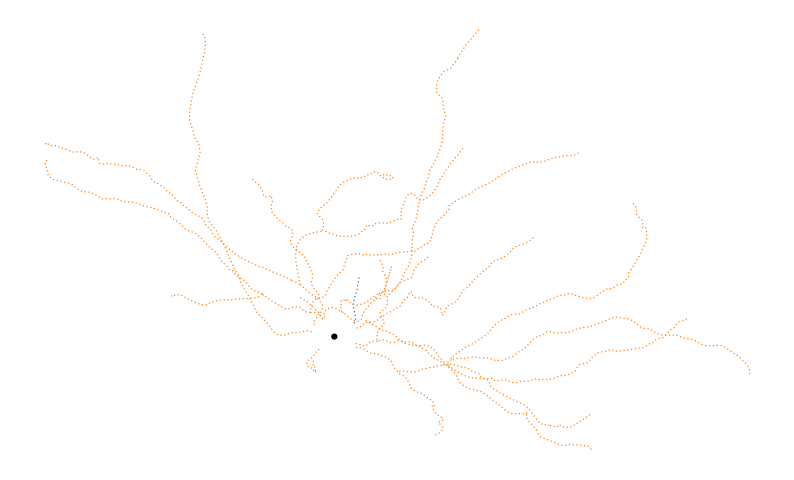

In [21]:
plot_morphology(swc_2019_files[0])

In [22]:
features = extract_features(swc_2019_files[0])
features

2023-11-09 17:10:07,084 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:07,084 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:07,085 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58967310>>
2023-11-09 17:10:07,086 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:07,087 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:07,087 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:07,088 root         INFO     skipping fea

/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/neuron_morphology/features/statistics/moments.py:46: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  (_, _, mean, variance, skew, kurt) = stats.describe(coordinates, axis=0)
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: invalid value encountered in multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1522: RuntimeWarning: Precision loss occurred in moment calculation due to catastro

{'axon.compartment.dimension_width': 525.5795,
 'axon.compartment.dimension_height': 696.97915,
 'axon.compartment.dimension_depth': 145.57180000000002,
 'axon.compartment.dimension_min_xyz_x': -401.84045,
 'axon.compartment.dimension_min_xyz_y': -606.1438,
 'axon.compartment.dimension_min_xyz_z': -21.314549999999997,
 'axon.compartment.dimension_max_xyz_x': 123.73905000000008,
 'axon.compartment.dimension_max_xyz_y': 90.83534999999995,
 'axon.compartment.dimension_max_xyz_z': 124.25725000000003,
 'axon.compartment.dimension_bias_xyz_x': 278.1013999999999,
 'axon.compartment.dimension_bias_xyz_y': -515.3084500000001,
 'axon.compartment.dimension_bias_xyz_z': 102.94270000000003,
 'all_neurites.compartment.dimension_width': 525.5795,
 'all_neurites.compartment.dimension_height': 696.97915,
 'all_neurites.compartment.dimension_depth': 145.57180000000002,
 'all_neurites.compartment.dimension_min_xyz_x': -401.84045,
 'all_neurites.compartment.dimension_min_xyz_y': -606.1438,
 'all_neurites.

In [23]:
morph_feats2019 = collect_morph_features(swc_files, chunksize=6)

2023-11-09 17:10:10,304 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:10,305 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:10,305 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:10,307 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58b70130>>
2023-11-09 17:10:10,308 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,309 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,310 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:10,309 root         INFO     skipping feature: dendr

2023-11-09 17:10:10,340 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,341 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,341 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,342 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,342 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58cab

2023-11-09 17:10:10,351 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:10,351 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,351 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,351 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,352 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,352 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,353 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,353 root         INFO   

2023-11-09 17:10:10,365 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,365 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,365 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,365 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,365 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:10,362 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,366 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,366 root         INFO     skipping feature: apical_den

2023-11-09 17:10:10,375 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,375 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,375 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:10,373 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,376 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,376 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,376 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,377 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra m

2023-11-09 17:10:10,384 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,384 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,384 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,384 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,384 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:10,384 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,384 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,385 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['Requ

2023-11-09 17:10:10,391 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,391 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,391 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,391 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,391 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,391 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,391 root         INFO     skipping feature: apical_dendrite.total_lengt

2023-11-09 17:10:10,397 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,397 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,397 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,398 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,398 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,398 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,398 root         INFO    

2023-11-09 17:10:10,404 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,403 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,403 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,404 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,404 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,404 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,404 root         INFO     skipping feature: axon.

2023-11-09 17:10:10,407 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,407 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,404 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,407 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,407 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,407 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths',

2023-11-09 17:10:10,412 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,413 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,413 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,413 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,413 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,412 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,413 root         INFO     skipping feature: apical_dendrite.me

2023-11-09 17:10:10,417 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,418 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,417 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,417 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,418 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,418 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,418 root         INFO     skipping feature: axon.axon.earth_movers_

2023-11-09 17:10:10,423 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,423 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,423 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,423 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,423 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,423 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,423 root         INFO

2023-11-09 17:10:10,425 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,426 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,426 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,426 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58cb9250>>
2023-11-09 17:10:10,426 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:10,426 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,427 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenc

2023-11-09 17:10:10,428 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,429 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,429 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,429 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,429 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,429 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDep

2023-11-09 17:10:10,432 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,432 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,432 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,432 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,433 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,433 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-1

2023-11-09 17:10:10,436 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,437 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,437 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon

2023-11-09 17:10:10,441 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62e548b0>>
2023-11-09 17:10:10,441 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,442 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,442 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,442 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,441 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresL

2023-11-09 17:10:10,447 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,447 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,447 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,447 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,447 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:10,447 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,447 root         INFO     skipping feature: apical_dendrite.total_surface_area.

2023-11-09 17:10:10,438 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,450 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,450 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,450 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,451 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,451 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,451 root         

2023-11-09 17:10:10,456 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,456 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,448 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,456 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,452 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-

2023-11-09 17:10:10,458 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,459 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,459 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,459 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,459 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,456 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartm

2023-11-09 17:10:10,464 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,464 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,464 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,464 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,465 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,465 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']

2023-11-09 17:10:10,457 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,470 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,470 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,470 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,470 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,470 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
202

2023-11-09 17:10:10,478 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,478 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,479 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,479 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,479 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,480 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,480 root         INFO    

2023-11-09 17:10:10,486 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,486 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,486 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,486 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,486 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,487 root         INFO     skipping feature: apical_dendrite.basal_dendrite.o

2023-11-09 17:10:10,496 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,496 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,497 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,497 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,497 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'Requir

2023-11-09 17:10:10,501 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,502 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,502 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,502 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,503 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,491 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceL

2023-11-09 17:10:10,501 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,517 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,517 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,518 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,519 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,520 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,521 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:10:10,52

2023-11-09 17:10:10,546 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,555 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,555 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,556 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,557 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,547 root         

2023-11-09 17:10:10,567 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,570 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,584 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,585 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,587 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17

2023-11-09 17:10:10,613 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,639 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,662 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,687 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,713 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:10,738 root         INFO     

2023-11-09 17:10:11,211 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:11,236 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:11,263 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:11,285 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef6379e8e0>>
2023-11-09 17:10:11,311 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:11,338 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:11,365 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:11,391 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:10:11,917 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']


2023-11-09 17:10:11,939 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:10:11,966 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:10:11,988 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:10:12,015 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:12,013 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 17:10:12,032 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:12,047 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresRe

2023-11-09 17:10:12,050 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:10:12,060 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:12,061 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:12,062 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:12,052 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:12,066 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef637936d0>>
2023-11-09 17:10:12,075 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:12,081 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra

2023-11-09 17:10:12,204 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:12,193 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:10:12,213 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:10:12,209 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:12,222 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:12,214 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:10:12,232 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58acc5b0>>
2023-11-09 17:10:12,231 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extr

2023-11-09 17:10:12,296 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:10:12,291 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:10:12,301 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:10:12,302 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:10:12,304 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:10:12,305 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:10:12,306 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']


2023-11-09 17:10:12,302 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:10:12,319 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:10:12,322 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:12,325 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:12,319 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:10:12,328 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:12,329 root    

2023-11-09 17:10:12,339 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:12,343 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:12,348 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 17:10:12,338 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:10:12,349 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']


2023-11-09 17:10:12,352 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:10:12,344 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:12,354 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:12,353 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:10:12,359 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:12,361 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found ex

2023-11-09 17:10:12,363 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:12,366 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:12,362 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:12,370 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:12,373 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:12,375 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Foun

2023-11-09 17:10:12,457 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:10:12,457 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:12,458 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:12,466 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:10:12,461 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:10:12,468 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:10:12,471 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:10:12,469 root         INFO     skipping feature: 

2023-11-09 17:10:12,543 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:12,543 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:10:12,545 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:12,549 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:12,545 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:10:12,554 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLa

2023-11-09 17:10:12,588 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:10:12,589 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:12,587 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:12,589 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:12,590 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:12,591 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:12,592 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:10:12,593

2023-11-09 17:10:12,656 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:12,651 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:12,658 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:12,670 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:12,672 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:12,674 root         INF

2023-11-09 17:10:12,707 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:12,709 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:12,700 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:12,712 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:10:12,715 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:12,713 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:12,717 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_n

2023-11-09 17:10:13,208 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:13,209 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:13,213 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:13,238 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58bee2b0>>
2023-11-09 17:10:13,257 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:13,275 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:13,290 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:13,303 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:10:13,501 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:10:13,502 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:10:13,516 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:10:13,527 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:13,530 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:13,547 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:13,542 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:13,551 root         INFO     skipping mark (validation failed): ty

2023-11-09 17:10:13,653 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:13,644 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:13,656 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:13,659 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:13,661 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:13,663 root       

2023-11-09 17:10:14,595 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:10:15,014 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:15,021 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:15,032 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef637938b0>>
2023-11-09 17:10:15,043 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:15,046 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:15,047 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:15,053 root         INFO     skipping fea

2023-11-09 17:10:15,162 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:15,171 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:15,181 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:10:15,189 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:15,191 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:15,198 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'apical_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'apical_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'apical_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_ne

2023-11-09 17:10:15,379 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:10:15,380 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:10:15,387 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:10:15,387 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:10:15,393 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:10:15,397 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:10:15,396 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09

2023-11-09 17:10:15,495 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:15,497 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:15,492 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:15,498 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:15,510 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:15,5

2023-11-09 17:10:15,720 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

2023-11-09 17:10:16,713 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:16,719 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:16,735 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:16,757 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62f31220>>
2023-11-09 17:10:16,767 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:16,777 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:16,791 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:16,802 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:10:17,102 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:17,106 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:10:17,549 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:17,552 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:17,554 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:17,559 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef6379eac0>>
2023-11-09 17:10:17,561 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:17,563 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:17,565 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:17,567 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:10:17,653 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:17,655 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:10:17,698 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:10:17,789 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:17,790 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:17,794 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:17,808 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff0986e59d0>>
2023-11-09 17:10:17,818 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:17,833 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:17,849 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:17,861 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:10:17,935 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']


2023-11-09 17:10:17,937 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:10:17,931 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:10:17,938 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:10:17,938 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:10:17,940 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:10:17,939 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:10:17,941 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:10:17,942 root    

2023-11-09 17:10:17,993 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:17,994 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:17,995 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:17,992 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:17,996 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:10:18,002 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:18,003 root         INFO     ski

2023-11-09 17:10:18,048 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:18,050 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:18,051 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:18,052 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:10:18,042 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 17:10:18,060 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']


2023-11-09 17:10:18,051 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:18,069 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:18,068 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:10:18,081 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:18,081 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:18,107 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
20

2023-11-09 17:10:18,232 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:18,232 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:10:18,234 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:18,234 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:10:18,236 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:10:18,236 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:18,242 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:10:18,243 root         INFO     skipping feature: a

2023-11-09 17:10:18,296 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:18,298 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:18,303 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:18,305 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:18,289 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:18,298 root         INFO   

2023-11-09 17:10:18,370 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:18,384 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:18,388 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:18,378 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:18,397 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11

2023-11-09 17:10:18,486 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:18,491 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:10:18,995 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:18,998 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:19,013 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62e8b490>>
2023-11-09 17:10:19,022 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:19,033 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:19,047 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:19,073 root         INFO     skipping fea

2023-11-09 17:10:19,561 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:10:19,678 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:19,685 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:19,694 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:19,723 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef63806070>>
2023-11-09 17:10:19,738 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:19,753 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:19,757 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:19,774 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:10:19,991 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:10:19,990 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:19,998 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:20,001 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:20,003 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:20,004 root         INFO     skipping feature: basal_dendrite.apical_dendrite.ea

2023-11-09 17:10:20,126 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:20,130 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:20,138 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:20,146 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:20,157 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:20,177 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:20,192 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:10:20,210 root         INF

2023-11-09 17:10:20,343 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:20,345 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:10:20,345 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:10:20,349 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:10:20,349 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:20,356 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:20,358 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:20,359 root         INFO     skipping feature: apical_dendrite.max

2023-11-09 17:10:20,643 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:20,653 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:20,659 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:20,660 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:20,652 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:20,661 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:20,670 root         INFO     skipping fe

2023-11-09 17:10:20,882 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:10:20,887 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']


2023-11-09 17:10:20,892 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:10:20,908 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:10:20,926 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:10:20,938 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:10:20,960 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:10:20,978 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:10:21,004 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:21,030 root       

2023-11-09 17:10:21,587 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:21,596 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:21,600 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:21,613 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff0986e5af0>>
2023-11-09 17:10:21,621 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:21,625 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:21,641 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:21,643 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:10:21,926 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:21,952 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:10:22,204 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:22,208 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:22,213 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:22,224 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff0986e5af0>>
2023-11-09 17:10:22,226 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:22,237 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:22,263 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:22,275 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:10:22,849 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:22,875 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:10:23,300 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:23,302 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:23,307 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:23,320 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58beeca0>>
2023-11-09 17:10:23,325 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:23,331 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:23,338 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:23,345 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:10:23,574 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:23,579 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:10:23,756 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:23,762 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:23,774 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:23,790 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef6379eb20>>
2023-11-09 17:10:23,799 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:23,812 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:23,824 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:23,837 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:10:23,880 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:10:23,891 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:10:23,920 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:10:23,941 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:10:23,966 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:10:23,991 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:10:24,016 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:10:24,022 roo

2023-11-09 17:10:24,100 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:10:24,101 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:10:24,102 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:10:24,103 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:10:24,104 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:10:24,105 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:10:24,106 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']


2023-11-09 17:10:24,107 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:10:24,108 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:10:24,109 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:10:24,099 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:24,112 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:10:24,113 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:10:24,116 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:10:24,122 root      

2023-11-09 17:10:24,214 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:24,206 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:24,220 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:24,218 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:24,224 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:24

2023-11-09 17:10:24,265 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef5898d8e0>>
2023-11-09 17:10:24,274 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:24,288 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:24,304 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:24,319 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:24,322 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:10:24,327 root         INFO     skipping feature: apical_dendrite.num_branches. Found e

2023-11-09 17:10:24,420 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

2023-11-09 17:10:24,942 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:24,950 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:24,976 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:24,994 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff09edba310>>
2023-11-09 17:10:25,009 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:25,023 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:25,038 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:25,042 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:10:25,115 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:10:25,129 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:10:25,145 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:10:25,161 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:10:25,177 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:10:25,193 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:10:25,208 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:10:25,218 ro

2023-11-09 17:10:25,614 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:25,616 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:25,621 root         INFO     skipping mark (validation failed): type


2023-11-09 17:10:25,645 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58bee2b0>>
2023-11-09 17:10:25,671 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:25,692 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:25,718 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:25,744 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:25,766 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:10:25,778 root         INFO     skipping feature: apical_dendrite.num_branches. Found e

2023-11-09 17:10:25,892 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:10:25,907 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:10:25,897 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:25,927 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:25,919 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:25,928 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:25,933 roo

2023-11-09 17:10:26,033 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:26,042 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:26,055 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:26,069 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites

2023-11-09 17:10:27,121 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:27,130 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:27,137 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:27,140 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef63793910>>
2023-11-09 17:10:27,142 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:27,146 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:27,148 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:27,152 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:10:27,281 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:27,284 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:10:27,552 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:27,555 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:27,557 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:27,562 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff0986e5a00>>
2023-11-09 17:10:27,564 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:27,567 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:27,569 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:27,571 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:10:27,667 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:27,669 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:10:27,798 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:27,800 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:27,807 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:27,811 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58acc880>>
2023-11-09 17:10:27,813 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:27,815 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:27,817 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:27,820 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:10:27,826 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:10:27,852 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:10:27,854 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:10:27,856 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:10:27,859 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:10:27,861 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:10:27,863 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:10:27,865 roo

2023-11-09 17:10:28,212 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:28,213 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:28,216 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:28,220 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58cb9250>>
2023-11-09 17:10:28,222 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:28,224 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:28,226 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:28,228 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:10:28,545 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:28,557 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:28,559 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:28,572 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:28,586 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite

2023-11-09 17:10:28,909 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:10:28,922 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:10:28,944 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:28,961 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:28,986 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:29,007 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPoint

2023-11-09 17:10:31,670 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:31,675 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:31,687 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:31,707 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58b66d30>>
2023-11-09 17:10:31,719 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:31,731 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:31,744 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:31,753 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:10:31,788 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:10:31,800 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:10:31,805 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:10:31,810 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:10:31,814 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:10:31,840 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:10:31,852 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:10:31,865 roo

2023-11-09 17:10:32,211 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:10:32,213 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:10:32,216 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:10:32,218 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:10:32,220 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:32,222 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:32,207 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPoin

2023-11-09 17:10:32,412 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:32,424 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:32,429 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:32,441 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:32,453 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:32,464

2023-11-09 17:10:33,199 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:33,212 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:33,229 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:33,259 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef63806af0>>
2023-11-09 17:10:33,285 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:33,296 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:33,317 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:10:33,323 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']


2023-11-09 17:10:33,325 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:33,336 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:10:33,337 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:10:33,344 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:10:33,345 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:10:33,347 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:10:33,349 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:10:33,355 root         INFO     skipping featur

2023-11-09 17:10:33,613 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:10:33,622 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:10:33,623 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:10:33,620 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:33,630 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:10:33,633 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:33,643 root         INFO     skipping feature: apical_dendrite.axon.overlap. Fou

2023-11-09 17:10:33,767 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:33,782 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:33,792 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:33,810 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:33,836 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:33,862 root    

2023-11-09 17:10:34,199 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:34,202 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:34,220 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:34,250 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58b4f370>>


2023-11-09 17:10:34,252 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:34,258 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:34,260 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:34,283 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:34,312 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:34,315 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:34,318 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef63806850>>
2023-11-09 17:10:34,321 root         INFO     skipping fea

2023-11-09 17:10:34,411 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:34,412 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:34,420 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:34,423 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:34,417 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:34,434 root         

2023-11-09 17:10:34,473 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:34,489 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:10:34,722 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:34,724 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:34,726 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:34,741 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef638068b0>>
2023-11-09 17:10:34,742 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:34,746 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:34,749 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:34,756 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:10:34,852 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:34,854 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:34,856 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:34,859 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:10:34,863 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:34,872 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:34,881 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:34,882 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:34,885 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:34,887 root         INFO     

2023-11-09 17:10:35,480 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 17:10:35,491 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:35,496 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:35,499 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:35,505 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:35,532 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:35,557 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:35,584 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:10:35,611 root         INF

2023-11-09 17:10:35,794 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:10:35,795 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:10:35,797 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:10:35,798 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:35,800 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:35,801 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:35,803 root         INFO     ski

2023-11-09 17:10:36,000 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:36,010 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:36,019 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:36,027 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites

2023-11-09 17:10:36,517 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:36,520 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:36,540 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff09edba310>>
2023-11-09 17:10:36,544 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:36,569 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:36,591 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:36,611 root         INFO     skipping fea

2023-11-09 17:10:36,722 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:10:36,734 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:10:36,760 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:10:36,779 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:10:36,791 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:10:36,803 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:10:36,814 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:10:36,827 root         INFO     s

2023-11-09 17:10:38,045 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:10:38,171 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:38,175 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:38,181 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:38,185 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff09c0200d0>>
2023-11-09 17:10:38,188 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:38,190 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:38,193 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:38,205 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:10:38,871 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:38,874 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:10:39,095 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:39,097 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:39,099 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:39,103 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef64e15fd0>>
2023-11-09 17:10:39,105 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:39,107 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:39,109 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:39,112 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:10:39,208 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:39,210 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:10:39,772 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:39,775 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:39,791 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff0986e5a00>>
2023-11-09 17:10:39,795 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:39,808 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:39,813 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:39,818 root         INFO     skipping fea

2023-11-09 17:10:40,146 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:40,165 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:40,179 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:40,184 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef63806be0>>
2023-11-09 17:10:40,186 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:40,188 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:40,189 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:40,190 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:10:40,392 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:40,400 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:10:40,406 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:40,416 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:40,420 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:40,446 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:40,448 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:40,450 root    

2023-11-09 17:10:40,739 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:10:40,751 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:10:40,764 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:10:40,777 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:10:40,790 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:10:40,802 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:10:40,815 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:10:40,827 roo

2023-11-09 17:10:41,439 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:10:41,558 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:41,559 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:41,563 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:41,570 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58cf2790>>
2023-11-09 17:10:41,574 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:41,576 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:41,581 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:41,585 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:10:41,703 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:10:41,713 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:41,715 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:41,717 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:41,727 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:41,734 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:41,739 root    

2023-11-09 17:10:42,078 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:10:42,082 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:10:42,088 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:10:42,093 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:10:42,096 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:10:42,101 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:10:42,103 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:42,112 root       

2023-11-09 17:10:42,764 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:10:42,892 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:42,899 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:42,914 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:42,930 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef6379ea90>>
2023-11-09 17:10:42,933 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:42,959 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:42,973 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:42,988 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:10:43,584 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:10:43,599 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:43,611 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:43,621 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:43,625 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:43,630 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointD

2023-11-09 17:10:43,862 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:10:43,864 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:10:43,867 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:10:43,869 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:10:43,872 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:10:43,874 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:43,876 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:43,879 root       

2023-11-09 17:10:44,234 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:44,240 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:44,252 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:44,268 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef6379e8e0>>
2023-11-09 17:10:44,280 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:44,293 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:44,297 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:44,302 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:10:44,428 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:44,430 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:10:44,719 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:44,722 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:44,735 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58ac2370>>
2023-11-09 17:10:44,737 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:44,743 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:44,744 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:44,746 root         INFO     skipping fea

2023-11-09 17:10:44,990 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:10:45,199 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:45,201 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:45,203 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:45,209 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58cb9160>>
2023-11-09 17:10:45,211 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:45,213 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:45,216 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:45,218 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:10:45,316 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:45,318 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:10:45,548 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']


2023-11-09 17:10:45,563 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:10:45,578 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:10:45,585 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:10:45,590 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:10:45,608 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:10:45,624 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:10:45,646 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:45,649 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:45,639

2023-11-09 17:10:45,746 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:45,749 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:45,751 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:45,737 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:10:45,753 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:45,755 root         INFO     skipping feature: apical_dendrite.dendrite.earth_m

2023-11-09 17:10:46,034 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:46,047 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:46,059 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:46,072 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:46,084 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:46,110 root         I

2023-11-09 17:10:47,149 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:10:47,211 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:47,216 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:47,221 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58d110d0>>
2023-11-09 17:10:47,226 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:47,231 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:47,236 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:47,241 root         INFO     skipping fea

2023-11-09 17:10:47,344 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef6379eac0>>
2023-11-09 17:10:47,346 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:47,347 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:47,349 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:47,358 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:47,363 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:10:47,367 root         INFO     skipping feature: apical_dendrite.num_branches. Found e

2023-11-09 17:10:47,572 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/neuron_morphology/features/statistics/moments.py:46: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  (_, _, mean, variance, skew, kurt) = stats.describe(coordinates, axis=0)
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: invalid value encountered in multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1522: RuntimeWarning: Precision loss occurred in moment calculation due to catastro

2023-11-09 17:10:48,071 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']


2023-11-09 17:10:48,076 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']


2023-11-09 17:10:48,082 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:10:48,093 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:10:48,107 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:10:48,119 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:10:48,141 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:10:48,149 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:10:48,158 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:10:48,18

2023-11-09 17:10:48,293 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:48,294 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:48,296 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:48,290 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:48,297 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:48,299 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:48,302 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['Requi

2023-11-09 17:10:48,346 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:48,359 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:10:48,351 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:48,366 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:10:48,376 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:10:48,378 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPoin

2023-11-09 17:10:48,451 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:48,463 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:10:48,485 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:10:48,508 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:10:48,513 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:10:48,526 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:48,530 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresRef

/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: invalid value encountered in multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1522: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  sk = skew(a, axis, bias=bias)
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1523: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical

2023-11-09 17:10:49,815 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:49,820 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:49,830 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:49,846 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef63806070>>
2023-11-09 17:10:49,866 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:49,892 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:49,903 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:49,916 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:10:50,104 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:10:50,106 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:50,092 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:50,108 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:50,111 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:50,113 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:50,115 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra m

2023-11-09 17:10:50,214 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:50,219 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:50,226 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:50,230 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:50,235 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:50,241 root         INFO     skipping

2023-11-09 17:10:51,643 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:51,645 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:51,654 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:51,670 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62f31220>>
2023-11-09 17:10:51,671 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:51,678 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:51,683 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:51,688 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:10:51,833 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:10:51,843 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:51,847 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:51,853 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:51,857 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:51,862 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDe

2023-11-09 17:10:52,508 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:52,518 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:52,528 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']


2023-11-09 17:10:52,532 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:52,543 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:10:52,543 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 17:10:52,544 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:10:52,545 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:10:52,546 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:10:52,548 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:10:52,549 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations.

2023-11-09 17:10:52,558 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']


2023-11-09 17:10:52,560 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:10:52,562 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:52,564 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:52,565 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:52,567 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:52,568 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:52,569 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:52,570 root         I

2023-11-09 17:10:52,680 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:52,679 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:52,678 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:10:52,682 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:52,683 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:10:52,686 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['Require

2023-11-09 17:10:52,729 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:52,722 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:52,740 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:52,743 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:52,754 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:52,756 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:52,759 root         INFO     skipping feature: apical_dendrite.compartment.moments

2023-11-09 17:10:52,863 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:10:52,873 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:52,903 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:52,910 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:52,921 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:52,932 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:52,943 root         INFO     sk

2023-11-09 17:10:53,057 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:10:53,062 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:10:53,067 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:53,075 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:53,082 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:53,102 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:53,118 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:53,131 root

2023-11-09 17:10:53,531 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:10:53,840 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:53,847 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:53,863 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:53,886 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58cf2c10>>
2023-11-09 17:10:53,901 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:53,917 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:53,932 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:53,944 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:10:54,156 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:54,160 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 17:10:54,162 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:54,176 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:54,182 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:54,194 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:10:54,205 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:10:54,207 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:10:54,225 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:10:54,233 root         I

2023-11-09 17:10:54,384 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:54,386 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:54,388 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:54,390 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:54,392 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:54,378 root         INFO     skipping

2023-11-09 17:10:54,460 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:54,467 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:54,476 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:10:54,496 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

2023-11-09 17:10:54,668 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:54,670 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:54,673 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:54,677 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:54,679 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:54,680 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef637933a0>>
2023-11-09 17:10:54,681 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:54,685 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:54,682 root         INFO     skipping mark (validation fai

2023-11-09 17:10:54,822 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:54,828 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:10:54,826 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:54,833 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:54,836 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:54,841 root         INFO     skipping feat

2023-11-09 17:10:54,928 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:54,929 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:54,931 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:54,933 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:54,935 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:54,937 root    

2023-11-09 17:10:55,980 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:55,985 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:56,011 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:56,035 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef5898d8e0>>
2023-11-09 17:10:56,057 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:56,082 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:56,103 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:56,130 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:10:56,530 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:56,545 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:56,551 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:56,559 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:10:56,562 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

2023-11-09 17:10:57,102 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:10:57,243 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:57,251 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:57,268 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:57,286 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff0986e5a00>>
2023-11-09 17:10:57,301 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:57,315 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:57,331 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:57,347 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:10:57,619 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:57,622 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:10:58,292 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:58,296 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:58,301 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef65be7e50>>
2023-11-09 17:10:58,305 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:58,310 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:58,314 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:58,318 root         INFO     skipping fea

2023-11-09 17:10:59,020 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:10:59,099 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:59,103 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:59,107 root         INFO     skipping mark (validation failed): type
2023-11-09 17:10:59,113 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff09c0200d0>>
2023-11-09 17:10:59,117 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:59,121 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:59,126 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:10:59,130 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:10:59,330 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:10:59,334 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:10:59,868 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:11:00,006 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:11:00,058 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:00,066 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:00,074 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:00,081 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff09c0200d0>>
2023-11-09 17:11:00,085 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:00,089 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:00,088 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:00,094 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:00,091 root         INFO     skipping feature: apical_dend

2023-11-09 17:11:00,237 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:11:00,238 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:00,244 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:00,242 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:11:00,248 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:11:00,254 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:00,253 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-0

2023-11-09 17:11:00,336 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:11:00,332 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:00,337 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:00,340 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:00,341 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:00,343 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17

2023-11-09 17:11:00,434 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

2023-11-09 17:11:00,547 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:11:00,549 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:11:00,542 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:00,551 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:00,552 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:00,554 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresRef

2023-11-09 17:11:00,734 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:00,745 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:11:00,747 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:00,762 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:00,764 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:00,777 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:00,791 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:00,799 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:11:00,809 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:11:00,811 root         INFO

2023-11-09 17:11:00,972 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:11:00,998 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:11:01,009 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:11:01,020 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:11:01,029 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:11:01,040 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:11:01,053 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:11:01,064

2023-11-09 17:11:01,351 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:01,371 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:11:02,393 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:11:02,736 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:02,740 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:02,744 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:02,752 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef63806850>>
2023-11-09 17:11:02,757 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:02,761 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:02,765 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:02,770 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:11:02,955 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:11:02,958 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:02,961 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:02,963 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:02,964 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:02,966 root         INFO     skipping feature: apical_dendrite.dendrite.eart

2023-11-09 17:11:03,248 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:03,260 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:03,273 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:03,296 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:03,309 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:03,312 root    

2023-11-09 17:11:04,916 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:04,920 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:04,931 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:04,938 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58b5b130>>
2023-11-09 17:11:04,946 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:04,958 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:04,970 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:04,980 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:11:05,722 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:05,733 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:11:06,642 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:06,644 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:06,648 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:06,656 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58ab6be0>>
2023-11-09 17:11:06,658 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:06,662 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:06,666 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:06,670 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:11:06,871 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:06,873 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:11:06,877 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:06,881 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:06,885 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimensi

2023-11-09 17:11:07,372 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:07,375 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:07,377 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:07,379 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:07,381 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:07,384 root      

2023-11-09 17:11:07,855 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:11:08,026 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:08,032 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:08,045 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:08,061 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c237c0>>
2023-11-09 17:11:08,073 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:08,087 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:08,100 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:08,112 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:11:08,511 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:08,512 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:08,507 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:11:08,518 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:11:08,525 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:11:08,527 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'Requir

2023-11-09 17:11:08,714 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:08,723 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:08,740 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:08,750 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:08,766 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:08,777 root    

2023-11-09 17:11:09,266 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:09,270 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:09,283 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:09,298 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff0986e59d0>>
2023-11-09 17:11:09,320 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:09,340 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:09,355 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:09,368 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:11:10,015 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:10,018 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:11:10,378 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:10,400 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:10,409 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef637dce80>>
2023-11-09 17:11:10,435 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:10,456 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:10,471 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:10,483 root         INFO     skipping fea

2023-11-09 17:11:11,107 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:11:11,244 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:11:11,251 root         INFO     skipping mark (validation failed): type


2023-11-09 17:11:11,254 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:11,257 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:11,260 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58beec40>>
2023-11-09 17:11:11,261 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:11,266 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:11,274 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:11,284 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:11,308 root         INFO     skipping fea

2023-11-09 17:11:11,518 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:11:11,528 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:11:11,534 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:11,535 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:11,541 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:11:11,540 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:11,553 root         INFO 

2023-11-09 17:11:11,678 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:11,691 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:11,697 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:11,709 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:11,718 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresAp

2023-11-09 17:11:12,028 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:12,041 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:12,053 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'apical_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'apical_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'apical_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_ne

2023-11-09 17:11:13,712 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:13,719 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:13,733 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:13,751 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef653394c0>>
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/neuron_morphology/features/statistics/moments.py:46: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  (_, _, mean, variance, skew, kurt) = stats.describe(coordinates, axis=0)
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: divide by zero encountered in d

2023-11-09 17:11:13,922 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:13,926 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:13,939 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:13,957 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:13,983 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:13,999 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:14,021 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:11:14,045 root         INF

2023-11-09 17:11:14,244 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:14,257 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:14,258 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:14,255 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:11:14,261 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:11:14,262 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: 

2023-11-09 17:11:14,405 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:14,409 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:14,413 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:14,417 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites

2023-11-09 17:11:15,098 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:15,100 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:15,102 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:15,107 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58beec40>>
2023-11-09 17:11:15,110 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:15,112 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:15,114 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:15,116 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:11:15,208 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:15,210 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:11:16,063 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:16,069 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:16,073 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:16,079 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef637933a0>>
2023-11-09 17:11:16,080 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:16,083 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:16,085 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:16,085 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:11:16,123 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']


2023-11-09 17:11:16,127 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:11:16,143 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:11:16,146 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:11:16,147 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:11:16,149 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:11:16,150 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:11:16,151 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:16,159 root       

2023-11-09 17:11:16,402 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:11:16,404 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:16,406 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:16,391 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:16,408 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:16,410 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:16,412 root         INFO     skipping feature: axon.apical_dendrite.overlap. 

2023-11-09 17:11:16,453 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:16,478 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:16,496 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimensi

2023-11-09 17:11:17,256 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:17,259 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:17,264 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:17,271 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58acc880>>
2023-11-09 17:11:17,273 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:17,275 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:17,277 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:17,279 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:11:17,376 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:17,377 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:17,379 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:17,380 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff0986e5af0>>
2023-11-09 17:11:17,382 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendr

2023-11-09 17:11:17,772 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:17,783 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:17,796 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:17,802 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:17,813 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:17,826 root      

2023-11-09 17:11:19,654 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:19,659 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:19,673 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef653394c0>>
2023-11-09 17:11:19,695 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:19,711 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:19,723 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:19,736 root         INFO     skipping fea

2023-11-09 17:11:21,232 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:21,239 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:21,244 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:21,259 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff09bfd2100>>
2023-11-09 17:11:21,260 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:21,275 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:21,302 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:21,327 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:11:21,937 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:21,945 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:11:22,252 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:11:22,399 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:22,421 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:22,433 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:22,453 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff09bfd2b80>>
2023-11-09 17:11:22,466 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:22,479 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:22,504 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:22,526 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:22,

2023-11-09 17:11:22,681 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']


2023-11-09 17:11:22,684 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:11:22,686 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:22,689 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:22,691 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:22,693 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:22,683 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:22,700 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:22,711 root         INFO 

2023-11-09 17:11:22,793 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:22,779 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:22,795 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:22,794 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:22,800 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:22,800 root         INFO     skipping feat

2023-11-09 17:11:22,867 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:22,875 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:22,877 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:22,879 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:22,882 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:22,884 root         INFO     

2023-11-09 17:11:24,178 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:24,180 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:24,184 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:24,194 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef6379ea90>>
2023-11-09 17:11:24,196 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:24,199 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:24,203 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:24,207 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:11:24,411 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:24,415 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:11:25,144 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:25,149 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:25,162 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef6379e8e0>>
2023-11-09 17:11:25,174 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:25,188 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:25,201 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:25,210 root         INFO     skipping fea

2023-11-09 17:11:25,497 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:25,511 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:25,532 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:25,542 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef64e15d00>>
2023-11-09 17:11:25,550 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:25,568 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:25,594 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:25,597 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:11:25,665 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:11:25,675 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:11:25,686 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:11:25,698 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:11:25,713 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:11:25,725 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:11:25,737 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:11:25,75

2023-11-09 17:11:25,975 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:11:25,959 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:25,979 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:25,983 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:25,989 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:25,990 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: 

2023-11-09 17:11:26,069 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:11:26,076 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:26,069 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:26,085 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:26,088 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:26,092 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartme

2023-11-09 17:11:26,444 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:26,468 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:26,486 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:26,504 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff09bfd2b80>>
2023-11-09 17:11:26,531 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:26,552 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:26,578 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:26,592 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:26,

2023-11-09 17:11:26,630 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:11:26,632 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:11:26,634 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:11:26,627 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58ac2370>>


2023-11-09 17:11:26,636 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:11:26,637 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']


2023-11-09 17:11:26,639 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:26,645 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:26,639 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:11:26,650 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:26,656 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:11:26,658 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:11:26,663 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:11:26,665 root         INFO     skipping featur

2023-11-09 17:11:26,723 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:26,722 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:11:26,723 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:26,717 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:26,724 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:26,727 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun ob

2023-11-09 17:11:26,762 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:11:26,764 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:26,756 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:26,770 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:26,771 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:26,772 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDe

2023-11-09 17:11:26,815 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:26,817 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:26,819 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:26,821 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:26,823 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:26,825 root    

2023-11-09 17:11:26,977 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:26,989 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:27,000 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:11:27,013 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:11:27,025 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:11:27,035 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:11:27,048 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2

/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: invalid value encountered in multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1522: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  sk = skew(a, axis, bias=bias)
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1523: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical

2023-11-09 17:11:28,171 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:28,173 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:28,186 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58b66f70>>
2023-11-09 17:11:28,198 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:28,210 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:28,222 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:28,229 root         WARNING  feature extr

2023-11-09 17:11:28,240 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:11:28,249 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:28,257 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:28,259 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:28,264 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:28,268 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:28,272 root         INFO     skipping f

2023-11-09 17:11:28,613 root         INFO     skipping mark (validation failed): type


2023-11-09 17:11:28,616 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:28,620 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:28,626 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff0986e59d0>>
2023-11-09 17:11:28,642 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:28,651 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:28,676 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:28,687 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:28,700 root         INFO     skipping fea

2023-11-09 17:11:28,837 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:28,839 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:28,841 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:28,844 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:28,846 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresAp

2023-11-09 17:11:29,107 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:11:29,172 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:29,175 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:29,178 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef588045b0>>
2023-11-09 17:11:29,180 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:29,183 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:29,185 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:29,187 root         INFO     skipping fea

2023-11-09 17:11:29,480 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:29,485 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:29,498 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:29,519 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58b40c70>>
2023-11-09 17:11:29,545 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:29,566 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:29,592 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:29,605 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:11:29,868 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:11:29,886 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:29,887 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']


2023-11-09 17:11:29,896 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:29,904 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:29,906 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:29,908 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:29,911 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:29,913 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:11:29,915 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:11:29,917 root         INFO

2023-11-09 17:11:29,988 root         WARNING  feature extraction failed for axon.mean_fragmentation


/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/neuron_morphology/features/statistics/moments.py:46: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  (_, _, mean, variance, skew, kurt) = stats.describe(coordinates, axis=0)
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: invalid value encountered in multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1522: RuntimeWarning: Precision loss occurred in moment calculation due to catastro

2023-11-09 17:11:30,175 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:30,167 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:30,178 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:30,177 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:30,180 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:30,184 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef588041c0>>
2023-11-09 17:11:30,180 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:30,187 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:30,189 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['Requir

2023-11-09 17:11:30,287 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:30,286 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:11:30,289 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:11:30,291 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:11:30,293 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:11:30,294 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:11:30,295 root         INFO     skipping feature: apical_dendrite.total_volume. Foun

2023-11-09 17:11:30,377 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:11:30,375 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:30,395 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:11:30,401 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:30,420 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:11:30,428 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLa

2023-11-09 17:11:30,609 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:11:30,635 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:30,653 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:30,679 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:30,697 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:30,714 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['R

2023-11-09 17:11:32,147 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:32,154 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:32,167 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:32,184 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58ac21c0>>
2023-11-09 17:11:32,190 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:32,201 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:32,225 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:32,241 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:11:32,332 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:11:32,340 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:11:32,346 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']


2023-11-09 17:11:32,352 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:11:32,359 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:11:32,367 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:11:32,371 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:11:32,376 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:11:32,381 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:32,388 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:32,393 root       

2023-11-09 17:11:32,805 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:32,809 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:32,827 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:32,855 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 17:11:32,845 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58cb9160>>
2023-11-09 17:11:32,860 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:32,867 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:32,871 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']


2023-11-09 17:11:32,873 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:32,884 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:11:32,910 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:11:32,913 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:11:32,931 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:11:32,939 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:11:32,949 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:11:32,957 root         INFO     skipping featur

2023-11-09 17:11:33,039 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:33,042 root         INFO     skipping mark (validation failed): type


2023-11-09 17:11:33,044 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:33,045 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:33,054 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef637cdd60>>
2023-11-09 17:11:33,061 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:33,060 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:33,069 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:33,071 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found 

2023-11-09 17:11:33,138 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:33,164 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:33,183 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:33,203 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:33,207 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:33,209 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths'

2023-11-09 17:11:33,453 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:33,466 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:33,478 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:33,496 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:33,522 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:33,544 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:33,562 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:33,567 root         

2023-11-09 17:11:34,294 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:11:34,604 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:34,611 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:34,627 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:34,651 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58b66d30>>
2023-11-09 17:11:34,659 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:34,672 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:34,687 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:34,702 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:11:35,206 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:35,210 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:11:35,477 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:35,482 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:35,486 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:35,494 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef588049a0>>
2023-11-09 17:11:35,498 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:35,503 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:35,507 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:35,512 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:11:35,656 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:35,662 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:11:35,671 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:35,680 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:35,685 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:35,689 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:35,694 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:35,698

2023-11-09 17:11:36,056 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:11:36,066 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:11:36,078 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:11:36,091 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:36,103 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:36,116 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:36,128 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:36,141 roo

2023-11-09 17:11:38,862 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:11:39,004 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:39,009 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:39,014 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:39,022 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c17eb0>>
2023-11-09 17:11:39,026 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:39,031 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:39,036 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:39,041 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:11:39,099 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:11:39,105 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']


2023-11-09 17:11:39,107 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:11:39,116 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:39,120 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:39,123 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:39,132 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:39,154 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:39,168 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:39,181 root         I

2023-11-09 17:11:39,381 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

2023-11-09 17:11:40,082 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:40,093 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:40,112 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:40,139 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:40,150 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite

2023-11-09 17:11:41,692 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:41,694 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:41,697 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:41,704 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef64e15fd0>>
2023-11-09 17:11:41,706 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:41,708 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:41,711 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:41,713 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:11:41,810 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:41,813 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:11:42,284 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:42,286 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:42,289 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58a4fb80>>
2023-11-09 17:11:42,291 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:42,293 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:42,295 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:42,297 root         INFO     skipping fea

2023-11-09 17:11:43,483 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:43,509 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:43,521 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:43,541 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62e4cf10>>
2023-11-09 17:11:43,553 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:43,565 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:43,575 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:43,587 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:11:44,196 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:44,210 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:11:44,501 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:44,504 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:44,516 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:44,548 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef637936d0>>
2023-11-09 17:11:44,560 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:44,564 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:44,568 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:44,569 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:11:45,160 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:45,180 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:11:45,885 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:45,890 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:45,902 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:45,921 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff09bfd2b80>>
2023-11-09 17:11:45,947 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:45,972 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:45,985 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:46,011 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:11:46,200 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']


2023-11-09 17:11:46,216 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:11:46,227 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:11:46,246 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:46,267 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:46,280 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:46,283 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:46,288 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:46,290 root         INFO     skipping feature: axon.apica

2023-11-09 17:11:46,333 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:46,345 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:46,358 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:46,370 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:46,383 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:11:46,395 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:11:46,408 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:11:46,421 root         INFO     skipping feature

2023-11-09 17:11:46,623 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 17:11:46,636 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:46,639 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:46,650 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:46,655 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:11:46,659 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:11:46,663 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:11:46,667 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:11:46,671 root         INFO     sk

2023-11-09 17:11:46,855 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:46,858 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:46,860 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:46,866 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef6379eac0>>
2023-11-09 17:11:46,868 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:46,870 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:46,872 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:46,874 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:11:46,947 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:46,954 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:46,962 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:46,963 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:46,964 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite

2023-11-09 17:11:47,429 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:11:47,430 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:11:47,432 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:47,433 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:47,435 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:47,436 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPoint

2023-11-09 17:11:47,978 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:47,981 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:47,986 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:47,993 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58ca6bb0>>
2023-11-09 17:11:47,997 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:48,002 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:48,006 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:48,010 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:11:48,368 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:11:48,374 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:11:48,379 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

2023-11-09 17:11:48,733 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:11:48,753 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:11:48,772 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:11:48,775 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:11:48,788 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:11:48,795 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:48,813 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:48,818 root       

2023-11-09 17:11:49,125 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:11:49,127 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:11:49,129 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:11:49,131 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:11:49,133 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:49,135 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:49,137 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:49,139 root         

2023-11-09 17:11:49,373 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:49,387 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:49,397 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:49,411 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:49,426 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointD

2023-11-09 17:11:50,381 root         INFO     skipping mark (validation failed): type


2023-11-09 17:11:50,395 root         INFO     skipping mark (validation failed): type


2023-11-09 17:11:50,405 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:50,409 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58b70130>>
2023-11-09 17:11:50,413 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:50,440 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:50,465 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:50,476 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:50,480 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:1

2023-11-09 17:11:50,563 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:50,562 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:50,565 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_n

2023-11-09 17:11:51,024 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:51,035 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:51,047 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:51,060 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:51,072 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:51,08

2023-11-09 17:11:52,290 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:52,294 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:52,300 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:52,323 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c234f0>>
2023-11-09 17:11:52,336 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:52,342 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:52,368 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:52,380 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:11:52,855 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:52,857 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:11:53,528 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:53,530 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:53,540 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:53,557 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58ca6a90>>
2023-11-09 17:11:53,564 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:53,576 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:53,588 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:53,600 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:11:53,775 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:53,777 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:53,780 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:53,785 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:53,802 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:53,829 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:53,848 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:11:53,873 root         INF

2023-11-09 17:11:54,002 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:11:54,004 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:11:54,005 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:54,006 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:11:54,008 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:54,010 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:54,012 root         INFO    

2023-11-09 17:11:54,068 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:54,090 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:54,108 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:54,110 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 17:11:54,119 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', '

2023-11-09 17:11:54,261 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:11:54,360 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:54,361 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:54,365 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:54,375 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef65be7e50>>
2023-11-09 17:11:54,376 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:54,382 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:54,388 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:54,389 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:54,

2023-11-09 17:11:54,465 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:54,467 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:54,456 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:11:54,472 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58bfb970>>
2023-11-09 17:11:54,480 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:11:54,483 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:11:54,482 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:54,486 r

2023-11-09 17:11:54,558 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:54,584 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:54,588 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:54,598 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:54,608 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:54,613 root         INFO     skipping

2023-11-09 17:11:55,618 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:55,621 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:55,623 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:55,628 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58acc250>>
2023-11-09 17:11:55,630 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:55,632 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:55,634 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:55,637 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:11:55,735 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:55,737 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:11:55,875 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:55,878 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:55,880 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:55,884 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef651ffc70>>
2023-11-09 17:11:55,886 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:55,889 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:55,891 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:55,893 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:11:55,990 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:55,992 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:11:57,698 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:57,703 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:57,709 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:57,718 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff09bfd2b80>>
2023-11-09 17:11:57,723 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:57,728 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:57,733 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:57,739 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:11:57,900 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:57,902 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:57,904 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1523: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = kurtosis(a, axis, bias=bias)
2023-11-09 17:11:57,906 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_mover

2023-11-09 17:11:58,273 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:58,280 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:58,284 root         INFO     skipping mark (validation failed): type
2023-11-09 17:11:58,293 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58cf20d0>>
2023-11-09 17:11:58,295 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:58,296 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:58,298 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:11:58,300 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:11:58,407 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:58,411 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:58,413 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:11:58,415 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:11:58,418 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:11:58,420 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:11:58,422 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:11:58,425 root         INFO     sk

2023-11-09 17:11:58,431 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:58,434 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:58,436 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:58,440 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:58,444 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:11:58,45

2023-11-09 17:11:58,600 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:11:58,607 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:11:58,611 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:11:58,618 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:11:58,624 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:11:58,629 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:11:58,635 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:11:58,640

2023-11-09 17:12:00,830 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:00,835 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:00,843 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:00,850 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58cd1be0>>
2023-11-09 17:12:00,857 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:00,862 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:00,868 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:00,874 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:12:01,136 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:01,141 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:12:01,439 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:01,443 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:01,449 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:01,459 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef637dce80>>
2023-11-09 17:12:01,464 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:01,470 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:01,475 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:01,479 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:12:01,603 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:12:01,614 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:12:01,621 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:12:01,626 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:01,631 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:01,635 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:01,640 root         INFO     ski

2023-11-09 17:12:01,878 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:01,886 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:01,891 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:01,895 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:01,900 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:12:01,906 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:12:01,910 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:12:01,916 root         INFO     skipping feature

2023-11-09 17:12:02,268 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:12:02,313 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:12:02,353 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:02,358 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:02,363 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:02,371 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58b66f70>>
2023-11-09 17:12:02,375 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:02,380 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:02,384 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:02,388 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:12:02,579 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:02,592 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:02,595 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:02,598 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:02,600 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointD

2023-11-09 17:12:02,774 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:02,778 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 17:12:02,782 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:12:02,786 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:12:02,813 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:12:02,819 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:12:02,821 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:02,832 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:02,833 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11

2023-11-09 17:12:03,002 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:12:03,020 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:12:03,041 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:03,064 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:03,087 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:03,106 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:03,119 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:03,136 root

2023-11-09 17:12:03,332 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:03,341 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:03,355 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:03,366 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:03,370 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:03,386

2023-11-09 17:12:03,503 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:03,506 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:03,507 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:12:03,509 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:12:03,511 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:12:03,513 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:12:03,515 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2

2023-11-09 17:12:03,785 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:12:03,832 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:03,834 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:03,836 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:03,840 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff09bfd2b80>>
2023-11-09 17:12:03,847 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:03,851 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:03,853 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:03,855 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:12:03,965 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:03,966 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:12:05,421 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:05,445 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:05,449 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:05,464 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:05,469 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:05,484 root    

2023-11-09 17:12:06,636 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:12:06,807 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:06,812 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:06,817 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:06,826 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58ca6550>>
2023-11-09 17:12:06,831 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:06,837 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:06,842 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:06,846 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:12:07,065 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:12:07,067 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:12:07,069 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:07,070 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:12:07,073 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:12:07,075 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:12:07,077 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['Requir

2023-11-09 17:12:07,163 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:07,189 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:07,205 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:07,216 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:07,226 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:07,233 root         I

2023-11-09 17:12:08,122 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:08,127 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:08,133 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:08,139 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef63793790>>
2023-11-09 17:12:08,144 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:08,150 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:08,155 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:08,166 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:12:08,818 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:12:08,834 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:08,845 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:08,871 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:08,885 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:08,899 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointD

2023-11-09 17:12:09,412 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:09,432 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:09,440 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:12:09,452 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:12:09,464 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:12:09,476 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:12:09,492 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2

2023-11-09 17:12:09,842 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:09,846 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:09,854 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef63793700>>
2023-11-09 17:12:09,859 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:09,864 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:09,870 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:09,875 root         INFO     skipping fea

2023-11-09 17:12:10,334 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:12:10,480 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:10,484 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:10,490 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:10,499 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef63806af0>>
2023-11-09 17:12:10,504 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:10,509 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:10,513 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:10,520 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:12:10,718 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:10,725 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:10,733 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:10,738 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:10,743 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:10,748 root         INFO     

2023-11-09 17:12:10,868 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:10,872 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:10,877 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:10,883 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:10,888 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:10,894 root         INFO     

2023-11-09 17:12:11,973 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:11,976 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:11,989 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:12,001 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62e4ce20>>
2023-11-09 17:12:12,014 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:12,023 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:12,038 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:12,052 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:12:12,353 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:12:12,357 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']


2023-11-09 17:12:12,362 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:12:12,364 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:12,365 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:12,366 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:12,380 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:12,407 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['R

2023-11-09 17:12:12,610 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:12:12,616 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:12,621 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:12,626 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:12,630 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:12,634 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:12,639 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:12,643 root         I

2023-11-09 17:12:12,923 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:12,927 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:12,932 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:12,941 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58ca6550>>
2023-11-09 17:12:12,946 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:12,950 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:12,955 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:12,960 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:12:13,186 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:13,191 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/neuron_morphology/features/statistics/moments.py:46: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  (_, _, mean, variance, skew, kurt) = stats.describe(coordinates, axis=0)
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: invalid value encountered in multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1522: RuntimeWarning: Precision loss occurred in moment calculation due to catastro

2023-11-09 17:12:13,868 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:13,872 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:13,877 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:13,889 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff09c0200d0>>
2023-11-09 17:12:13,894 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:13,898 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:13,903 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:13,908 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:12:14,053 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:14,055 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:14,057 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:14,059 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:14,061 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDe

2023-11-09 17:12:14,184 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:12:14,194 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:12:14,195 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:12:14,199 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:14,202 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:14,205 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:14,209 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:14,213 roo

2023-11-09 17:12:14,215 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:14,220 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:14,222 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:12:14,239 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:12:14,257 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:12:14,270 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:12:14,269 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:12:14,283 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:14,309 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:14,335 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:14,334 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:14,340 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:14,343 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLa

2023-11-09 17:12:14,380 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:12:14,383 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:12:14,384 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:12:14,386 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:12:14,387 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:12:14,389 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:12:14,390 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:12:14,391 root         INFO     s

2023-11-09 17:12:14,468 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:14,471 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'a

2023-11-09 17:12:14,608 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:12:14,619 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:12:14,632 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:14,632 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:12:14,633 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:14,645 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58a4fcd0>>
2023-11-09 17:12:14,647 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:

2023-11-09 17:12:14,776 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:14,803 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:14,815 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:14,831 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:14,852 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:14,877 root         I

2023-11-09 17:12:15,344 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:15,349 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:15,361 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:15,376 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef637dce80>>
2023-11-09 17:12:15,385 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:15,396 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:15,407 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:15,421 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:12:15,468 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']


2023-11-09 17:12:15,481 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:12:15,496 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:12:15,517 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:12:15,528 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:12:15,540 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:12:15,552 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:12:15,564 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:12:15,576

2023-11-09 17:12:15,615 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:15,617 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff09871fa90>>
2023-11-09 17:12:15,626 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:15,633 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']


2023-11-09 17:12:15,635 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:15,629 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:15,646 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:15,649 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:15,659 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:15,667 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['Requi

2023-11-09 17:12:15,819 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:12:15,831 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:12:15,846 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:15,855 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:15,869 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:15,885 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:15,893 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:15,909 root

2023-11-09 17:12:16,203 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:12:16,206 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:16,208 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:16,210 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:16,210 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:16,213 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:16,215 root         INFO     skipping feature: axon.apical_dendrite.overlap. 

2023-11-09 17:12:16,265 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:16,267 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:16,269 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:16,271 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:16,274 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresAp

/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: invalid value encountered in multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1522: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  sk = skew(a, axis, bias=bias)
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1523: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = kurtosis(a, axis, bias=bias)


2023-11-09 17:12:17,044 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:17,046 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:17,066 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:17,092 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef5898d8e0>>
2023-11-09 17:12:17,102 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:17,107 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:17,125 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:17,137 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:12:17,315 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:12:17,324 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:12:17,322 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:17,334 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:12:17,340 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:12:17,332 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:17,344 root         INFO     skipping feature: apical_dendrite.node.moments.

2023-11-09 17:12:17,426 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:12:17,445 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:17,447 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:17,451 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:17,452 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:17,456 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:17,468 root         I

2023-11-09 17:12:17,715 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:12:17,730 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:12:17,745 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:12:17,760 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:12:17,781 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:12:17,791 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:17,796 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:17,819 root       

2023-11-09 17:12:18,326 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:12:18,521 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:12:18,601 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:18,605 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:18,611 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:18,617 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62e4cd60>>
2023-11-09 17:12:18,610 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:18,622 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:18,619 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:18,627 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:18,629 root         INFO     skipping feature: apical_dend

2023-11-09 17:12:18,752 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:18,754 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:18,757 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:18,761 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:12:18,760 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:18,766 root         INFO     

2023-11-09 17:12:19,141 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:19,153 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:19,166 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:19,167 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:19,192 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:19,204 root    

2023-11-09 17:12:20,035 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:12:20,243 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:20,250 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:20,264 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:20,281 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62e4cd60>>
2023-11-09 17:12:20,307 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:20,319 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:20,323 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:20,347 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:12:20,670 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:20,672 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:20,674 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:20,676 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:20,676 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:20,679 root         INFO     skipping feature: axon.basal_dendrite.earth

2023-11-09 17:12:20,809 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:20,822 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:20,833 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:20,847 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:20,861 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:20,869 root    

2023-11-09 17:12:21,642 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:21,645 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:21,653 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef637e7f10>>
2023-11-09 17:12:21,657 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:21,662 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:21,667 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:21,672 root         INFO     skipping fea

2023-11-09 17:12:22,613 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:22,620 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:22,636 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:22,657 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58bee2b0>>
2023-11-09 17:12:22,669 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:22,688 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:22,702 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:22,714 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:12:23,322 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:23,334 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:12:23,820 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:12:23,919 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:23,921 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:23,923 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:23,928 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58cb0d00>>
2023-11-09 17:12:23,929 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:23,933 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:23,941 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:23,943 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:12:24,165 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:12:24,174 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:24,192 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:12:24,194 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:12:24,197 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:12:24,202 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:12:24,201 root         INFO     skipping feature: axon.dendrite.earth_movers_dis

2023-11-09 17:12:24,284 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:24,300 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:24,304 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:24,330 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:12:24,335 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:12:24,340 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:12:24,366 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']


2023-11-09 17:12:24,371 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:24,377 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:12:24,379 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:24,384 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:24,388 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:24,400 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:24,427 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:24,431 root    

2023-11-09 17:12:24,508 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:24,521 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:24,547 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:24,551 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:24,573 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointD

2023-11-09 17:12:24,688 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:12:24,705 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:12:24,701 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:12:24,706 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:24,708 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:24,708 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:12:24,712 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:24,716 root         INFO

2023-11-09 17:12:24,780 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:12:24,781 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:12:24,782 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:24,783 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:24,784 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:24,785 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPoint

2023-11-09 17:12:24,818 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:24,819 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:12:25,038 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:25,044 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:25,067 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c8a610>>
2023-11-09 17:12:25,072 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:25,077 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:25,081 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:25,106 root         INFO     skipping fea

2023-11-09 17:12:25,982 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:25,988 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:25,992 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:26,008 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef5898d8e0>>
2023-11-09 17:12:26,035 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:26,057 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:26,075 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:26,093 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:12:26,473 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:26,484 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:26,506 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:26,520 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:12:26,541 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:12:26,538 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:26,553 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:26,555 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:26,543 root         INFO     skipping featur

2023-11-09 17:12:26,752 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:26,760 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:26,763 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:26,765 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:26,768 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:12:26,773 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:12:26,

2023-11-09 17:12:27,119 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:27,141 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:12:27,622 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:27,624 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:27,629 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:27,637 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef638068b0>>
2023-11-09 17:12:27,643 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:27,648 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:27,653 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:27,658 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:12:27,872 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:27,884 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:12:28,494 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:28,495 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:28,499 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:28,506 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef651ffc70>>
2023-11-09 17:12:28,510 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:28,517 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:28,522 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:28,527 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:12:28,740 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:28,734 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:28,743 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:28,746 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:28,748 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
20

2023-11-09 17:12:28,858 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:28,861 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:28,866 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:28,868 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:28,873 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:28,877 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:12:28,880 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:12:28,883 root         INFO

2023-11-09 17:12:29,125 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:12:29,222 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:29,226 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:29,231 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:29,238 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c8ac70>>
2023-11-09 17:12:29,240 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:29,250 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:29,243 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:29,257 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f

2023-11-09 17:12:29,418 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:12:29,430 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:12:29,443 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:29,454 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:29,457 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:29,470 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:29,482 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:29,494 root

2023-11-09 17:12:29,810 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:29,819 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:29,826 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:29,843 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites

2023-11-09 17:12:30,285 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 17:12:30,294 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:30,305 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:30,331 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:30,356 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:30,363 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:30,375 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:30,388 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:12:30,413 root         INF

2023-11-09 17:12:30,505 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:12:30,508 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:12:30,510 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']


2023-11-09 17:12:30,512 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:12:30,514 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:12:30,503 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:30,516 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:12:30,517 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:30,518 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:12:30,521 root         INFO     skipping feat

2023-11-09 17:12:30,587 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:30,612 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:30,623 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:30,648 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:30,659 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:30,661 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:30,652 root         INFO     skipping feature: a

2023-11-09 17:12:30,834 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:30,846 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:30,859 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:30,872 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:30,890 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:30,910 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:30,936 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:30,962 root         

2023-11-09 17:12:31,311 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:31,324 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:31,336 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimensi

2023-11-09 17:12:31,629 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:31,634 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:31,639 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:31,643 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:31,649 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:31,654 root      

2023-11-09 17:12:32,045 root         INFO     skipping mark (validation failed): type


2023-11-09 17:12:32,047 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:32,066 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:32,090 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58cb0d00>>
2023-11-09 17:12:32,099 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:32,112 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:32,119 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:32,131 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:32,168 root         INFO     skipping mar

2023-11-09 17:12:32,357 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:12:32,359 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:12:32,366 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:12:32,353 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:32,372 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:12:32,378 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:32,381 root         INFO     skipping feature: dendrite.normalized_depth_his

2023-11-09 17:12:32,388 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:32,383 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:32,391 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:32,391 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:32,394 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:32,394 root         I

2023-11-09 17:12:32,398 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:32,401 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:32,404 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:32,406 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:32,408 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDe

2023-11-09 17:12:32,473 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:32,488 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/neuron_morphology/features/statistics/moments.py:46: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  (_, _, mean, variance, skew, kurt) = stats.describe(coordinates, axis=0)
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid e

2023-11-09 17:12:32,777 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:32,781 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:32,793 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:32,811 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff0986e5af0>>
2023-11-09 17:12:32,813 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:32,825 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:32,836 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:32,835 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:32,

2023-11-09 17:12:33,027 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:12:33,018 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:33,032 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:33,029 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:33,046 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:33,034 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
202

2023-11-09 17:12:33,175 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:33,199 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:33,212 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:33,225 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:33,238 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:33,254 root    

2023-11-09 17:12:36,005 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:36,006 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:36,009 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:36,008 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:36,021 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:36,014 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62e4ce20>>
2023-11-09 17:12:36,029 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff098791340>>
2023-11-09 17:12:36,037 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresRe

2023-11-09 17:12:36,220 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:36,222 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:36,223 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:36,225 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:36,227 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:36,229 root    

2023-11-09 17:12:36,433 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:36,459 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:36,467 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:36,493 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites

2023-11-09 17:12:37,162 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:37,168 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:37,189 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:37,199 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef637dce80>>
2023-11-09 17:12:37,207 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:37,225 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:37,233 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:37,253 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:12:38,060 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:38,085 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:12:38,431 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:38,433 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:38,435 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:38,439 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef63806af0>>
2023-11-09 17:12:38,442 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:38,444 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:38,446 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:38,448 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:12:38,538 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:38,540 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/neuron_morphology/features/statistics/moments.py:46: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  (_, _, mean, variance, skew, kurt) = stats.describe(coordinates, axis=0)
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: invalid value encountered in multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1522: RuntimeWarning: Precision loss occurred in moment calculation due to catastro

2023-11-09 17:12:39,279 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:39,285 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:39,291 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:39,292 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:12:39,293 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:12:39,295 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:12:39,299 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:12:39,300 root         INFO     skipping feature: a

2023-11-09 17:12:39,504 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:39,513 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 17:12:39,519 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:12:39,546 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:12:39,559 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:12:39,575 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:12:39,601 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:39,626 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:39,633 root         INFO     skipping mark (validation failed): type
2023-11

2023-11-09 17:12:39,749 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:39,760 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:39,772 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:39,785 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:39,811 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:39,823 root         INFO     skippin

2023-11-09 17:12:39,948 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:12:39,952 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:12:39,957 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:12:39,961 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:12:39,966 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:12:39,970 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:39,974 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:39,979 root       

2023-11-09 17:12:40,855 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:12:41,170 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:41,172 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:41,177 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:41,189 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef637cdca0>>
2023-11-09 17:12:41,191 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:41,197 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:41,202 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:41,210 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:12:41,456 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 17:12:41,458 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:12:41,464 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

2023-11-09 17:12:41,573 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:41,580 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:41,591 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:41,599 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58acc880>>
2023-11-09 17:12:41,605 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:41,615 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:41,619 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:41,626 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:12:41,843 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:41,850 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:12:41,855 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:41,864 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:41,869 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:41,875 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:41,880 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:41,885 root         INFO     

2023-11-09 17:12:42,133 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']


2023-11-09 17:12:42,137 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:12:42,146 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:12:42,157 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:12:42,162 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:12:42,166 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:12:42,172 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:12:42,178 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:12:42,185 root         INFO     s

2023-11-09 17:12:42,313 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:42,316 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:42,318 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:42,320 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:42,323 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:42,325 root         I

2023-11-09 17:12:42,513 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:42,526 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:42,538 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:42,549 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:42,562 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:42,575 root         I

2023-11-09 17:12:44,491 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:44,492 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:44,492 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:44,496 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:44,498 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:44,506 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:44,505 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c8f640>>
2023-11-09 17:12:44,508 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:44,515 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['Requir

2023-11-09 17:12:44,655 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:44,657 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:44,659 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:44,661 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:44,663 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDe

2023-11-09 17:12:44,741 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:44,743 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:12:44,745 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:44,747 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:44,751 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:12:44,755 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:44,761 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:44,769 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:44,774 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:44,778 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:44,784 root         I

2023-11-09 17:12:44,882 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:12:44,886 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:12:44,891 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:12:44,895 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:12:44,900 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:12:44,904 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:44,909 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:44,914 root       

2023-11-09 17:12:45,404 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:12:45,499 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:45,504 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:45,509 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:45,517 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58accb80>>
2023-11-09 17:12:45,523 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:45,528 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:45,534 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:45,540 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:12:45,580 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']


2023-11-09 17:12:45,591 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:12:45,595 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:12:45,598 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:12:45,602 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:12:45,616 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:12:45,621 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:12:45,626 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:45,631 root       

2023-11-09 17:12:45,749 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:45,743 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:45,752 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:45,753 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:45,756 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:45,759 root         INFO     skippi

2023-11-09 17:12:45,843 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:45,847 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:45,852 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:45,857 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:45,862 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11

2023-11-09 17:12:46,793 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:46,798 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:46,804 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:46,815 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58d11460>>
2023-11-09 17:12:46,820 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:46,826 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:46,832 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:46,838 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:12:47,104 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:47,111 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:12:50,075 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:50,085 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:50,100 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:50,107 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef637e7a00>>
2023-11-09 17:12:50,114 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:50,132 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:50,145 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 17:12:50,146 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-1

2023-11-09 17:12:50,160 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']


2023-11-09 17:12:50,181 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:12:50,207 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:12:50,220 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:12:50,235 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:50,241 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:50,242 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:50,244 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:50,255 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:50,256 root         INFO     s

2023-11-09 17:12:50,423 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:50,434 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:50,442 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:50,444 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:50,444 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:50,455 root   

2023-11-09 17:12:50,555 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

2023-11-09 17:12:51,830 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:51,832 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:51,835 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:51,841 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff09edba310>>
2023-11-09 17:12:51,842 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:51,849 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:51,853 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:51,855 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:12:52,059 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:52,062 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:12:52,065 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:52,068 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:52,075 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:52,077 root         INFO     skipping feature: axon.dendrite.earth_mover

2023-11-09 17:12:52,445 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:52,453 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:52,467 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:52,476 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:52,494 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:52,509 root    

2023-11-09 17:12:53,108 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:53,129 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:53,138 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58be4100>>
2023-11-09 17:12:53,147 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:53,157 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:53,179 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:53,205 root         INFO     skipping fea

2023-11-09 17:12:53,635 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:12:53,734 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:12:53,811 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:53,813 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:53,827 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:53,833 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62e4cd60>>
2023-11-09 17:12:53,837 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:53,842 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:53,845 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:53,866 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:53,

2023-11-09 17:12:53,983 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:12:53,993 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:12:53,997 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:12:53,998 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:12:53,999 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']


2023-11-09 17:12:53,997 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:54,000 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:12:54,010 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:54,012 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:54,013 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:54,014 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:54,016 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:12:54,017

2023-11-09 17:12:54,089 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:12:54,098 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:54,102 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:12:54,108 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:12:54,111 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:12:54,119 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:12:54,120 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 1

2023-11-09 17:12:54,208 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:54,208 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']


2023-11-09 17:12:54,210 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:54,212 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:54,213 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:54,214 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:54,223 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:54,226 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:54,229 root         INFO     skipping feature: apical_d

2023-11-09 17:12:54,292 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:54,295 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:54,297 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:54,299 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:54,301 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:54,30

2023-11-09 17:12:54,361 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:54,379 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:54,383 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:54,385 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:54,393 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresAp

2023-11-09 17:12:54,414 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:54,430 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:54,434 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:54,456 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:54,478 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:12:54,504 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:12:54,532 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:12:54,561 root         INFO

2023-11-09 17:12:57,037 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:57,039 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:57,065 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:57,089 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff098796160>>
2023-11-09 17:12:57,111 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:57,132 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:57,138 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:57,150 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:12:57,782 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:57,795 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:12:58,713 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:58,715 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:58,718 root         INFO     skipping mark (validation failed): type
2023-11-09 17:12:58,730 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58be4a90>>
2023-11-09 17:12:58,731 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:58,736 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:58,741 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:12:58,746 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:12:59,210 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:12:59,225 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:13:00,802 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:00,809 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:00,822 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:00,843 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef5898d8e0>>
2023-11-09 17:13:00,850 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:00,863 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:00,875 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:00,887 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:13:00,888 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']


2023-11-09 17:13:00,915 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:13:00,920 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:13:00,950 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:13:00,963 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:13:00,983 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:13:01,005 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:13:01,018 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:13:01,033 root         INFO     s

2023-11-09 17:13:01,228 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:01,244 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:01,249 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:01,255 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:01,258 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:01,263 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceL

2023-11-09 17:13:01,549 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:01,558 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:01,579 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:01,599 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:01,621 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:01,647 root         I

2023-11-09 17:13:02,607 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:13:02,636 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:02,639 root         INFO     skipping mark (validation failed): type


2023-11-09 17:13:02,650 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:02,657 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff09871fc70>>
2023-11-09 17:13:02,669 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:02,682 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:02,691 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:02,702 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:02,715 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:1

2023-11-09 17:13:02,849 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:02,851 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:02,853 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:02,855 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:02,857 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:02,860 root         INFO     sk

2023-11-09 17:13:03,156 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:03,165 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:03,168 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:03,170 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:03,172 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:03,17

2023-11-09 17:13:03,484 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:03,486 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:03,516 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:03,539 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c44190>>
2023-11-09 17:13:03,553 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:03,569 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:03,586 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:03,600 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:13:03,919 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:03,923 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:13:04,423 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:04,427 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:04,432 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:04,441 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef651ffc70>>
2023-11-09 17:13:04,445 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:04,450 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:04,455 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:04,459 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:13:05,001 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:05,026 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:13:05,516 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:05,519 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:05,531 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:05,546 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff09bfd2100>>
2023-11-09 17:13:05,571 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:05,591 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:05,609 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:05,617 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:13:05,669 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:13:05,672 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:13:05,674 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:13:05,676 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:13:05,679 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:13:05,684 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:13:05,708 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:13:05,724 roo

2023-11-09 17:13:06,044 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:06,047 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:06,064 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:06,090 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62e4cd60>>
2023-11-09 17:13:06,106 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:06,121 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:06,133 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:06,144 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:13:06,521 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:13:06,541 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:13:06,546 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:06,551 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:06,556 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:06,560 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:06,561 root         INFO     skipping feature: basal_dendrite.normalized_dept

2023-11-09 17:13:06,630 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:06,647 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:06,654 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:06,679 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:06,692 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:06,708 root 

2023-11-09 17:13:07,608 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:07,611 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:07,613 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:07,618 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff09871fc70>>
2023-11-09 17:13:07,620 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:07,623 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:07,625 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:07,627 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:13:07,670 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:13:07,679 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:07,692 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:07,705 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:07,719 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:07,736 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:07,754 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:13:07,741 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 17:13:07,765 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:07,777 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:13:07,791 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:13:07,804 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:13:07,815 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:13:07,829 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:07,842 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresRef

2023-11-09 17:13:07,965 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:07,966 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:07,951 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:13:07,968 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:07,968 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:07,972 root         INFO     skipping featur

2023-11-09 17:13:08,014 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:08,014 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:08,017 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:08,019 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:08,021 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:08,023 root         INFO     selected featur

2023-11-09 17:13:08,058 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:08,061 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:13:08,491 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:08,495 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:08,506 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:08,521 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58be6c10>>
2023-11-09 17:13:08,541 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:08,543 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:08,556 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:08,569 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:13:08,953 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:08,970 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:08,972 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:08,974 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:08,981 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:08,984 root    

2023-11-09 17:13:09,174 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:13:09,200 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:13:09,212 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:13:09,230 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:13:09,241 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:13:09,262 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:13:09,266 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:13:09,279 roo

2023-11-09 17:13:09,328 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:13:09,343 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:13:09,370 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:09,391 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:09,402 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:09,424 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:09,430 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:09,441 root

2023-11-09 17:13:09,784 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:09,789 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:13:09,814 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:13:09,825 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:13:09,830 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:13:09,842 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:13:09,855 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:13:09,868 root         INFO     skipping featur

2023-11-09 17:13:10,752 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:13:10,861 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:10,866 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:10,871 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:10,879 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef63806070>>
2023-11-09 17:13:10,884 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:10,890 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:10,894 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:10,900 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:13:11,415 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:11,436 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:13:13,305 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:13,318 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:13,322 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:13,327 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c11280>>
2023-11-09 17:13:13,331 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:13,335 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:13,337 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:13,339 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:13:13,813 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:13,815 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:13,817 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:13,819 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:13:13,822 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:13,824 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:13,826 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:13,828 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:13,830 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:13,835 root    

2023-11-09 17:13:14,006 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:14,010 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:14,016 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:14,023 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58ac21c0>>
2023-11-09 17:13:14,028 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:14,032 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:14,038 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:14,043 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:13:14,194 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:14,196 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:14,198 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:14,201 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:14,203 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite

2023-11-09 17:13:14,226 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:14,239 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:13:14,241 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:13:14,254 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:13:14,264 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:13:14,283 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:13:14,306 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:13:14,318 root         INFO     skipping featur

2023-11-09 17:13:14,479 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:14,481 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:14,484 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:14,474 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:13:14,486 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:14,492 roo

2023-11-09 17:13:14,678 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:13:14,692 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:13:14,705 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:13:14,716 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:13:14,730 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:14,752 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:14,760 root         INFO     skipping feature: dendrite.normalized_depth_his

2023-11-09 17:13:15,038 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:15,050 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:15,062 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:15,074 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:15,087 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:15,099 root         INFO     skipping feature: basal_de

2023-11-09 17:13:15,112 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:13:15,121 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:15,131 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:15,136 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:15,140 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:15,144 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:15,149 root         INFO     skipping f

2023-11-09 17:13:15,501 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:13:15,517 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:13:15,533 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:13:15,549 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:13:15,563 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:13:15,575 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:13:15,601 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:13:15,605 roo

2023-11-09 17:13:15,736 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:15,739 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:15,761 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:15,776 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:15,778 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:15,766 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:15,780 root         INFO     selected marks:

2023-11-09 17:13:15,876 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:15,880 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:15,886 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:15,892 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:15,898 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:15,903 root         INFO  

2023-11-09 17:13:16,487 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:13:16,533 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:16,538 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:16,543 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:16,549 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62e8b490>>
2023-11-09 17:13:16,554 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:16,560 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:16,565 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:16,590 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:13:17,369 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:17,391 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:13:17,775 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:17,780 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:17,785 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:17,790 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:17,795 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:17,799 root    

2023-11-09 17:13:17,940 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:13:17,944 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

2023-11-09 17:13:18,385 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:18,395 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:18,405 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:18,416 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:18,429 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:13:18,441 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:13:18,454 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:13:18,466 root         INFO     skipping feature

2023-11-09 17:13:18,599 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']


2023-11-09 17:13:18,604 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:18,602 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:18,608 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:18,606 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:18,610 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:18,611 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:18,613 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:18,615 root         I

2023-11-09 17:13:18,690 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:18,693 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:18,695 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:18,695 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:18,698 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_den

2023-11-09 17:13:18,833 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:13:18,860 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:13:18,876 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:13:18,891 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:13:18,904 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:13:18,917 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:13:18,930 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:13:18,944 root

2023-11-09 17:13:19,057 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']


2023-11-09 17:13:19,067 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:13:19,071 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:19,082 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:19,093 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:19,106 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:19,117 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['R

2023-11-09 17:13:19,237 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:13:19,241 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:13:19,249 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']


2023-11-09 17:13:19,252 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:13:19,261 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:13:19,274 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:13:19,291 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:13:19,314 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:13:19,326 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:13:19,345 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:19,359 root       

2023-11-09 17:13:19,566 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:19,567 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:19,569 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:19,553 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:19,570 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:19,572 root         INFO     skipping feature: basal_dendrite.apic

2023-11-09 17:13:19,885 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:19,902 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:19,909 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:19,924 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:19,932 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:

2023-11-09 17:13:20,703 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:20,704 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:20,709 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:20,718 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58be6c10>>
2023-11-09 17:13:20,722 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:20,727 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:20,731 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:20,736 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:13:20,802 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:13:20,804 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:20,807 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:20,810 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:20,836 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites

2023-11-09 17:13:20,965 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:20,967 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:20,970 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:20,972 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:20,975 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:20,977 root         INFO     skipping

2023-11-09 17:13:21,054 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:21,052 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:21,061 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:21,062 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:21,064 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:21,068 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:13:21,078 root     

2023-11-09 17:13:21,223 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:13:21,227 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:13:21,232 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:21,234 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:21,238 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:21,239 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPoint

2023-11-09 17:13:21,448 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:21,450 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:21,452 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:21,454 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:13:21,456 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:13:21,458 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:13:21,460 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:13:21,462 root         INFO     skipping feature: a

2023-11-09 17:13:22,007 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:22,011 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:22,037 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:22,053 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff09875e370>>
2023-11-09 17:13:22,066 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:22,079 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:22,092 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:22,099 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:13:22,240 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:13:22,263 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:13:22,285 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:13:22,306 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:22,334 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:22,336 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:22,339 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:22,331 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:22,345 root         INFO     s

2023-11-09 17:13:22,388 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:13:22,400 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:22,413 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:22,416 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:22,409 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:13:22,428 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra mark

2023-11-09 17:13:22,481 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:13:22,473 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:22,491 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:13:22,494 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:13:22,495 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:13:22,501 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:22,506 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11

2023-11-09 17:13:22,517 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:22,508 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:22,519 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:22,520 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:22,521 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:22,522 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks:

2023-11-09 17:13:22,600 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:13:22,591 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef6379eac0>>
2023-11-09 17:13:22,605 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:13:22,608 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:13:22,607 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:22,618 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:13:22,623 root         INFO     s

2023-11-09 17:13:22,750 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:22,765 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:22,781 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:22,797 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:22,819 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:22,829 root         INFO     skipping

2023-11-09 17:13:23,345 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:23,347 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:23,366 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58967100>>
2023-11-09 17:13:23,371 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:23,375 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:23,380 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:23,385 root         INFO     skipping fea

2023-11-09 17:13:23,993 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:23,998 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:24,009 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:24,025 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff098791340>>
2023-11-09 17:13:24,049 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:24,052 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:24,054 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:24,056 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:13:24,160 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:24,162 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:13:24,888 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:24,918 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:24,932 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:24,949 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58b49880>>
2023-11-09 17:13:24,961 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:24,971 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:24,989 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:25,014 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:13:25,116 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:13:25,121 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:13:25,147 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:13:25,173 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:13:25,181 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:13:25,182 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:13:25,184 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:13:

2023-11-09 17:13:25,203 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 17:13:25,211 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:13:25,215 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:13:25,221 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:13:25,223 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:13:25,233 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:25,234 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:25,236 root         INFO     skipping feature: dendrite.normalized_depth_his

2023-11-09 17:13:25,301 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:25,303 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:25,304 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:25,306 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:25,307 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:13:25,309 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:13:25,310 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:13:25,313 root         INFO     skipping feature

2023-11-09 17:13:25,676 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:13:25,694 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:25,696 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:25,696 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:13:25,699 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:25,701 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
20

2023-11-09 17:13:25,889 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:25,890 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:25,892 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1523: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = kurtosis(a, axis, bias=bias)
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1522: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliab

2023-11-09 17:13:26,007 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:13:26,009 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:26,011 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:26,015 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:26,018 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']


2023-11-09 17:13:26,012 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:26,020 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:13:26,022 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:13:26,025 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:13:26,024 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:26,027 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
20

2023-11-09 17:13:26,035 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:26,036 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:13:26,037 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:26,040 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:26,042 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:26,045 root         INFO     skipping feature: apical_dendrite.dendrite.earth_mo

2023-11-09 17:13:26,194 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:26,202 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:13:26,204 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:13:26,205 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:13:26,201 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:26,208 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:13:26,210 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:13:26,213 root         INFO     skipping feature:

2023-11-09 17:13:26,275 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:13:26,288 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:26,291 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:26,290 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:13:26,293 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:26,295 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:13:26,297 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:13:26,282 root         INFO     ski

2023-11-09 17:13:26,360 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:26,361 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:26,362 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:26,356 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:26,363 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'Requ

2023-11-09 17:13:26,386 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:26,388 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:26,396 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:26,398 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:26,400 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite

2023-11-09 17:13:26,645 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:26,649 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:26,662 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:26,676 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62e545e0>>
2023-11-09 17:13:26,689 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:26,698 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:26,724 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:26,743 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:13:27,744 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:27,768 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:27,793 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:27,819 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:27,845 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:27,871 root         INFO     skipping

2023-11-09 17:13:28,441 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:28,449 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:28,459 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:28,468 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:28,474 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:28,485 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:28,488 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:28,500 root         

2023-11-09 17:13:28,974 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:28,977 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:28,979 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:28,983 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58804a00>>
2023-11-09 17:13:28,985 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:28,988 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:28,990 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:28,992 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:13:29,089 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:29,091 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:13:29,433 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:29,455 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:29,463 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:29,477 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58acca00>>
2023-11-09 17:13:29,480 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:29,495 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:29,513 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:29,518 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:13:29,773 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:29,776 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:29,778 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:29,780 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:29,782 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11

2023-11-09 17:13:30,112 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:30,125 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:30,136 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:30,161 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:30,173 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:30,184 root    

2023-11-09 17:13:30,359 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:30,381 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:13:30,958 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:30,980 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:31,003 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:31,030 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:31,058 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:31,086 root    

2023-11-09 17:13:31,838 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:31,845 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:31,858 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:31,876 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58acca00>>
2023-11-09 17:13:31,905 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:31,922 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:31,937 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:31,950 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:13:32,155 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:32,174 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:32,177 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:32,204 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:32,229 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:32,246 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:32,258 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:32,296 root         

2023-11-09 17:13:32,338 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:32,339 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:13:32,340 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:32,349 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:32,352 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:32,354 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:13:32,358 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:13:32,359 root         INFO     skipp

2023-11-09 17:13:32,435 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:13:32,440 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:32,445 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:32,444 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:32,448 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:32,447 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:32,455 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:32,457 root         INF

2023-11-09 17:13:32,561 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:32,550 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62e4cd60>>
2023-11-09 17:13:32,565 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:32,566 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:32,566 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:32,5

2023-11-09 17:13:32,708 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:13:32,712 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:13:32,723 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:13:32,726 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:32,747 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:32,748 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:32,750 root         INFO     ski

2023-11-09 17:13:32,892 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:32,918 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:32,931 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:13:32,956 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:13:32,978 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:13:32,996 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:13:33,022 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:13:33,048 root         INFO     skipping feature

2023-11-09 17:13:35,714 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 17:13:35,735 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:13:35,877 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:35,880 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:35,887 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:35,895 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c8a610>>
2023-11-09 17:13:35,899 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:35,904 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:35,910 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:35,915 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:13:36,134 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:36,139 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:13:36,283 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:36,289 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:36,302 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:36,316 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62eefdc0>>
2023-11-09 17:13:36,328 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:36,341 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:36,352 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:36,365 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:13:37,010 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:37,023 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:13:37,167 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:37,173 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:37,170 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:37,178 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58acc250>>
2023-11-09 17:13:37,184 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:37,175 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:37,185 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:37,187 root         INFO     skipping mark (validati

2023-11-09 17:13:37,335 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:13:37,350 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:13:37,377 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:13:37,391 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:13:37,414 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:13:37,433 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:13:37,449 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:13:37,475 root

2023-11-09 17:13:37,663 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:13:37,664 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:37,675 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:37,678 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:37,690 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:37,704 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:37,718 root      

2023-11-09 17:13:37,986 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:37,988 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:37,991 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:37,993 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:37,996 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:37,998 root         INFO  

2023-11-09 17:13:38,630 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:13:38,780 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:38,784 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:38,797 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:38,824 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c44190>>
2023-11-09 17:13:38,836 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:38,849 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:38,858 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:38,871 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:13:38,954 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']


2023-11-09 17:13:38,957 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:13:38,974 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']


2023-11-09 17:13:38,976 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:13:38,998 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:39,000 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:13:39,006 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:13:39,007 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:13:39,008 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:39,013 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:39,001 root         INFO     skipping mark (validation failed): type
2

2023-11-09 17:13:39,153 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:39,156 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:39,158 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:39,159 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:39,152 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:13:39,166 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:39,167 root         INFO     skipping feature: axon.apical_dendrite.overlap. Fo

2023-11-09 17:13:39,201 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:39,203 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:39,204 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:39,205 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:39,207 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:39,208 root    

2023-11-09 17:13:39,449 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:39,466 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:39,485 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:13:39,504 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:13:39,515 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:13:39,532 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:13:39,540 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2

/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/neuron_morphology/features/statistics/moments.py:46: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  (_, _, mean, variance, skew, kurt) = stats.describe(coordinates, axis=0)
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: invalid value encountered in multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1522: RuntimeWarning: Precision loss occurred in moment calculation due to catastro

2023-11-09 17:13:40,084 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']


2023-11-09 17:13:40,088 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:13:40,095 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:13:40,102 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:13:40,106 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:13:40,111 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:13:40,115 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:13:40,116 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:13:40,124

2023-11-09 17:13:40,279 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:13:40,287 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:13:40,288 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:13:40,292 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:13:40,294 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:13:40,299 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:13:40,283 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dim

2023-11-09 17:13:40,428 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:40,432 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:40,437 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:40,441 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:40,446 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:40,450 root         INFO     skipping

2023-11-09 17:13:42,169 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:42,174 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:42,178 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:42,190 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62e544f0>>
2023-11-09 17:13:42,194 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:42,199 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:42,203 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:42,208 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:13:42,424 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:42,428 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:13:42,598 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:42,602 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:42,615 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:42,629 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c44190>>
2023-11-09 17:13:42,640 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:42,653 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:42,665 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:42,678 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:13:42,954 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:42,964 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:13:42,978 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:13:42,981 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:13:42,983 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:13:42,985 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:42,986 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresRef

2023-11-09 17:13:43,433 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff0987969d0>>
2023-11-09 17:13:43,434 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:43,436 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:43,437 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:43,439 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:43,440 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:13:43,448 root         INFO     skipping feature: apical_dendrite.num_branches. Found e

2023-11-09 17:13:43,977 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:13:43,964 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

2023-11-09 17:13:44,086 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:44,092 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:44,100 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:44,106 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58d11820>>
2023-11-09 17:13:44,111 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:44,126 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:44,130 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:44,136 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:13:44,351 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:44,355 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:13:44,885 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:13:44,911 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:44,912 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:44,924 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:44,951 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58ca6a90>>
2023-11-09 17:13:44,973 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:45,000 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:45,025 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:45,052 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:13:45,101 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']


2023-11-09 17:13:45,110 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:45,118 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:45,125 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:45,129 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:45,133 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:45,137 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:13:45,142 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:13:45,146 root         INFO

2023-11-09 17:13:45,261 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:45,271 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:45,274 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:13:45,286 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:13:45,300 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:13:45,312 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:13:45,324 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:13:45,336 root         INFO     skipping feature

2023-11-09 17:13:45,578 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:13:45,578 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:45,581 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:45,584 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:45,586 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:

2023-11-09 17:13:45,956 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:45,971 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:45,997 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:46,011 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:46,024 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:46,033 root    

2023-11-09 17:13:46,885 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:46,895 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:46,910 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:46,934 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58cf2790>>
2023-11-09 17:13:46,942 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:46,954 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:46,966 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:46,982 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:13:47,203 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:47,202 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:47,210 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:47,210 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:47,218 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:47,222 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-0

2023-11-09 17:13:47,358 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

2023-11-09 17:13:47,354 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:47,367 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:47,368 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:47,386 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:47,390 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:47,405 root         INFO     skipping

2023-11-09 17:13:47,591 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:47,593 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:47,595 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:47,597 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:47,599 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:47,602 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:47,604 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:47,606 root         

2023-11-09 17:13:48,512 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:13:48,622 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:48,624 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:48,634 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:48,637 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef5898d4f0>>
2023-11-09 17:13:48,640 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:48,641 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:48,642 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:48,644 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:13:48,734 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:48,736 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:13:49,360 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:49,364 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:49,369 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:49,375 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef63806070>>
2023-11-09 17:13:49,375 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:49,378 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:49,379 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:49,385 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:49,387 root         INFO     skipping feature: apical_dend

2023-11-09 17:13:49,485 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:49,487 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:49,489 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:49,491 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:49,493 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 1

2023-11-09 17:13:49,582 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:49,592 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:49,597 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:49,618 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:49,624 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresAp

2023-11-09 17:13:50,308 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:50,335 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:50,345 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:50,366 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58804e80>>
2023-11-09 17:13:50,370 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:50,383 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:50,394 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:50,407 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:13:50,898 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:50,903 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:13:51,350 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:51,353 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:51,362 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:51,380 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58ca6550>>
2023-11-09 17:13:51,406 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:51,433 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:51,450 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:51,477 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:13:51,940 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:51,942 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:51,944 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:51,947 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:51,949 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:51,951 root    

2023-11-09 17:13:51,960 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:51,962 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:51,964 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:51,966 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:51,969 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:51,971 root         INFO     

2023-11-09 17:13:52,394 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:52,415 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:52,440 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:52,445 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:52,458 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:52,475 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:52,492 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:13:52,495 root         INF

2023-11-09 17:13:53,094 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:53,110 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:53,126 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:53,140 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff09c0200d0>>
2023-11-09 17:13:53,150 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:53,162 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:53,178 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:53,186 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:13:53,817 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:53,835 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:13:54,835 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:54,840 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:54,857 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:54,888 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58a01d00>>
2023-11-09 17:13:54,908 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:54,926 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:54,934 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:54,940 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:13:55,048 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:13:55,052 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:13:55,073 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:13:55,100 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:13:55,124 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:13:55,151 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:55,149 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:13:55,153 root         INFO     skipping feature: apica

2023-11-09 17:13:55,266 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:55,271 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:13:55,341 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:55,344 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:55,346 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:55,348 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:55,350 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:55,352 root         INFO     skipping

2023-11-09 17:13:56,478 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:56,482 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:56,509 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:56,520 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58cd1be0>>
2023-11-09 17:13:56,534 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:56,548 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:56,556 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:56,567 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:13:56,758 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:13:56,764 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:13:56,765 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 17:13:56,770 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:56,774 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:56,777 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:56,781 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:56,807 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:56,833 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:13:56,845 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:13:56,856 root         INF

2023-11-09 17:13:57,026 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:57,046 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:57,063 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:57,088 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:57,113 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:13:57,125 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:13:57,136 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:13:57,148 root         INFO     skipping feature

2023-11-09 17:13:58,509 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:13:58,806 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:58,811 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:58,824 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:58,848 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef65be7e50>>
2023-11-09 17:13:58,852 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:58,865 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:58,877 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:58,888 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:13:58,908 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']


2023-11-09 17:13:58,910 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:13:58,918 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:13:58,924 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:13:58,950 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:13:58,959 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:13:58,972 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:13:58,993 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:13:

2023-11-09 17:13:59,206 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:13:59,209 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:59,217 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:59,218 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:59,223 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:59,213 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra m

2023-11-09 17:13:59,341 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:59,347 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:59,360 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:59,372 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:13:59,386 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDe

2023-11-09 17:13:59,696 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:59,699 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:59,701 root         INFO     skipping mark (validation failed): type
2023-11-09 17:13:59,707 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58b5b4c0>>
2023-11-09 17:13:59,710 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:59,712 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:59,714 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:13:59,716 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:14:00,066 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:00,079 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:14:02,133 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:02,140 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:02,154 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:02,171 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62e4cf10>>
2023-11-09 17:14:02,173 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:02,187 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:02,205 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:02,210 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:14:02,484 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 17:14:02,495 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:02,504 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:02,506 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:02,508 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:14:02,509 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:14:02,512 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:14:02,513 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:14:02,515 root         INFO     sk

2023-11-09 17:14:02,623 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:02,625 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:02,629 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:02,635 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff09bfd2b80>>
2023-11-09 17:14:02,637 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:02,639 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:02,640 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:02,642 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:14:02,714 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:02,716 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:14:03,320 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:03,338 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:03,342 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:03,359 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58acc880>>
2023-11-09 17:14:03,364 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:03,373 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 17:14:03,378 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:03,389 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-1

2023-11-09 17:14:03,395 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']


2023-11-09 17:14:03,417 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:14:03,440 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:14:03,454 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:14:03,476 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:14:03,483 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:14:03,499 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:14:03,500 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:03,503 root         INFO     skipping feature: apical_dendrite.mean_bifur

2023-11-09 17:14:03,685 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:03,681 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:03,683 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:14:03,698 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:03,703 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:03,697 root         INFO     skipping feature: axon.normalized

2023-11-09 17:14:03,812 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:14:03,821 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:03,839 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:03,844 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:03,851 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:03,855 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresAp

2023-11-09 17:14:04,266 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:14:04,275 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:14:04,286 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:14:04,299 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:04,310 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:04,336 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:04,349 root         INFO     ski

2023-11-09 17:14:04,545 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:04,564 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:14:04,864 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:04,887 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:04,886 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:04,890 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:04,895 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:04,901 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58a01d00>>
2023-11-09 17:14:04,894 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:04,903 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:04,906 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['Requir

2023-11-09 17:14:05,010 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:05,012 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:05,015 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:05,017 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:05,019 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointD

2023-11-09 17:14:05,181 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']


2023-11-09 17:14:05,190 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:14:05,206 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:14:05,217 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:05,239 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:05,252 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:05,264 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:05,277 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:05,289 root

2023-11-09 17:14:05,479 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:05,478 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:05,482 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:05,493 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:05,493 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:05,497 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:

2023-11-09 17:14:05,664 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:05,667 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:14:05,669 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:05,686 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:05,689 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:05,691 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:05,694 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:

2023-11-09 17:14:05,842 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:05,844 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:05,846 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:05,848 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:05,850 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:05,852 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:14:05,854 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:14:05,856 root         INFO

/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/neuron_morphology/feature_extractor/mark.py:117: UserWarning: This morphology is not uniquely rooted! Found 2 root nodes. Features using the root node of this morphology may not select that node consistently. Some or all of these root nodes may not be soma nodes.
  warnings.warn(
2023-11-09 17:14:06,718 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:06,721 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:06,723 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:06,727 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c8a610>>
2023-11-09 17:14:06,729 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:06,732 roo

2023-11-09 17:14:06,829 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:06,831 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:06,833 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:06,835 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:06,837 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresAp

2023-11-09 17:14:07,156 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:14:07,166 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:14:07,175 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:14:07,193 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:07,213 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:07,227 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:07,248 root         INFO     ski

2023-11-09 17:14:07,515 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:14:07,535 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:14:07,557 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:14:07,569 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:14:07,581 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:14:07,603 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:14:07,620 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:14:

2023-11-09 17:14:07,953 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:14:07,962 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:07,966 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:07,969 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:07,971 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:07,977 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:07,981

2023-11-09 17:14:08,413 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:14:08,416 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:14:08,418 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:14:08,420 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:08,422 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:08,424 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:08,427 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:08,429 roo

2023-11-09 17:14:09,831 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:09,833 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:09,851 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:09,877 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58accb80>>
2023-11-09 17:14:09,890 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:09,903 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:09,915 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:09,933 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-1

2023-11-09 17:14:09,958 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:14:09,960 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:14:09,976 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:14:09,998 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:14:10,001 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:14:10,012 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:14:10,031 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:14:10,056 roo

2023-11-09 17:14:10,429 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:10,431 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:10,429 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:10,434 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:10,436 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:10,438 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:10,438 root         INFO     skipping feature: dendrite.apical_dendrite.overlap

2023-11-09 17:14:10,503 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:10,525 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:10,536 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:10,563 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:10,589 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresAp

2023-11-09 17:14:11,108 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:11,109 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:11,110 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:11,128 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58cb05e0>>
2023-11-09 17:14:11,161 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:14:11,153 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:11,171 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']


2023-11-09 17:14:11,178 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:11,195 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:11,207 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:14:11,217 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:14:11,230 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:14:11,243 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:14:11,255 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:14:11,278 root         INFO     skipping feature

2023-11-09 17:14:11,442 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:14:11,442 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:11,439 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:11,448 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:11,449 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']


2023-11-09 17:14:11,452 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:14:11,453 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:14:11,452 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:14:11,453 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:14:11,455 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:11,458 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:11,460 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:11,461 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:11,454 root         INFO     skipping feature: apical_dendr

2023-11-09 17:14:11,543 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:14:11,545 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:14:11,534 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:14:11,556 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:14:11,548 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:11,558 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:11,565 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['Requi

2023-11-09 17:14:11,719 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:11,717 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:14:11,721 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:14:11,723 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:14:11,724 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:14:11,726 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:14:11,718 root         INFO     skipping feature: apical_dendrite.apical_d

2023-11-09 17:14:11,801 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:11,801 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:11,804 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:11,807 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:11,809 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:11,811 root         INFO     skip

2023-11-09 17:14:11,959 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:11,970 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:14:12,225 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:12,231 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:12,247 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:12,273 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62e4cf10>>
2023-11-09 17:14:12,288 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:12,296 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:12,310 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:12,326 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:14:13,008 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:13,020 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:14:13,212 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:13,219 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:13,244 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58cabbb0>>
2023-11-09 17:14:13,255 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:13,270 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:13,292 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:14:13,274 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:13,299 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:13,301 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:13,303 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:13,304 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:13,318 root         INFO     skip

2023-11-09 17:14:13,459 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:14:13,464 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:14:13,489 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:14:13,492 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:14:13,509 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:14:13,526 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:14:13,547 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:14:13,564 root         INFO     s

2023-11-09 17:14:15,834 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:14:15,917 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:14:15,997 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:16,002 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:16,005 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:16,012 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:16,015 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:16,018 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:16,023 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58ac2370>>
2023-11-09 17:14:16,024 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:16,025 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['Requir

2023-11-09 17:14:16,210 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:16,212 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:16,214 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:16,216 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:16,219 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDe

2023-11-09 17:14:16,380 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:16,388 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:16,401 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:16,414 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:16,440 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:16,451 root    

2023-11-09 17:14:17,055 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:17,060 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:17,067 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:17,076 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62e4cf10>>
2023-11-09 17:14:17,080 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:17,085 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:17,091 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:17,096 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:14:17,205 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 17:14:17,207 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']


2023-11-09 17:14:17,215 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:14:17,216 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:14:17,223 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:14:17,230 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:17,236 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:17,241 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:17,245 root         INFO     ski

2023-11-09 17:14:17,397 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:17,415 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:17,424 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:17,428 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:17,433 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:14:17,435 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:14:17,437 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:14:17,439 root         INFO     skipping feature

2023-11-09 17:14:17,496 root         INFO     skipping mark (validation failed): type


2023-11-09 17:14:17,518 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:14:17,526 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff09875e370>>
2023-11-09 17:14:17,528 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:17,520 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:17,532 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:17,542 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:17,546 root         INFO     skippin

2023-11-09 17:14:17,640 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:14:17,639 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:14:17,649 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:14:17,652 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:14:17,654 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:14:17,656 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:14:17,658 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:14:17,660 root

2023-11-09 17:14:17,758 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:17,782 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:17,794 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:17,808 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:17,821 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:17,834 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:14:17,846 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:14:17,859 root         INFO

2023-11-09 17:14:18,506 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:18,508 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:18,510 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:18,514 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef637cd9a0>>


2023-11-09 17:14:18,516 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:18,521 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:18,522 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:18,523 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:18,524 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:14:18,520 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 17:14:18,530 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:14:18,531 root         INFO     skipping feature: apical_dendrite.num_tips. 

2023-11-09 17:14:18,534 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:14:18,536 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:14:18,537 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:14:18,538 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:14:18,539 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']


2023-11-09 17:14:18,540 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:14:18,541 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:14:18,542 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:14:18,544 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:14:18,545 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:18,546 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:18,547 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:18,548 root         

2023-11-09 17:14:18,601 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:18,610 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:18,613 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:18,617 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58cd1be0>>
2023-11-09 17:14:18,619 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:18,621 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:18,623 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:18,625 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:14:18,711 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:18,711 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:18,713 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:18,713 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:18,715 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.b

2023-11-09 17:14:18,740 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:14:18,748 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:14:18,749 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:14:18,752 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']


2023-11-09 17:14:18,759 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:14:18,761 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:14:18,763 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:14:18,764 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:14:18,766 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:14:18,767 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:14:18,768 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:18,770 root       

2023-11-09 17:14:18,872 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:18,897 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:18,923 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:18,952 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58b5be80>>
2023-11-09 17:14:18,979 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:19,008 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:19,034 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:19,061 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:14:19,936 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:19,952 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:14:20,702 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:14:20,732 root         INFO     skipping mark (validation failed): type


2023-11-09 17:14:20,744 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:20,757 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:20,767 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62e8bbb0>>
2023-11-09 17:14:20,772 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:20,781 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:20,783 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:20,797 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:20,813 root         INFO     skipping fea

2023-11-09 17:14:21,048 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:21,048 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:21,051 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:21,053 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:21,055 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:21,057 root         INFO     skipping feature: dendrite.

2023-11-09 17:14:21,142 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:21,144 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:21,145 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:21,171 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:21,173 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:21,175 root    

2023-11-09 17:14:21,790 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:21,816 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:21,834 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:21,840 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58ca6cd0>>
2023-11-09 17:14:21,842 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:21,844 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:21,846 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:21,848 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:14:21,940 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:21,942 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:14:22,343 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:22,345 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:22,347 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:22,356 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef637cd9a0>>
2023-11-09 17:14:22,359 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:22,365 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:22,369 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:22,373 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:14:22,429 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:14:22,435 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:14:22,444 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:14:22,449 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:22,453 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:22,457 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:22,462 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:22,466 roo

2023-11-09 17:14:22,822 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:22,824 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:22,827 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:22,822 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:22,841 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58a01d00>>
2023-11-09 17:14:22,844 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:22,846 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:22,848 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:22,

2023-11-09 17:14:22,969 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:22,971 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:22,974 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:22,976 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:22,978 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11

2023-11-09 17:14:23,236 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:23,243 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:14:23,269 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:14:23,282 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:14:23,290 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:14:23,316 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:23,330 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresRef

2023-11-09 17:14:23,505 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:23,507 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:23,509 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:23,511 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:23,513 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:23,515 root         INFO     skipping

2023-11-09 17:14:23,608 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

2023-11-09 17:14:23,995 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:23,998 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:24,000 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:24,005 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58be4be0>>
2023-11-09 17:14:24,007 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:24,010 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:24,012 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:24,014 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:14:24,114 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:24,116 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:14:25,121 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:25,128 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:25,142 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:25,159 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62e544c0>>
2023-11-09 17:14:25,171 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:25,185 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:25,201 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:25,205 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:14:25,622 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:25,625 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:14:26,953 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:26,956 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:26,958 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:26,961 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef63806850>>
2023-11-09 17:14:26,963 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:26,966 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:26,968 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:26,970 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:14:27,059 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:27,061 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:14:29,944 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:29,946 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:29,948 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:29,953 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff09871f8b0>>
2023-11-09 17:14:29,955 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:29,957 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:29,959 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:29,960 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:14:30,002 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:14:30,028 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:14:30,030 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:14:30,032 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:14:30,034 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:30,036 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:30,037 root         INFO     skipping feature: dendrite.normalized_depth_his

2023-11-09 17:14:30,240 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:30,242 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:30,243 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:30,245 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:30,247 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:14:30,248 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:14:30,250 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:14:30,252 root         INFO     skipping feature

2023-11-09 17:14:30,553 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:30,567 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:30,585 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:30,592 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff098791340>>
2023-11-09 17:14:30,602 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:30,606 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:30,628 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:30,654 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:14:31,027 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:14:31,036 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:14:31,051 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:14:31,069 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:31,077 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:31,089 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:31,103 root         INFO     ski

2023-11-09 17:14:31,299 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:31,310 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:31,314 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:31,319 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:31,324 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:14:31,328 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:14:31,333 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:14:31,337 root         I

2023-11-09 17:14:33,668 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:14:33,871 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:14:33,936 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:33,945 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:33,968 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:33,960 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:33,973 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:33,980 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:33,986 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c8ff70>>
2023-11-09 17:14:33,975 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58a4fb80>>
2023-11-09 17:14:33,991 root         INFO 

2023-11-09 17:14:34,115 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:34,117 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:34,120 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:34,122 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:34,124 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:34,126 root         INFO     

2023-11-09 17:14:34,428 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:34,449 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:34,463 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:34,478 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:34,492 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:34,507 root    

2023-11-09 17:14:36,538 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:36,540 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:36,545 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:36,554 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58a47d00>>
2023-11-09 17:14:36,557 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:36,559 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:36,561 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:36,563 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:14:36,664 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:36,666 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:14:37,265 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:37,281 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:37,296 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:37,314 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58a01d00>>
2023-11-09 17:14:37,322 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:37,333 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:37,340 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:37,354 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:14:37,951 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:37,969 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:14:38,378 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:38,379 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:38,386 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:38,396 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58be4a90>>
2023-11-09 17:14:38,400 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:38,405 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:38,410 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:38,415 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:14:38,626 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:38,631 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:14:38,769 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:38,774 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:38,778 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:38,784 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff098791340>>
2023-11-09 17:14:38,789 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:38,793 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:38,798 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:38,802 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:14:39,014 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:39,018 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:14:40,104 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:40,110 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:40,122 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:40,141 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58acc5b0>>
2023-11-09 17:14:40,147 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:40,160 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:40,170 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:14:40,172 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:40,178 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:40,180 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:14:40,206 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:14:40,229 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:14:40,238 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:40,241 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:40,243 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:40,246 root         INFO     selected marks: <bound method Fe

2023-11-09 17:14:40,336 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:40,338 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:40,340 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:40,342 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:40,344 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:

2023-11-09 17:14:40,629 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:40,651 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:40,653 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:40,668 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:40,680 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:40,695 root    

2023-11-09 17:14:41,065 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:41,073 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:41,088 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:41,105 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62e4cd60>>
2023-11-09 17:14:41,120 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:41,134 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:41,149 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:41,153 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:14:41,781 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:41,798 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:14:42,321 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:42,326 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:42,331 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef637939a0>>
2023-11-09 17:14:42,336 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:42,341 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:42,345 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:42,350 root         INFO     skipping fea

2023-11-09 17:14:43,336 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:14:43,803 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 17:14:43,831 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:43,832 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:43,833 root         INFO     skipping mark (validation failed): type


2023-11-09 17:14:43,851 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58ab6be0>>
2023-11-09 17:14:43,853 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']


2023-11-09 17:14:43,856 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:43,866 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:43,868 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:43,875 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:14:43,888 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:14:43,910 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:14:43,918 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:14:43,931 root         INFO     skipping feature: a

2023-11-09 17:14:44,138 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:44,146 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:44,147 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:44,151 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:44,154 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:44,158 root  

2023-11-09 17:14:44,266 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

2023-11-09 17:14:44,455 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:44,456 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:44,463 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58ca62b0>>
2023-11-09 17:14:44,467 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:44,471 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:44,475 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:44,479 root         INFO     skipping fea

2023-11-09 17:14:44,527 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:14:44,528 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:44,534 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:44,540 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:44,546 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:44,551 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:44,555 root       

2023-11-09 17:14:44,950 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:14:44,964 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:44,987 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:45,010 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:45,023 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:45,035 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:45,048 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
/nethome/kcni/dhoward/.anaconda3/envs/

2023-11-09 17:14:45,200 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:45,215 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:45,229 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:45,243 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:45,257 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:45,266

2023-11-09 17:14:45,357 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:45,359 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:45,360 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:45,361 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:45,363 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:45,365 root         INFO     sk

2023-11-09 17:14:45,849 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:45,856 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:45,869 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:45,888 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62e8bd00>>
2023-11-09 17:14:45,915 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:45,929 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:45,944 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:45,957 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:14:46,338 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:46,340 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:14:46,907 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:46,914 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:46,940 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:46,963 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff098796b80>>
2023-11-09 17:14:46,976 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:46,989 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:47,002 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:47,015 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:14:47,646 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:47,654 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:14:47,879 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:47,885 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:47,895 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:47,925 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef638068b0>>
2023-11-09 17:14:47,939 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:47,943 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:47,968 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:47,982 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:14:48,568 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:48,582 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:14:49,242 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:49,254 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:49,257 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:49,259 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:49,265 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58bfb970>>
2023-11-09 17:14:49,256 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:49,267 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:49,269 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:49,272 root         INFO     skipping feature: apical_dend

2023-11-09 17:14:49,354 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:49,355 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:49,357 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:49,358 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:49,360 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:49,361 root         INFO     sk

2023-11-09 17:14:49,415 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:49,416 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:49,417 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:49,419 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites

2023-11-09 17:14:50,317 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:50,320 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:50,349 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62e544c0>>
2023-11-09 17:14:50,371 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:50,397 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:50,405 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:50,424 root         INFO     skipping fea

2023-11-09 17:14:50,681 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:14:50,694 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:50,712 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:50,742 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:50,768 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:50,786 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'apical

2023-11-09 17:14:50,993 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:14:50,995 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:51,002 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:51,003 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 17:14:51,013 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:51,015 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:51,032 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:51,042 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:51,064 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:14:51,068 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:14:51,079 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:14:51,081 root         I

2023-11-09 17:14:51,251 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

2023-11-09 17:14:53,032 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:14:53,219 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:53,225 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:53,240 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:53,257 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58d0c3a0>>


2023-11-09 17:14:53,264 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']


2023-11-09 17:14:53,274 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:53,275 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:53,277 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:53,306 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:14:53,313 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:14:53,323 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:14:53,325 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:14:53,339 root         INFO     skipping feature: a

2023-11-09 17:14:53,783 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:53,780 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:53,789 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:53,793 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:53,796 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:53,807 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:14:53,809 root         INFO     skipping feature

2023-11-09 17:14:53,915 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:53,929 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:53,942 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:53,956 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites

2023-11-09 17:14:55,287 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:55,292 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:55,299 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58be4a90>>
2023-11-09 17:14:55,304 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:55,309 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:55,314 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:55,316 root         INFO     skipping fea

2023-11-09 17:14:55,426 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:14:55,861 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:55,866 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:55,870 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:55,877 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58b703d0>>
2023-11-09 17:14:55,882 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:55,886 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:55,891 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:55,895 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:14:56,118 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:56,124 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:14:56,184 root         INFO     skipping mark (validation failed): type


2023-11-09 17:14:56,212 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62e4ce20>>
2023-11-09 17:14:56,223 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:56,238 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:56,247 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:56,253 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:56,248 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:56,261 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRu

2023-11-09 17:14:56,486 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:14:56,493 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:56,502 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:56,493 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:56,511 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:56,515 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartm

2023-11-09 17:14:56,723 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:56,735 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:56,744 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimensi

/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1523: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = kurtosis(a, axis, bias=bias)


2023-11-09 17:14:58,290 root         INFO     skipping mark (validation failed): type


2023-11-09 17:14:58,292 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:58,296 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:58,300 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58be6d90>>
2023-11-09 17:14:58,319 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:58,341 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:58,367 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:58,381 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:58,404 root         INFO     skipping fea

2023-11-09 17:14:58,535 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:58,554 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:58,560 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:58,551 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:58,560 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:58,571 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:14:58,572 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'Re

2023-11-09 17:14:58,620 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:14:58,626 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:14:58,636 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:58,640 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:14:58,644 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:58,653 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:58,655 root         INFO     skipping feat

2023-11-09 17:14:58,841 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:58,843 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:14:59,474 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:14:59,547 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:59,549 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:59,551 root         INFO     skipping mark (validation failed): type
2023-11-09 17:14:59,557 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef5898d8e0>>
2023-11-09 17:14:59,559 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:59,561 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:59,563 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:14:59,565 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:14:59,646 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:59,648 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:14:59,719 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:59,721 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:59,723 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:59,725 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:59,727 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:14:59,729 root    

2023-11-09 17:15:00,413 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:00,415 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:00,417 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:00,422 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff098791340>>
2023-11-09 17:15:00,424 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:00,426 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:00,428 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:00,429 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:15:00,514 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:00,515 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:15:02,708 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:02,715 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:02,722 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:02,735 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef637dce80>>
2023-11-09 17:15:02,752 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:02,756 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:02,761 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:02,760 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:02,772 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_m

2023-11-09 17:15:02,811 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:15:02,821 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:15:02,824 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:15:02,825 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:15:02,831 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:15:02,832 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:15:02,843 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:15:02,835 root         INFO     sk

2023-11-09 17:15:02,948 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:15:02,957 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:15:02,957 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:15:02,959 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:15:02,961 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:15:02,962 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:02,963 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023

2023-11-09 17:15:03,024 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:03,026 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:03,028 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimensi

2023-11-09 17:15:03,077 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:03,089 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:03,104 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:03,117 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:03,124 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:03,134 root    

2023-11-09 17:15:03,858 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:03,863 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:03,874 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:03,881 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58ab6be0>>
2023-11-09 17:15:03,883 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:03,885 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:03,888 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:03,890 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:15:03,995 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:03,997 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:15:04,582 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:04,585 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:04,587 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:04,590 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c8a610>>
2023-11-09 17:15:04,592 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:04,594 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:04,597 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:04,599 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:15:04,696 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:04,698 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:15:06,064 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:06,068 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:06,081 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:06,088 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58a4fcd0>>
2023-11-09 17:15:06,099 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:06,109 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:06,112 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:06,126 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:15:06,167 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:15:06,186 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:15:06,198 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:15:06,216 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:15:06,228 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:15:06,244 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:15:06,259 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:15:06,268 roo

2023-11-09 17:15:06,275 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']


2023-11-09 17:15:06,287 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:15:06,289 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:15:06,291 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:15:06,293 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:15:06,295 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:15:06,296 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:15:06,298 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:15:06,300 root         

2023-11-09 17:15:06,358 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:06,376 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58be6d90>>
2023-11-09 17:15:06,393 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 17:15:06,394 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']


2023-11-09 17:15:06,411 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:06,436 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:06,440 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:06,443 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:15:06,445 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:15:06,447 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:15:06,448 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:15:06,450 root         INFO     skipping feature: a

2023-11-09 17:15:06,503 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:06,509 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:06,509 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:15:06,510 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:06,511 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:15:06,511 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresRefere

2023-11-09 17:15:06,530 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:15:06,531 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:15:06,532 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:15:06,534 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:15:06,535 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:15:06,536 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:06,538 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresRef

2023-11-09 17:15:06,629 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:15:06,632 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:15:06,635 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:15:06,637 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:15:06,640 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:15:06,642 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:15:06,644 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:15:06,647 root       

2023-11-09 17:15:06,766 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:06,768 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:06,770 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:06,778 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58cb0f70>>
2023-11-09 17:15:06,780 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:06,783 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:06,785 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:06,787 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:15:07,006 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:07,015 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:15:07,312 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:15:07,543 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:07,574 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:07,596 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 17:15:07,597 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:07,602 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef638068b0>>


2023-11-09 17:15:07,606 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:07,607 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:07,631 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:07,665 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:07,659 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:07,671 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:15:07,673 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:15:07,667 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:0

2023-11-09 17:15:07,797 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:15:07,804 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:15:07,805 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:15:07,807 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:15:07,806 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:15:07,790 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:15:07,808 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:15:07,808 root   

2023-11-09 17:15:07,865 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:07,865 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:07,866 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:07,868 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:07,868 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:07,869 root  

2023-11-09 17:15:07,896 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:07,922 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:07,945 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:07,962 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:07,978 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:07,990 root      

2023-11-09 17:15:08,183 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

2023-11-09 17:15:08,428 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:08,435 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:08,460 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:08,482 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef63806af0>>
2023-11-09 17:15:08,497 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:08,501 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:08,523 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:08,552 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:15:08,627 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:08,634 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:15:08,633 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:08,636 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:08,635 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:15:08,637 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresRefe

2023-11-09 17:15:08,895 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:08,900 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:08,912 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:08,930 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:08,936 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:08,955 root    

2023-11-09 17:15:09,935 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:09,941 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:09,956 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:09,973 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58be4100>>
2023-11-09 17:15:09,978 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:10,000 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:10,005 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:10,012 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:15:10,502 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:15:10,511 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']


2023-11-09 17:15:10,518 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:10,526 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:10,535 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:10,555 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:10,579 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:10,598 root         INFO     skipping

2023-11-09 17:15:10,802 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:15:10,816 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:15:10,836 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:15:10,851 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:15:10,863 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:15:10,875 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:15:10,887 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:15:10,899 ro

2023-11-09 17:15:11,224 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:11,231 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:11,258 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:11,280 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:11,303 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 1

2023-11-09 17:15:11,495 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:15:11,516 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:15:11,527 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:15:11,539 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:15:11,555 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:15:11,576 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:15:11,585 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:15:11,61

2023-11-09 17:15:12,496 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:15:12,618 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:12,620 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:12,641 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:12,669 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff09875e370>>
2023-11-09 17:15:12,674 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:12,679 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:12,684 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:12,689 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:15:13,225 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:13,239 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:15:13,830 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:13,836 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:13,844 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58cb9790>>
2023-11-09 17:15:13,849 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:13,854 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:13,860 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:13,864 root         INFO     skipping fea

2023-11-09 17:15:14,035 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:15:14,267 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:14,275 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:14,297 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:14,315 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff0986e59d0>>
2023-11-09 17:15:14,325 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:14,341 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:14,368 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:14,377 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:15:14,956 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:14,968 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:15:16,114 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:16,119 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:16,128 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58cb05e0>>
2023-11-09 17:15:16,133 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:16,148 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:16,152 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:16,157 root         INFO     skipping fea

2023-11-09 17:15:16,594 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:16,596 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:16,598 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:16,615 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58b39670>>
2023-11-09 17:15:16,638 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:16,664 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:16,692 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:16,703 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:15:17,498 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:17,521 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:15:21,936 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:21,943 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:21,958 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:21,980 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62e4ce20>>
2023-11-09 17:15:21,994 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:22,009 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:22,023 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:22,038 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:15:22,202 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:15:22,211 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:15:22,223 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 17:15:22,238 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:15:22,251 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:15:22,261 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:15:22,276 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:15:22,300 roo

2023-11-09 17:15:22,521 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:22,535 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:15:22,536 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:15:22,537 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:15:22,538 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:15:22,539 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:15:22,541 root         INFO     skipping feature: apical_dendrite.compartment.moments

2023-11-09 17:15:22,565 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:22,591 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:22,612 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimensi

2023-11-09 17:15:23,234 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:15:23,346 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:23,348 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:23,352 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:23,361 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58be4be0>>
2023-11-09 17:15:23,363 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:23,367 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:23,371 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:23,375 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:15:23,463 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 17:15:23,475 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:23,475 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:15:23,481 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:15:23,483 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:15:23,478 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:23,491 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:15:23,490 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:23,495 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:23,50

2023-11-09 17:15:23,609 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:15:23,623 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:15:23,644 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:15:23,670 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:15:23,684 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:15:23,711 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:15:23,737 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 17:15:23,767

2023-11-09 17:15:23,899 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:23,901 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:23,903 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:23,905 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:23,907 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:23,909

2023-11-09 17:15:24,093 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:24,102 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:24,128 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:24,141 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:24,158 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:24,161 root         INFO     sk

2023-11-09 17:15:24,882 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:24,892 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:24,897 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:24,931 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 17:15:24,932 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef651ffc70>>


2023-11-09 17:15:24,944 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:24,947 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:24,950 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:24,952 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:24,954 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:15:24,956 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 17:15:24,958 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']


2023-11-09 17:15:24,960 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:15:24,962 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:15:24,964 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:15:24,967 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:15:24,969 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:15:24,972 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:15:24,977 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 17:15:

2023-11-09 17:15:25,133 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:15:25,135 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:25,137 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:25,139 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:25,141 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:25,141 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra m

2023-11-09 17:15:25,198 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:25,199 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:25,191 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:15:25,201 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:15:25,203 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:15:25,204 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:15:25,205 root         I

2023-11-09 17:15:25,234 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:25,236 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:25,238 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:25,240 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:25,242 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:25,244 root      

2023-11-09 17:15:26,272 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:26,274 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:26,275 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:26,278 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c2e640>>
2023-11-09 17:15:26,284 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:26,285 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:26,288 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:26,289 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:15:26,373 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:26,375 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:15:26,589 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:26,592 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:26,593 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:26,597 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62e4cd60>>
2023-11-09 17:15:26,599 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:26,601 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:26,603 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:26,605 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:15:26,695 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:26,697 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:15:27,425 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:27,427 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:27,428 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:27,433 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62e4ce20>>
2023-11-09 17:15:27,435 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:27,437 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:27,439 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:27,440 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:15:27,526 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:27,528 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:15:27,825 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:27,826 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:27,828 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:27,833 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58b40670>>
2023-11-09 17:15:27,835 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:27,837 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:27,839 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:27,841 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:15:27,929 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:27,931 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:15:28,083 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:28,095 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 17:15:28,111 root         INFO     skipping mark (validation failed): type


2023-11-09 17:15:28,125 root         INFO     skipping mark (validation failed): type


2023-11-09 17:15:28,144 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58b70130>>
2023-11-09 17:15:28,167 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:28,192 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:28,216 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:28,247 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:28,274 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:15:28,294 root         INFO     skipping mark (validation failed): type
2023-11-09 17:1

2023-11-09 17:15:28,486 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:15:28,487 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:28,490 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:15:28,501 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:28,501 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 17:15:28,503 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDe

2023-11-09 17:15:28,620 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:28,646 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:28,659 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:28,676 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:28,696 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11

2023-11-09 17:15:29,696 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:15:29,782 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:29,785 root         INFO     skipping mark (validation failed): type


2023-11-09 17:15:29,811 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:29,839 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef5898d8e0>>
2023-11-09 17:15:29,847 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:29,859 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:29,871 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:29,884 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:29,914 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 17:1

2023-11-09 17:15:30,121 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:15:30,123 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:15:30,107 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:30,125 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:15:30,127 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:15:30,129 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:30,129 root         INFO     skipping feature: all_neurites.normalized_depth_histogr

2023-11-09 17:15:30,200 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:30,201 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:30,205 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:30,194 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:30,213 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58a47d00>>
2023-11-09 17:15:30,214 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:30,216 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:30,216 root         INFO     skipping

2023-11-09 17:15:30,259 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:30,263 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:15:30,253 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:15:30,269 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:30,273 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:15:30,276 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:30,277 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:15:30,283 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointD

2023-11-09 17:15:30,427 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:15:30,433 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:15:30,442 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:15:30,432 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:15:30,446 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:15:30,443 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 17:15:30,454 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:15:30,460 root         INFO     skipping fe

2023-11-09 17:15:30,583 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

2023-11-09 17:15:32,606 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:15:32,955 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 17:15:33,015 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:33,016 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:33,017 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:33,024 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62f31220>>
2023-11-09 17:15:33,028 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:33,030 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:33,035 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-1

2023-11-09 17:15:33,250 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:15:33,252 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:33,255 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:33,257 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimensi

2023-11-09 17:15:33,568 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:33,570 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:33,573 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:33,575 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:33,580 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:33,584 root      

2023-11-09 17:15:33,822 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:33,823 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:33,829 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:33,832 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef5898d8e0>>
2023-11-09 17:15:33,843 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:33,845 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:33,849 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:33,851 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:15:34,097 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:34,098 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:15:36,857 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:36,859 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:36,860 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:36,866 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c8a610>>
2023-11-09 17:15:36,868 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:36,875 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:36,877 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:36,885 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:15:37,017 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:37,018 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:15:41,772 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:41,774 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:41,774 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:41,777 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58be6d90>>
2023-11-09 17:15:41,779 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:41,784 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:41,786 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:41,787 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:15:41,843 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:41,844 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:15:45,351 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:45,353 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:45,357 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58cf2790>>
2023-11-09 17:15:45,358 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:45,359 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:45,360 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:45,361 root         INFO     skipping fea

2023-11-09 17:15:46,228 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:46,230 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:46,234 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58cf2c10>>
2023-11-09 17:15:46,236 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:46,237 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:46,237 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:46,238 root         INFO     skipping fea

2023-11-09 17:15:46,307 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:46,309 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:46,311 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:46,315 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58b5bc70>>
2023-11-09 17:15:46,316 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:46,317 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:46,319 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:46,320 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:15:46,388 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:46,389 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:15:47,868 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:47,869 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:47,871 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:47,876 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58a47d00>>
2023-11-09 17:15:47,877 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:47,878 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:47,879 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:47,880 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:15:47,935 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:47,936 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:15:51,387 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:51,388 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:51,390 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef5898d4f0>>
2023-11-09 17:15:51,404 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:51,405 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:51,406 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:51,408 root         INFO     skipping fea

2023-11-09 17:15:51,792 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:51,793 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:51,794 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:51,798 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef5898d4f0>>
2023-11-09 17:15:51,800 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:51,801 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:51,801 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:51,803 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:15:51,865 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:51,865 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:15:53,241 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:53,243 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:53,244 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:53,249 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58b5b880>>
2023-11-09 17:15:53,250 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:53,252 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:53,254 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:53,255 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:15:53,289 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:53,289 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:15:54,217 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:54,218 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:54,219 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:54,225 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef63806be0>>
2023-11-09 17:15:54,226 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:54,227 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:54,228 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:54,229 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:15:54,262 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:54,263 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:54,263 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:54,264 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:54,264 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:

2023-11-09 17:15:54,668 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:15:54,763 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:54,764 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:54,765 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:54,769 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef63793640>>
2023-11-09 17:15:54,770 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:54,771 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:54,772 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:54,773 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:15:54,809 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:54,810 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:15:55,280 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:55,282 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:55,284 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:55,289 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff0987969d0>>
2023-11-09 17:15:55,290 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:55,291 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:55,292 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:55,293 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:15:55,335 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:55,336 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:15:55,526 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:55,528 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:55,528 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:55,531 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62e548b0>>
2023-11-09 17:15:55,532 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:55,533 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:55,534 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:55,535 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:15:55,576 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:55,577 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:15:56,720 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:56,721 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:56,722 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:56,725 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62e4cd60>>
2023-11-09 17:15:56,726 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:56,727 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:56,727 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:56,728 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:15:56,768 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:56,769 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:15:56,973 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:56,974 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:56,975 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:56,977 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58be4100>>
2023-11-09 17:15:56,979 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:56,980 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:56,981 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:56,981 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:15:57,021 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:57,022 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:15:57,291 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:57,292 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:57,292 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:57,294 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef5898d8e0>>
2023-11-09 17:15:57,296 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:57,297 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:57,298 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:57,299 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:15:57,339 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:57,340 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:15:57,656 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:57,658 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:57,658 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:57,662 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58a01d00>>
2023-11-09 17:15:57,664 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:57,665 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:57,666 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:57,666 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:15:57,700 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:57,701 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:57,701 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:57,702 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:57,703 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.b

2023-11-09 17:15:57,732 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:57,733 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:57,733 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:57,734 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:57,735 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:57,736 root    

2023-11-09 17:15:58,694 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:58,695 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:58,696 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:58,699 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62e4ce20>>
2023-11-09 17:15:58,700 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:58,701 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:58,702 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:58,703 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:15:58,743 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:58,744 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:15:59,414 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:59,415 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:59,416 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:59,419 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef63825fd0>>
2023-11-09 17:15:59,420 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:59,421 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:59,422 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:59,422 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:15:59,451 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:59,452 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:15:59,914 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:59,915 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:59,916 root         INFO     skipping mark (validation failed): type
2023-11-09 17:15:59,920 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff09c0200d0>>
2023-11-09 17:15:59,921 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:59,922 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:59,923 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:15:59,924 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:15:59,963 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:15:59,964 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:16:01,768 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:01,769 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:01,770 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:01,774 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff09875e370>>
2023-11-09 17:16:01,775 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:01,776 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:01,777 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:01,778 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:16:01,808 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:01,809 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:16:02,013 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:02,014 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:02,016 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:02,020 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff098796b80>>
2023-11-09 17:16:02,022 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:02,023 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:02,023 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:02,024 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:16:02,073 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:02,073 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:02,074 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:02,075 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:02,075 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite

2023-11-09 17:16:02,109 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:02,110 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:02,111 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:02,112 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:02,113 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:02,114 root    

2023-11-09 17:16:02,680 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:02,681 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:02,682 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:02,687 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58ca6cd0>>
2023-11-09 17:16:02,688 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:02,689 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:02,690 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:02,691 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:16:02,726 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:02,726 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:16:03,060 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:03,061 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:03,062 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:03,066 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62e544f0>>
2023-11-09 17:16:03,067 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:03,068 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:03,069 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:03,070 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:16:03,116 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:03,117 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:16:03,236 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:03,236 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:03,237 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:03,238 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:03,238 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:03,239 root    

2023-11-09 17:16:04,565 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:04,566 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:04,567 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:04,570 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58b49880>>
2023-11-09 17:16:04,571 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:04,572 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:04,572 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:04,573 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:16:04,593 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 17:16:04,594 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:04,595 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:04,595 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:04,596 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:04,597 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:04,598 root    

2023-11-09 17:16:04,656 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 17:16:04,657 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 17:16:04,658 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 17:16:04,659 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 17:16:04,660 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 17:16:04,661 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 17:16:04,661 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 17:16:04,662 roo

2023-11-09 17:16:05,586 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:16:05,649 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:05,650 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:05,652 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62e4cd60>>
2023-11-09 17:16:05,653 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:05,654 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:05,655 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:05,656 root         INFO     skipping fea

2023-11-09 17:16:05,710 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:05,711 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:05,712 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:05,716 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c17490>>
2023-11-09 17:16:05,717 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:05,717 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:05,718 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:05,719 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:16:05,747 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:05,748 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:16:06,204 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:06,205 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:06,206 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:06,209 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef653394c0>>
2023-11-09 17:16:06,210 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:06,210 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:06,211 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:06,212 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:16:06,241 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:06,242 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:16:06,423 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:06,424 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:06,425 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:06,427 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58abbe20>>
2023-11-09 17:16:06,428 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:06,428 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:06,429 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:06,430 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:16:06,459 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:06,459 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:16:08,816 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:08,817 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:08,818 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:08,823 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef63825a90>>
2023-11-09 17:16:08,824 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:08,825 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:08,825 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:08,826 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:16:08,852 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:08,853 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:16:09,334 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:09,335 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:09,336 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:09,338 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58ca6a90>>
2023-11-09 17:16:09,339 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:09,339 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:09,340 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:09,341 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:16:09,368 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:09,368 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:16:11,174 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 17:16:11,253 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:11,254 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:11,254 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:11,261 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58acca00>>
2023-11-09 17:16:11,262 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:11,263 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:11,263 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-1

2023-11-09 17:16:11,290 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:11,291 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:11,291 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimensi

2023-11-09 17:16:12,841 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:12,843 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:12,843 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:12,848 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58b66f70>>
2023-11-09 17:16:12,849 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:12,849 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:12,850 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:12,851 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:16:12,876 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:12,877 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:16:13,529 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:13,530 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:13,531 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:13,533 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7ff09bfd2b80>>
2023-11-09 17:16:13,534 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:13,535 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:13,536 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:13,536 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:16:13,561 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:13,561 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:16:14,484 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:14,486 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:14,486 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:14,488 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c8a610>>
2023-11-09 17:16:14,489 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:14,489 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:14,490 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:14,491 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:16:14,516 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:14,516 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:16:14,954 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:14,955 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:14,956 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:14,958 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62f31220>>
2023-11-09 17:16:14,958 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:14,959 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:14,959 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:14,960 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:16:14,984 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:14,985 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:16:16,715 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 17:16:16,817 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:16,819 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:16,819 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:16,822 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62eefdc0>>
2023-11-09 17:16:16,822 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:16,823 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:16,824 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:16,824 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:16:16,843 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:16,843 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 17:16:16,844 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:16,844 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 17:16:16,844 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:16,844 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks

2023-11-09 17:16:16,852 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:16,853 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:16,853 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:16,854 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:16,854 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:16,855 root    

2023-11-09 17:16:19,965 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:19,966 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:19,967 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:19,970 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58be4be0>>
2023-11-09 17:16:19,971 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:19,972 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:19,972 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:19,973 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:16:19,998 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:19,999 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:16:25,602 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:25,603 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:25,604 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:25,606 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef63825fa0>>
2023-11-09 17:16:25,607 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:25,608 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:25,608 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:25,609 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:16:25,632 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:25,633 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:16:25,973 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:25,974 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:25,975 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:25,977 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef653394c0>>
2023-11-09 17:16:25,978 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:25,978 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:25,979 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:25,979 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:16:26,005 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:26,006 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:16:30,861 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:30,862 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:30,863 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:30,866 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58b705b0>>
2023-11-09 17:16:30,866 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:30,867 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:30,867 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:30,868 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:16:30,892 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:30,892 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:16:38,178 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:38,178 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:38,179 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef5898d4f0>>
2023-11-09 17:16:38,180 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:38,181 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:38,181 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:38,182 root         INFO     skipping fea

2023-11-09 17:16:38,965 root         WARNING  feature extraction failed for axon.mean_fragmentation
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/neuron_morphology/features/statistics/moments.py:46: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  (_, _, mean, variance, skew, kurt) = stats.describe(coordinates, axis=0)
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: invalid value encountered in multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/st

2023-11-09 17:16:49,961 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:49,962 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:49,963 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58b409d0>>
2023-11-09 17:16:49,964 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:49,965 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:49,965 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:49,966 root         INFO     skipping fea

/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/neuron_morphology/features/statistics/moments.py:46: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  (_, _, mean, variance, skew, kurt) = stats.describe(coordinates, axis=0)
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: invalid value encountered in multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1522: RuntimeWarning: Precision loss occurred in moment calculation due to catastro

2023-11-09 17:16:53,209 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:53,210 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:53,211 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:53,212 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef62eeff40>>
2023-11-09 17:16:53,213 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:53,214 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:53,214 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:16:53,215 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:16:53,242 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:53,243 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

2023-11-09 17:16:58,779 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:58,780 root         INFO     skipping mark (validation failed): type
2023-11-09 17:16:58,781 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58c234f0>>
2023-11-09 17:16:58,782 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:58,782 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:58,783 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:16:58,784 root         INFO     skipping fea

/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/neuron_morphology/features/statistics/moments.py:46: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  (_, _, mean, variance, skew, kurt) = stats.describe(coordinates, axis=0)
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: invalid value encountered in multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1522: RuntimeWarning: Precision loss occurred in moment calculation due to catastro

2023-11-09 17:17:00,687 root         INFO     skipping mark (validation failed): type
2023-11-09 17:17:00,688 root         INFO     skipping mark (validation failed): type
2023-11-09 17:17:00,689 root         INFO     skipping mark (validation failed): type
2023-11-09 17:17:00,692 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7fef58cb05e0>>
2023-11-09 17:17:00,692 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:17:00,693 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:17:00,694 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 17:17:00,694 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extr

2023-11-09 17:17:00,721 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresApical', 'RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 17:17:00,722 root         INFO     selected features: ['axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.n

Collected morphology features from 255 cells.
Failed cells: ['889183564', '657442490', '657858349', '649387261', '759955697', '741796557', '667473785', '755625849', '824937690', '714936352', '947496055', '808875776', '763378303', '778327002', '764879591', '761344650', '639962984', '639013022', '742784488', '844965212', '606098116', '762757594', '812996960', '846902552', '639674270', '743458377', '752063316', '691665864', '710338421', '661319074', '669523148', '601810307', '760416458', '821563005', '847876759', '760437219', '656901554', '745584401', '808882292', '652533530', '710784375', '639004612', '887288382', '718494231', '803605276', '718636190', '827573535', '657983207', '950034792', '728756295', '804977071', '700390241', '813500978', '669088423', '740135032', '898703349', '731917470', '861736319', '831988252', '746086313', '755592855', '758263126', '679457550', '827347629', '910375338', '681793778', '730744363', '718257664', '823830483', '752042986', '669825289', '661189529', '81

In [24]:
morph_feats2019.shape

(255, 661)

In [ ]:
morph_feats2019.to_csv(output_path / 'gouwens2019_morph_features.csv')